# Imports

In [ ]:
# import pandas as pd

In [ ]:
# !pip install langchain langchain-community langchain-qdrant langchain-huggingface rank_bm25
# import nltk
# nltk.download('punkt_tab')

In [ ]:
from huggingface_hub import snapshot_download
from bs4 import BeautifulSoup
import numpy as np
import torch
from tqdm.auto import tqdm
from transformers import (
    AutoModelForCausalLM,
    AutoTokenizer,
    pipeline,
    BitsAndBytesConfig,
    AutoModel
)
import chromadb
import sqlite3
import os
import csv
import logging
import textwrap
import json
import copy
import re
import gc
from uuid import uuid4

import pandas as pd
import matplotlib.pyplot as plt

# from datasets import Dataset
from dotenv import dotenv_values

from langchain_community.document_loaders.csv_loader import CSVLoader
from langchain_community.document_loaders import PyPDFLoader
from langchain_community.document_loaders import DataFrameLoader
from langchain_community.retrievers import BM25Retriever

from langchain_chroma import Chroma
from langchain_text_splitters import CharacterTextSplitter
from langchain_text_splitters import RecursiveCharacterTextSplitter
from langchain_huggingface.llms import HuggingFacePipeline
from langchain_huggingface.embeddings import HuggingFaceEmbeddings
from langchain_core.prompts import PromptTemplate
from langchain_core.runnables import RunnableLambda
from langchain_core.runnables import RunnablePassthrough
from langchain_core.output_parsers import StrOutputParser
from langchain_core.documents import Document

from langchain_qdrant import FastEmbedSparse, RetrievalMode
from langchain_qdrant import QdrantVectorStore
from qdrant_client import QdrantClient, models
from qdrant_client.http.models import Distance, SparseVectorParams, VectorParams

from nltk.tokenize import word_tokenize

from llama_cpp import Llama
from concurrent.futures import ThreadPoolExecutor

csv.field_size_limit(10 * 1024 * 1024)
logging.getLogger("langchain_text_splitters").setLevel(logging.ERROR)

torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)
torch.cuda.manual_seed_all(RANDOM_STATE)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DEVICE, torch.__version__

D:\conda\envs\jupyter6\lib\site-packages\scipy\__init__.py:169: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


(device(type='cuda'), '2.7.0+cu126')

# Load models

#### Qwen3.5-9B-Q4_0.gguf

установка:

set CMAKE_BUILD_PARALLEL_LEVEL=%NUMBER_OF_PROCESSORS%

set MAKEFLAGS=-j%NUMBER_OF_PROCESSORS%

set CMAKE_ARGS=-DGGML_CUDA=ON

pip install llama-cpp-python --no-cache-dir --force-reinstall --upgrade --verbose

In [ ]:
model = Llama(
    model_path='models/GGUF/Qwen3.5-9B-Q4_0.gguf',
    n_ctx=4096,
    n_gpu_layers=-1,
    verbose=False
)
tokenizer = None

llama_context: n_ctx_seq (4096) < n_ctx_train (262144) -- the full capacity of the model will not be utilized


#### Phi-4-mini-instruct

In [ ]:
MODEL_NAME = "microsoft/Phi-4-mini-instruct"
LOCAL_DIR = "models/Phi-4-mini-instruct"

_ = snapshot_download(
    repo_id=MODEL_NAME,
    local_dir=LOCAL_DIR,
    ignore_patterns=['*.bin']
)

Fetching 21 files:   0%|          | 0/21 [00:00<?, ?it/s]

In [ ]:
bnb_config = BitsAndBytesConfig(load_in_4bit=True)

model = AutoModelForCausalLM.from_pretrained(
    LOCAL_DIR,
    device_map="auto",
    dtype="auto",
    quantization_config=bnb_config,
    trust_remote_code=False,
)
tokenizer = AutoTokenizer.from_pretrained(LOCAL_DIR)

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

#### Qwen/Qwen3.5-4B

In [ ]:
MODEL_NAME = 'Qwen/Qwen3.5-4B'
LOCAL_DIR = 'models/Qwen3.5-4B'

_ = snapshot_download(
    repo_id=MODEL_NAME,
    local_dir=LOCAL_DIR,
    ignore_patterns=['*.bin']
)

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

In [ ]:
bnb_config = BitsAndBytesConfig(load_in_4bit=True)

model = AutoModelForCausalLM.from_pretrained(
    LOCAL_DIR,
    device_map="auto",
    dtype="auto",
    quantization_config=bnb_config,
    trust_remote_code=False,
)
tokenizer = AutoTokenizer.from_pretrained(LOCAL_DIR)

ValueError: The checkpoint you are trying to load has model type `qwen3_5` but Transformers does not recognize this architecture. This could be because of an issue with the checkpoint, or because your version of Transformers is out of date.

You can update Transformers with the command `pip install --upgrade transformers`. If this does not work, and the checkpoint is very new, then there may not be a release version that supports this model yet. In this case, you can get the most up-to-date code by installing Transformers from source with the command `pip install git+https://github.com/huggingface/transformers.git`

#### Qwen/Qwen3-4B

In [ ]:
MODEL_NAME = "Qwen/Qwen3-4B"
LOCAL_DIR = "models/Qwen3-4B"

_ = snapshot_download(
    repo_id=MODEL_NAME,
    local_dir=LOCAL_DIR,
    # local_dir_use_symlinks=False,
    ignore_patterns=['*.bin']
)

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

In [ ]:
bnb_config = BitsAndBytesConfig(load_in_4bit=True)

model = AutoModelForCausalLM.from_pretrained(
    LOCAL_DIR,
    device_map="auto",
    dtype="auto",
    quantization_config=bnb_config,
    trust_remote_code=False,
)
tokenizer = AutoTokenizer.from_pretrained(LOCAL_DIR)

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

#### pollux-judge-7b

In [ ]:
MODEL_NAME = 'ai-forever/pollux-judge-7b'
LOCAL_DIR = 'models/pollux-judge-7b'

_ = snapshot_download(
    repo_id=MODEL_NAME,
    local_dir=LOCAL_DIR,
    ignore_patterns=['*.bin']
)

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

In [ ]:
bnb_config = BitsAndBytesConfig(load_in_4bit=True)

tokenizer = AutoTokenizer.from_pretrained(LOCAL_DIR)
model = AutoModelForCausalLM.from_pretrained(
    LOCAL_DIR,
    dtype='auto',
    device_map='auto',
    trust_remote_code=True,
    quantization_config=bnb_config,
)

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
model.generation_config.do_sample = False
model.generation_config.temperature = None
model.generation_config.top_p = None
model.generation_config.top_k = None

# LangChain

## setup

In [ ]:
df = pd.read_csv('df.csv', index_col=0)
df[:3]

,id,name,upname,searchname,slug,text
0,224,Белогент®,БЕЛОГЕНТ®,БЕЛОГЕНТ,belogent,<p>Состав</p>Мазь для наружного применения1 гд...
1,225,Белогент®,БЕЛОГЕНТ®,БЕЛОГЕНТ,belogent,<p>Состав</p>Крем для наружного применения1 гд...
2,226,Белосалик®,БЕЛОСАЛИК®,БЕЛОСАЛИК,belosalik,<p>Состав</p>Мазь для наружного применения1 га...


In [ ]:
loader = DataFrameLoader(df, page_content_column='text')
documents = loader.load()
print(len(documents))
documents[247]

383


Document(metadata={'id': 14482, 'name': 'Белосалик® Салик', 'upname': 'БЕЛОСАЛИК® САЛИК', 'searchname': 'БЕЛОСАЛИК САЛИК', 'slug': 'belosalik-salik'}, page_content='<p>Состав</p>Шампунь1 уп.Aqua; Sodium Laureth Sulfate; Cocamidopropyl Betaine; Sodium C14-16 Olefin Sulfonate; Salicylic Acid; Peg-7 Glyceryl Cocoate; Chamomilla Recutita Flower Extract; Piroctone Olamine; Zinc Gluconate; Phenethyl Alcohol Caprylyl Glycol; Panthenol; Disodium Edta; Polyquaternium-10; Mentha Arvensis Leaf Oil; Sodium Hydroxide \n<p>Характеристика</p>Шампунь обладает приятным запахом, легко дозируется и хорошо пенится, позволяет волосам долго оставаться чистыми и привлекательными. Подходит для длительного применения.\n<p>Действие_на_организм</p>Специальная формула SKIN RELIEF оказывает комплексное действие на кожу головы при проблемах, связанных с гиперкератозом, шелушением и зудом.Шампунь Белосалик® Салик обеспечивает комплексный эффект при терапии шелушащихся дерматозов, в т.ч. псориаза и себорейного дермат

In [ ]:
# CHUNK_SIZE = 1024 # 768 512 1024
CHUNK_SIZE = 1280
CHUNK_OVERLAP = 16 # 256 128 192

loader = DataFrameLoader(df, page_content_column='text')
documents = loader.load()
for doc in documents:
    doc.page_content = doc.page_content.replace('\n', '')

# separator='\n<p>.*?</p>',
# separator = r'(?:\n)?<p>.*?</p>',
# separator=' '
# separator=''
separator = ','
text_splitter = CharacterTextSplitter(
    separator=separator,
    chunk_size=CHUNK_SIZE,
    chunk_overlap=CHUNK_OVERLAP,
    length_function=len,
    is_separator_regex=False,
    keep_separator=True
)
# text_splitter = RecursiveCharacterTextSplitter(
#     chunk_size=CHUNK_SIZE,
#     chunk_overlap=CHUNK_OVERLAP,
#     length_function=len,
#     is_separator_regex=False,
# )
texts = text_splitter.split_documents(documents)
print(len(texts))
print(texts[0])

5005
page_content='<p>Состав</p>Мазь для наружного применения1 гдействующие вещества: бетаметазона дипропионат0,640 мгв пересчете на бетаметазон — 0,500 мг гентамицина сульфат1,660 мгв пересчете на гентамицин — 1 мг вспомогательные вещества: парафин жидкий — 50,0000 мг; парафин мягкий белый — q.s. до 1 г <p>Способ_применения_и_дозы</p>Местно.Белогент® наносят на пораженный участок тонким слоем, слегка втирая, 1–2 раза в сутки. Область кожи, на которую наносится мазь, не должна превышать 10% общей поверхности кожи. На участки с более плотной кожей (например, локти, ладони и стопы), а также места, с которых препарат легко стирается, препарат можно наносить чаще, но не более 4 раз в сутки. Необходимую частоту применения должен установить врач, ориентируясь на тяжесть заболевания. В легких случаях применение один раз в день обычно является достаточным, при более тяжелых поражениях может потребоваться более частое применение. Продолжительность лечения зависит от степени выраженности, локали

In [ ]:
def extract_tags_with_content(text):
    tags = re.findall(r'<p>(.*?)</p>', text)
    clean_text = re.sub(r'<p>.*?</p>', '', text)
    if separator == '':
        if '<p>' in clean_text:
            clean_text = clean_text[:clean_text.find('<p>')]
        if '</p>' in clean_text:
            clean_text = clean_text[clean_text.find('</p>') + 4:]
    assert '<p>' not in clean_text
    assert '</p>' not in clean_text
    return tags, clean_text


def remove_tags(text):
    text = text.replace('<p>', ' ')
    text = text.replace('</p>', '. ')
    return text


for i, doc in enumerate(texts):
    text = doc.page_content
    # print(text)
    tags, clean_text = extract_tags_with_content(text)
    # print(tags)
    # print(clean_text)
    doc.metadata['tags'] = []
    if i > 0:
        prev_doc = texts[i - 1]
        doc.metadata['tags'] += [prev_doc.metadata['tags'][-1]]
    doc.metadata['tags'] += [' '.join(tag.split('_')) for tag in tags]
    # doc.page_content = clean_text
print(len(texts))

5005


In [ ]:
# from langchain_core.documents import Document


# def split_and_merge_documents(documents, chunk_size, chunk_overlap=0):
#     result = []

#     pattern = r'(?=<p>.*?</p>)'  # делим ПЕРЕД тегом

#     for doc in documents:
#         parts = [p for p in re.split(pattern, doc.page_content) if p]

#         current_chunk = ""
#         current_meta = doc.metadata.copy()

#         for part in parts:
#             # если добавление не превышает лимит — добавляем
#             if len(current_chunk) + len(part) <= chunk_size:
#                 current_chunk += part
#             else:
#                 # сохраняем текущий чанк
#                 if current_chunk:
#                     result.append(Document(
#                         page_content=current_chunk,
#                         metadata=current_meta
#                     ))

#                 # начинаем новый
#                 current_chunk = part

#         # не забываем последний кусок
#         if current_chunk:
#             result.append(Document(
#                 page_content=current_chunk,
#                 metadata=current_meta
#             ))

#     return result



# def split_documents(documents):
#     result = []
#     pattern = r'(?=<p>.*?</p>)'
#     for doc in documents:
#         chunks = re.split(pattern, doc.page_content)
#         for chunk in chunks:
#             if not chunk:
#                 continue
#             result.append(
#                 Document(
#                     page_content=chunk,
#                     metadata=doc.metadata.copy()
#                 )
#             )

#     return result


# texts = split_and_merge_documents(documents, CHUNK_SIZE, CHUNK_OVERLAP)
# print(len(texts))
# print(texts[0])

In [ ]:
long_texts = list(filter(lambda x: len(x.page_content) > CHUNK_SIZE * 3, texts))
len(long_texts)

0

In [ ]:
texts_filtered = list(filter(lambda x: len(x.page_content) < CHUNK_SIZE * 3, texts))
# texts_filtered = list(filter(lambda x: len(x.page_content) < CHUNK_SIZE * 3, texts))
docs_uuids = [str(uuid4()) for _ in range(len(texts_filtered))]
docs = texts_filtered
for i in range(len(docs)):
    docs[i].metadata['doc_id'] = i
print(len(docs), docs_uuids[:3])

5005 ['f4264524-67d1-47e9-a202-16e50767370f', '08211629-5c0d-48e9-80e6-9bcecb0080be', 'e1a0030f-2c16-46c5-9cfd-8419f85a47c9']


In [ ]:
# for doc in texts_filtered:
#     doc.page_content = doc.metadata['name'] + '\t' + doc.page_content

In [ ]:
docs_missing_tags = []
for i, doc in enumerate(docs):
    if len(doc.metadata['tags']) == 0:
        docs_missing_tags.append(i)
print(f'{len(docs_missing_tags)} docs missing tags')
print(f'example: {docs_missing_tags[:5]}')

0 docs missing tags
example: []


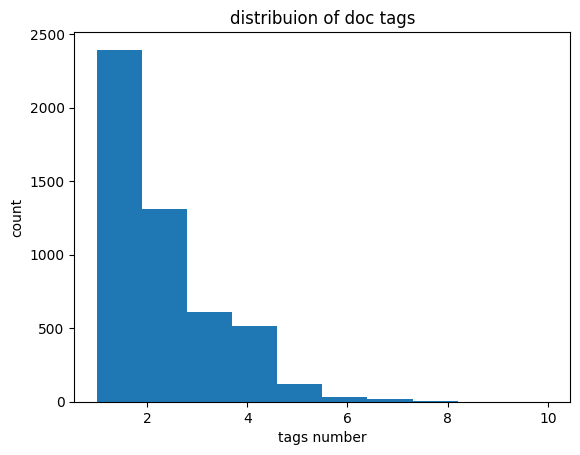

In [ ]:
plt.hist([len(doc.metadata['tags']) for doc in docs], bins=10)
plt.title('distribuion of doc tags')
plt.xlabel('tags number')
plt.ylabel('count')
plt.show()

In [ ]:
docs_many_tags = []
for i, doc in enumerate(docs):
    if len(doc.metadata['tags']) > 3:
        docs_many_tags.append(i)
print(f'{len(docs_many_tags)} docs many tags')
print(f'example: {docs_many_tags[:5]}')

690 docs many tags
example: [6, 8, 23, 26, 32]


In [ ]:
docs[0], docs[1], docs[38]

(Document(metadata={'id': 224, 'name': 'Белогент®', 'upname': 'БЕЛОГЕНТ®', 'searchname': 'БЕЛОГЕНТ', 'slug': 'belogent', 'tags': ['Состав', 'Способ применения и дозы'], 'doc_id': 0}, page_content='<p>Состав</p>Мазь для наружного применения1 гдействующие вещества: бетаметазона дипропионат0,640 мгв пересчете на бетаметазон — 0,500 мг гентамицина сульфат1,660 мгв пересчете на гентамицин — 1 мг вспомогательные вещества: парафин жидкий — 50,0000 мг; парафин мягкий белый — q.s. до 1 г <p>Способ_применения_и_дозы</p>Местно.Белогент® наносят на пораженный участок тонким слоем, слегка втирая, 1–2 раза в сутки. Область кожи, на которую наносится мазь, не должна превышать 10% общей поверхности кожи. На участки с более плотной кожей (например, локти, ладони и стопы), а также места, с которых препарат легко стирается, препарат можно наносить чаще, но не более 4 раз в сутки. Необходимую частоту применения должен установить врач, ориентируясь на тяжесть заболевания. В легких случаях применение один р

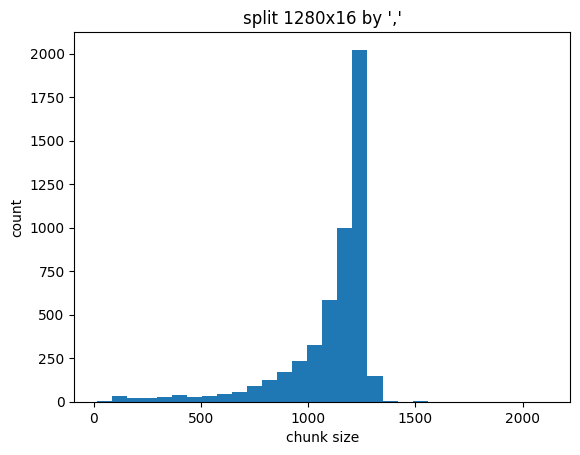

In [ ]:
plt.hist(list(map(lambda x: len(x.page_content), texts_filtered)), bins=30)
title = f'split {CHUNK_SIZE}x{CHUNK_OVERLAP} by \'{separator}\''
plt.title(title)
plt.xlabel('chunk size')
plt.ylabel('count')
plt.savefig(f'graphics/{title}.png')
plt.show()

In [ ]:
chunks_by_id = {}
for chunk in texts_filtered:
    drug_id = chunk.metadata['id']
    if drug_id not in chunks_by_id:
        chunks_by_id[drug_id] = []
    chunks_by_id[drug_id].append(chunk)
chunks_by_id[12517]

[Document(metadata={'id': 12517, 'name': 'Ребамипид-СЗ', 'upname': 'РЕБАМИПИД-СЗ', 'searchname': 'РЕБАМИПИД-СЗ', 'slug': 'rebamipid-sz', 'tags': ['Условия отпуска из аптек', 'Состав', 'Описание лекарственной формы', 'Фармакодинамика'], 'doc_id': 2726}, page_content='<p>Состав</p>Таблетки, покрытые пленочной оболочкой1 табл.действующее вещество: ребамипид100 мгвспомогательные вещества: целлюлоза микрокристаллическая 102 — 56,7 мг; крахмал прежелатинизированный (крахмал 1500) — 46,8 мг; гипромеллоза (гидроксипропилметилцеллюлоза) — 5,8 мг; коллидон SR (поливинилацетат 80%, повидон 19%, натрия лаурилсульфат 0,8%, кремния диоксид 0,2%) — 19,2 мг; лимонная кислота — 2,3 мг; натрия лаурилсульфат — 2 мг; тальк — 4,8 мг; магния стеарат — 2,4 мг оболочка пленочная: гипромеллоза — 3,57 мг; полисорбат 80 (твин 80) — 1,49 мг; тальк — 1,19 мг; титана диоксид (Е171) — 0,75 мг <p>Описание_лекарственной_формы</p>Таблетки, покрытые пленочной оболочкой, белого или почти белого цвета, круглые, двояковыпу

In [ ]:
def overlap(x, y):
    k = min(len(x), len(y))
    result = None
    for i in range(k):
        t = x[len(x) - i - 1:]
        # print('check', t)
        if y.startswith(t):
            result = len(x) - i - 1
    return result


overlap_index = overlap('abcabcabc', 'abcx')
print(overlap_index)
print('abcabcabc'[:overlap_index])

6
abcabc


In [ ]:
def snippet_in_chunks(snippet, _chunks):
    chunks = _chunks.copy()
    # for i in range(len(chunks)):
        # try:
        # j = chunks[i].find('\t')
        # print(j)
        # if j != -1:
        #     chunks[i] = chunks[i][j + 1:]
                # print(chunk)
                # raise ValueError
        # except Exception as e:
            # print(e)
    # print(chunks)
    chunks_new = [chunks[0]] if len(chunks) > 0 else []
    for i in range(1, len(chunks)):
        overlap_index = overlap(chunks[i - 1], chunks[i])
        if overlap_index is None:
            chunks_new.append(chunks[i])
            continue
        k = len(chunks[i - 1]) - overlap_index
        chunk_new = chunks[i][k:]
        chunks_new.append(chunk_new)
    # print(chunks_new)
    chunks_content = ''.join(chunks_new)
    # print('snippet:', snippet)
    # print('chunks content:', chunks_content)
    if snippet not in chunks_content:
        return []
    index = chunks_content.find(snippet)
    assert index != -1
    result = []
    l = 0
    in_snippet = False
    for i in range(len(chunks_new)):
        r = l + len(chunks_new[i])
        if not in_snippet:
            if index < r:
                in_snippet = True
        else:
            if index + len(snippet) <= l:
                in_snippet = False
                break
        if in_snippet:
            result.append(i)
        l = r
    return result


chunks = ['1234567', '6789101112', '011123', '999']
snippet = '7891011123999'
snippet_in_chunks(snippet, chunks)

[0, 1, 2, 3]

In [ ]:
snippet = 'преимущественно в неизмененном виде. При приеме в дозе 600 мг удается выделить следы гидроксилированного метаболита. В опытах in vitro показано, что от 98,4 до 98,6% препарата связывается белками плазмы.\nязвенная болезнь желудка;хронический гастрит с повышенной кислотообразующей функцией желудка в стадии обострения;эрозивный гастрит;предотвращение возникновения повреждений слизистой оболочки на фоне приема НПВП.Может использоваться в составе комбинированной терапии.\nиндивидуальная непереносимость ребамипида или других компонентов препарата;беременность;период лактации;детский возраст до 18 лет.С осторожностью: рекомендуется соблюдать осторожность при первом назначении ребамипида пациентам пожилого возраста в связи с возможностью возникновения повышенной чувствительности к препарату.\nБезопасность применения ребамипида в период беременности не доказана. Не применять во время беременности.Поскольку ребамипид проникает в грудное молоко'
indexes = snippet_in_chunks(
    snippet.replace('\n', ''),
    [extract_tags_with_content(chunk.page_content)[1] for chunk in chunks_by_id[12517]]
)
print(indexes)
chunks_by_id[12517]

[1, 2]


[Document(metadata={'id': 12517, 'name': 'Ребамипид-СЗ', 'upname': 'РЕБАМИПИД-СЗ', 'searchname': 'РЕБАМИПИД-СЗ', 'slug': 'rebamipid-sz', 'tags': ['Условия отпуска из аптек', 'Состав', 'Описание лекарственной формы', 'Фармакодинамика'], 'doc_id': 2726}, page_content='<p>Состав</p>Таблетки, покрытые пленочной оболочкой1 табл.действующее вещество: ребамипид100 мгвспомогательные вещества: целлюлоза микрокристаллическая 102 — 56,7 мг; крахмал прежелатинизированный (крахмал 1500) — 46,8 мг; гипромеллоза (гидроксипропилметилцеллюлоза) — 5,8 мг; коллидон SR (поливинилацетат 80%, повидон 19%, натрия лаурилсульфат 0,8%, кремния диоксид 0,2%) — 19,2 мг; лимонная кислота — 2,3 мг; натрия лаурилсульфат — 2 мг; тальк — 4,8 мг; магния стеарат — 2,4 мг оболочка пленочная: гипромеллоза — 3,57 мг; полисорбат 80 (твин 80) — 1,49 мг; тальк — 1,19 мг; титана диоксид (Е171) — 0,75 мг <p>Описание_лекарственной_формы</p>Таблетки, покрытые пленочной оболочкой, белого или почти белого цвета, круглые, двояковыпу

In [ ]:
with open('qa_200.json', 'r', encoding='utf-8') as f:
    qa_dataset = json.load(f)
qa_dataset_df = pd.DataFrame.from_records(data=qa_dataset, index='id')
print(len(qa_dataset_df))
qa_dataset_df.head(3)

200


,drug_name,drug_slug,question_type,question,reference_answer,source_text_snippet
id,,,,,,
0,[Белогент®],[belogent],factual,Какие действующие вещества содержатся в мази Б...,В мази Белогент® содержатся два действующих ве...,"[{'id': 224, 'name': 'БЕЛОГЕНТ', 'text': '1 гд..."
1,[Белогент®],[belogent],procedural,Как правильно применять мазь Белогент® и каков...,Мазь Белогент® наносят на пораженный участок т...,"[{'id': 224, 'name': 'БЕЛОГЕНТ', 'text': 'Мест..."
2,[Белогент®],[belogent],safety,Какие существуют особые предосторожности при п...,"При применении мази Белогент® на лице, на учас...","[{'id': 224, 'name': 'БЕЛОГЕНТ', 'text': 'При ..."


In [ ]:
def get_matching_chunks_number(row):
    k = 0
    matching_chunks_ids = set()
    matching_chunks = []
    recall = 0
    for snippet in row.source_text_snippet:
        snippet['text'] = snippet['text'].replace('\n', '')
        chunk_id = snippet['id']
        chunks = chunks_by_id[chunk_id]
        # indexes = snippet_in_chunks(snippet['text'], [chunk.page_content for chunk in chunks])
        indexes = snippet_in_chunks(snippet['text'], [extract_tags_with_content(chunk.page_content)[1] for chunk in chunks])
        for i in indexes:
            chunk_id = chunks[i].metadata['doc_id']
            if chunk_id not in matching_chunks_ids:
                matching_chunks_ids.add(chunk_id)
                matching_chunks.append(chunks[i])
        if len(indexes) != 0:
            recall += 1
    recall /= len(row.source_text_snippet)
    return matching_chunks, recall


qa_dataset_df['matching_chunks'] = qa_dataset_df.apply(lambda row: get_matching_chunks_number(row)[0], axis=1)
qa_dataset_df['matching_chunks_recall'] = qa_dataset_df.apply(lambda row: get_matching_chunks_number(row)[1], axis=1)
qa_dataset_df['matching_chunks_number'] = qa_dataset_df.apply(lambda row: len(row['matching_chunks']), axis=1)
print(qa_dataset_df['matching_chunks_number'].value_counts())
print(qa_dataset_df['matching_chunks_recall'].value_counts())

matching_chunks_number
1    97
2    85
3    15
4     3
Name: count, dtype: int64
matching_chunks_recall
1.0    200
Name: count, dtype: int64


In [ ]:
qa_dataset_df['matching_chunks_number'].sum()

324

In [ ]:
assert len(qa_dataset_df[qa_dataset_df['matching_chunks_recall'] != 1.0]) == 0

In [ ]:
qa_dataset_df[qa_dataset_df['matching_chunks_recall'] != 1.0]

,drug_name,drug_slug,question_type,question,reference_answer,source_text_snippet,matching_chunks,matching_chunks_recall,matching_chunks_number
id,,,,,,,,,


In [ ]:
qa_dataset_df[qa_dataset_df['matching_chunks_number'] == 0]

,drug_name,drug_slug,question_type,question,reference_answer,source_text_snippet,matching_chunks,matching_chunks_recall,matching_chunks_number
id,,,,,,,,,


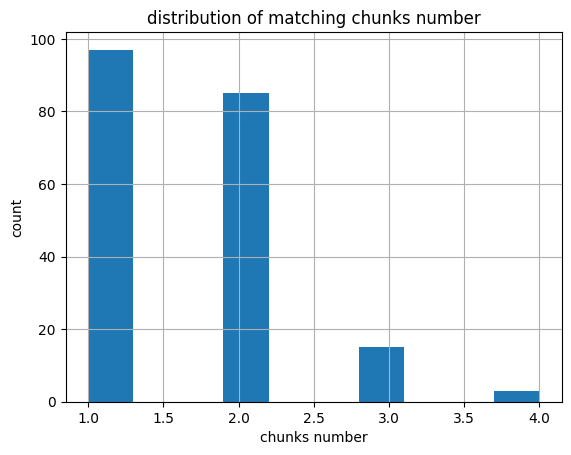

In [ ]:
qa_dataset_df['matching_chunks_number'].hist(bins=10)
plt.title('distribution of matching chunks number')
plt.xlabel('chunks number')
plt.ylabel('count')
plt.show()

In [ ]:
def apply_matching_chunks_style(row):
    result = [{
        'id': doc.metadata['id'] ,
        'name': doc.metadata['searchname'],
        'text': doc.page_content
    } for doc in row]
    return result


qa_dataset_df['chunks'] = qa_dataset_df['matching_chunks'].apply(lambda row: apply_matching_chunks_style(row))
# qa_dataset_df.reset_index(inplace=True)
qa_dataset_df['id'] = qa_dataset_df.index
column = qa_dataset_df.pop('id')
qa_dataset_df.insert(0, 'id', column)
qa_dataset_df.head(3)

,id,drug_name,drug_slug,question_type,question,reference_answer,source_text_snippet,matching_chunks,matching_chunks_recall,matching_chunks_number,chunks
id,,,,,,,,,,,
0,0,[Белогент®],[belogent],factual,Какие действующие вещества содержатся в мази Б...,В мази Белогент® содержатся два действующих ве...,"[{'id': 224, 'name': 'БЕЛОГЕНТ', 'text': '1 гд...",[page_content='<p>Состав</p>Мазь для наружного...,1.0,1,"[{'id': 224, 'name': 'БЕЛОГЕНТ', 'text': '<p>С..."
1,1,[Белогент®],[belogent],procedural,Как правильно применять мазь Белогент® и каков...,Мазь Белогент® наносят на пораженный участок т...,"[{'id': 224, 'name': 'БЕЛОГЕНТ', 'text': 'Мест...",[page_content='<p>Состав</p>Мазь для наружного...,1.0,2,"[{'id': 224, 'name': 'БЕЛОГЕНТ', 'text': '<p>С..."
2,2,[Белогент®],[belogent],safety,Какие существуют особые предосторожности при п...,"При применении мази Белогент® на лице, на учас...","[{'id': 224, 'name': 'БЕЛОГЕНТ', 'text': 'При ...",[page_content='<p>Состав</p>Мазь для наружного...,1.0,2,"[{'id': 224, 'name': 'БЕЛОГЕНТ', 'text': '<p>С..."


In [ ]:
qa_dataset_snippets = qa_dataset_df.drop(columns=['chunks', 'matching_chunks', 'matching_chunks_number', 'matching_chunks_recall']).rename(columns={'source_text_snippet': 'chunks'}).to_json(orient='records', indent=2, force_ascii=False)
qa_dataset = json.loads(qa_dataset_snippets)
with open('qa_200_snippets.json', 'w', encoding='utf-8') as f:
    json.dump(qa_dataset, f, ensure_ascii=False, indent=2)

In [ ]:
qa_dataset_chunks = qa_dataset_df.drop(columns=['source_text_snippet', 'matching_chunks', 'matching_chunks_number', 'matching_chunks_recall']).to_json(orient='records', indent=2, force_ascii=False)
qa_dataset = json.loads(qa_dataset_chunks)
with open('qa_200_chunks.json', 'w', encoding='utf-8') as f:
    json.dump(qa_dataset, f, ensure_ascii=False, indent=2)

In [ ]:
def insert_metadata(docs):
    '''
    preprocess documents before embedding or after retrieval
    '''
    result = copy.deepcopy(docs)
    for doc in result:
        # name + tags
        _, clean_text = extract_tags_with_content(doc.page_content)
        doc.page_content = doc.metadata['name'] + ' ' + '. '.join(doc.metadata['tags']) + '\t' + clean_text

        # name + tags + tags at their position
        # doc.page_content = doc.metadata['name'] + ' ' + '. '.join(doc.metadata['tags']) + '\t' + remove_tags(doc.page_content.replace('_', ' '))

        # name + tags positioned
        # doc.page_content = doc.metadata['name'] + '\t' + remove_tags(doc.page_content.replace('_', ' '))

        # raw
        # doc.page_content = doc.page_content
    return result

insert_metadata([docs[0]])
# docs[0]

[Document(metadata={'id': 224, 'name': 'Белогент®', 'upname': 'БЕЛОГЕНТ®', 'searchname': 'БЕЛОГЕНТ', 'slug': 'belogent', 'tags': ['Состав', 'Способ применения и дозы'], 'doc_id': 0}, page_content='Белогент® Состав. Способ применения и дозы\tМазь для наружного применения1 гдействующие вещества: бетаметазона дипропионат0,640 мгв пересчете на бетаметазон — 0,500 мг гентамицина сульфат1,660 мгв пересчете на гентамицин — 1 мг вспомогательные вещества: парафин жидкий — 50,0000 мг; парафин мягкий белый — q.s. до 1 г Местно.Белогент® наносят на пораженный участок тонким слоем, слегка втирая, 1–2 раза в сутки. Область кожи, на которую наносится мазь, не должна превышать 10% общей поверхности кожи. На участки с более плотной кожей (например, локти, ладони и стопы), а также места, с которых препарат легко стирается, препарат можно наносить чаще, но не более 4 раз в сутки. Необходимую частоту применения должен установить врач, ориентируясь на тяжесть заболевания. В легких случаях применение один р

In [ ]:
class PerfectRetriever():
    def __init__(self, df):
        self.df = df
        self.id_by_question = {}
        for row in self.df.itertuples():
            self.id_by_question[row.question] = row.Index

    def invoke(self, question, k=None):
        qa_id = self.id_by_question[question]
        return insert_metadata(self.df.loc[qa_id]['matching_chunks'])


    def batch(self, questions, config=None, k=None):
        docs_batch = []
        for question in questions:
            retrieved_docs = self.invoke(question)
            docs_batch.append(retrieved_docs)
        return docs_batch


perfect_retreiver = PerfectRetriever(qa_dataset_df)
print(perfect_retreiver.invoke('Как принимать препарат ТАБАКЕТТЕ® для отказа от курения?'))
print(perfect_retreiver.batch(['Какие действующие вещества содержатся в мази Белогент® и в каких количествах?']))

[Document(metadata={'id': 16429, 'name': 'ТАБАКЕТТЕ®', 'upname': 'ТАБАКЕТТЕ®', 'searchname': 'ТАБАКЕТТЕ', 'slug': 'tabakette', 'tags': ['Способ применения и дозы'], 'doc_id': 3652}, page_content='ТАБАКЕТТЕ® Способ применения и дозы\t, запивая достаточным количеством жидкости. Не следует превышать рекомендованные дозы.Режим дозированияПрием препарата ТАБАКЕТТЕ® желательно начинать после принятия пациентом установки на полный отказ от курения.Рекомендуемая схема приема: с 1-го по 3-й день — по 1 табл. 6 раз в день, каждые 2 ч, постепенно сокращая число выкуренных сигарет. Таблетку следует принимать между эпизодами курения для удлинения интервалов между выкуриванием сигарет, чтобы максимально снизить их потребление. Интервал приема каждые 2 ч должен соблюдаться.Если не удается добиться снижения  суточного потребления сигарет, лечение следует прекратить и через 2–3 мес можно начать его снова.При хорошем эффекте лечение продолжают по следующей схеме: с 4-го по 12-й день приема — по 1 табл. 

In [ ]:
def filter_docs(docs):
    return docs
    docs_filtered = []
    sources = set()
    for doc in docs:
        metadata = f'{doc.metadata["text"]}.{doc.metadata["row"]}'
        if metadata not in sources:
            sources.add(metadata)
            docs_filtered.append(doc)
    return docs_filtered


def retrieve(retriever, question, k=None):
    retrieved_docs = retriever.invoke(question, k=k) if k is not None else retriever.invoke(question)
    retrieved_docs = filter_docs(retrieved_docs)
    return retrieved_docs


def retrieve_batched(retriever, questions, max_concurrency=8, k=None):
    if k is not None:
        docs_batch = retriever.batch(questions, config={'max_concurrency': max_concurrency}, k=k)
    else:
        docs_batch = retriever.batch(questions, config={'max_concurrency': max_concurrency})
    docs_batch = [filter_docs(docs) for docs in docs_batch]
    return docs_batch

In [ ]:
retrieve(perfect_retreiver, 'Как правильно применять мазь Белогент® и какова максимальная продолжительность лечения?')

[Document(metadata={'id': 224, 'name': 'Белогент®', 'upname': 'БЕЛОГЕНТ®', 'searchname': 'БЕЛОГЕНТ', 'slug': 'belogent', 'tags': ['Состав', 'Способ применения и дозы'], 'doc_id': 0}, page_content='Белогент® Состав. Способ применения и дозы\tМазь для наружного применения1 гдействующие вещества: бетаметазона дипропионат0,640 мгв пересчете на бетаметазон — 0,500 мг гентамицина сульфат1,660 мгв пересчете на гентамицин — 1 мг вспомогательные вещества: парафин жидкий — 50,0000 мг; парафин мягкий белый — q.s. до 1 г Местно.Белогент® наносят на пораженный участок тонким слоем, слегка втирая, 1–2 раза в сутки. Область кожи, на которую наносится мазь, не должна превышать 10% общей поверхности кожи. На участки с более плотной кожей (например, локти, ладони и стопы), а также места, с которых препарат легко стирается, препарат можно наносить чаще, но не более 4 раз в сутки. Необходимую частоту применения должен установить врач, ориентируясь на тяжесть заболевания. В легких случаях применение один р

In [ ]:
def metrics_at_k(retriever, qa_dataset, k=3):
    perfect_retreiver = PerfectRetriever(qa_dataset_df)
    hits = 0
    n = 0
    mrrs = []
    for i, qa_item in enumerate(tqdm(qa_dataset)):
        question = qa_item['question']
        matching_chunks = retrieve(perfect_retreiver, question, k=k)
        matching_chunks_ids = set([chunk.metadata['doc_id'] for chunk in matching_chunks])
        retrieved_docs = retrieve(retriever, question, k=k)
        chunks_ids = set([doc.metadata['doc_id'] for doc in retrieved_docs])
        mrr = 0.0
        for j, chunk_id in enumerate([doc.metadata['doc_id'] for doc in retrieved_docs]):
            if chunk_id in matching_chunks_ids:
                mrr = 1 / (1 + j)
                break
        mrrs.append(mrr)
        n += len(matching_chunks_ids)
        hits += len(chunks_ids & matching_chunks_ids)
        if i % 16 == 0:
            torch.cuda.empty_cache()
            gc.collect()
    recall = hits / n
    mrr = np.mean(mrrs)
    return recall, mrr


def print_metrics(recall, mrr, k):
    print(f'recall@{k}:\t{recall:.4f}')
    print(f'mrr@{k}   :\t{mrr:.4f}')

In [ ]:
# METRICS_TEMPLATE = pd.DataFrame(columns=[
#     'vector_store', 'search_type', 'embeddings', 'chunk_size', 'chunk_overlap',
#     'recall@2', 'recall@3', 'recall@7', 'recall@10',
#     'mrr@2', 'mrr@3', 'mrr@7', 'mrr@10', ''
# ])
# metrics = METRICS_TEMPLATE.copy()
# metrics.to_csv('metrics/metrics.csv')

metrics = pd.read_csv('metrics/metrics.csv', index_col=0)

def sort_metrics():
    global metrics
    metrics = metrics.sort_values(by=['recall@3'], ascending=False)

def update_metrics(vector_store_name, search_type, embeddings_name, chunk_size, chunk_overlap, recall, mrr, info):
    global metrics
    metrics.loc[len(metrics)] = [
        vector_store_name, search_type, embeddings_name, chunk_size, chunk_overlap,
        *recall,
        *mrr,
        info,
    ]
    sort_metrics()


def save_metrics():
    global metrics
    sort_metrics()
    metrics.to_csv('metrics/metrics.csv')


sort_metrics()
metrics

,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
5,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.000000,0.761610,0.000000,0.000000,0.000000,0.784167,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
4,qdrant,jina-reranker-v3,BERTA,1280,32,0.626984,0.734127,0.000000,0.000000,0.786164,0.808176,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
1,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.607143,0.722222,0.861111,0.892857,0.683962,0.706604,0.723168,0.723383,"[200 split ',' q] имя теги вначале"
6,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1024,128,0.000000,0.695652,0.000000,0.000000,0.000000,0.802500,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
3,qdrant,Qwen3-Reranker-0.6B,F2LLM-v2-0.6B,1280,32,0.584229,0.691756,0.000000,0.000000,0.714706,0.751961,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
10,qdrant,dense,F2LLM-v2-0.6B,1280,16,0.000000,0.682099,0.000000,0.000000,0.000000,0.705000,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
11,qdrant,dense,F2LLM-v2-0.6B,1280,8,0.000000,0.675926,0.000000,0.000000,0.000000,0.703333,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
12,qdrant,dense,F2LLM-v2-0.6B,1280,8,0.000000,0.675926,0.000000,0.870370,0.000000,0.703333,0.000000,0.728006,"[200 split ',' q] имя теги вначале"
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.000000,0.671827,0.000000,0.000000,0.000000,0.703333,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
13,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.000000,0.671827,0.000000,0.869969,0.000000,0.703333,0.000000,0.729006,"[200 split ',' q] имя теги вначале"


In [ ]:
print('[PERFECT] PERFECT')
perfect_retreiver = PerfectRetriever(qa_dataset_df)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    recall, mrr = metrics_at_k(perfect_retreiver, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('perfect', 'perfect', 'perfect', CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, 'идеальный retreival')
# save_metrics()
# metrics

[PERFECT] PERFECT


  0%|          | 0/200 [00:00<?, ?it/s]

recall@2:	1.0000
mrr@2   :	1.0000


  0%|          | 0/200 [00:00<?, ?it/s]

recall@3:	1.0000
mrr@3   :	1.0000


  0%|          | 0/200 [00:00<?, ?it/s]

recall@7:	1.0000
mrr@7   :	1.0000


  0%|          | 0/200 [00:00<?, ?it/s]

recall@10:	1.0000
mrr@10   :	1.0000


## chromadb

In [ ]:
EMBEDS_MODEL_NAME = 'intfloat/multilingual-e5-small'
LOCAL_DIR = 'embeddings/multilingual-e5-small'
collection_name=f'multilingual-e5-small'

_ = snapshot_download(
    repo_id=EMBEDS_MODEL_NAME,
    local_dir=LOCAL_DIR,
    ignore_patterns=['*.bin', 'onnx/', 'openvino/']
)

Fetching 32 files:   0%|          | 0/32 [00:00<?, ?it/s]

In [ ]:
embeddings = HuggingFaceEmbeddings(model_name=LOCAL_DIR)
vector_size=len(embeddings.embed_query(''))
collection_name, vector_size, embeddings.model_name

('multilingual-e5-small', 384, 'embeddings/multilingual-e5-small')

In [ ]:
chroma_client = chromadb.PersistentClient(path="./chroma_langchain_db")

In [ ]:
len(texts_filtered)

5660

In [ ]:
# collection_exists = False
# try:
#     db.get_collection(COLLECTION_NAME)
# except:
#     col_exists = False
# if client.co(collection_name):
#     print(f'collection "{collection_name}" already exists')
# else:
#     print(f'create collection "{collection_name}"')
    # client.create_collection(
    #     collection_name,
    #     vectors_config=models.VectorParams(
    #         size=vector_size,
    #         distance=models.Distance.COSINE,
    #         on_disk=True
    #     ),
    # )

# client.collection_exists()

# build db
db = Chroma.from_documents(
    texts_filtered,
    embeddings,
    collection_name='airag',
    persist_directory="chroma_langchain_db"
)

# load db
# db = Chroma(
#     client=client,
#     collection_name='airag',
#     embedding_function=embeddings,
# )

# db.delete_collection()

In [ ]:
len(db.get()['metadatas'])

5660

In [ ]:
# for batched similarity_search
retriever = db.as_retriever(
    search_type="similarity",
    search_kwargs={"k": 3}
)

In [ ]:
bm25_retriever = BM25Retriever.from_documents(
    texts_filtered,
    preprocess_func=word_tokenize,
)

In [ ]:
retrieve_batched(bm25_retriever, ['Какие действующие вещества содержатся в мази Белогент® и в каких количествах?'], k=3)

[[Document(metadata={'id': 17523, 'name': 'АДАСЕЛЬ®', 'upname': 'АДАСЕЛЬ®', 'searchname': 'АДАСЕЛЬ', 'slug': 'adasel', 'doc_id': 4779}, page_content='АДАСЕЛЬ®\tСуспензия для внутримышечного введения1 доза (0,5 мл)действующие вещества: столбнячный анатоксин адсорбированный5 Lf (не менее 20 ME)дифтерийный анатоксин адсорбированный2 Lf (не менее 2 ME)бесклеточная коклюшная вакцина, содержащая коклюшный анатоксин (КА) адсорбированный2,5 мкгфиламентозный гемагглютинин (ФГА) адсорбированный5 мкгагглютиногены фимбрий типов 2 и 3 (ФИМ) адсорбированные5 мкгпертактин (ПРН) адсорбированный3 мкгвспомогательные вещества1: алюминия фосфат (в пересчете на алюминий) — 1,5 мг (0,33 мг); 2-феноксиэтанол — 0,6% (о/о) (3,33 мг); вода для инъекций — до 0,5 мл 1 Остаточные продукты производственного процесса, присутствующие в 1 дозе вакцины (0,5 мл) в следовых количествах (указано их расчетное количество): формальдегид (не более 0,5 мкг) и глутаральдегид (менее 50 нг) \nБелая, мутная, однородная суспензия.\

In [ ]:
# update_metrics('chroma', 'dense', 'kek', CHUNK_SIZE, CHUNK_OVERLAP, [1, 2, 3, 4], [5, 6, 7, 8])
# metrics = METRICS_TEMPLATE
# save_metrics()
# metrics

,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10


In [ ]:
print('[DENSE] Chroma')
vector_store = Chroma(
    client=client,
    collection_name='airag',
    embedding_function=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = db.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('chroma', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
save_metrics()
metrics

[DENSE] Chroma
recall@2:	0.6639
mrr@2   :	0.7283
recall@3:	0.7022
mrr@3   :	0.7394
recall@7:	0.7787
mrr@7   :	0.7514
recall@10:	0.8142
mrr@10   :	0.7540


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10
0,chroma,dense,multilingual-e5-small,1024,256,0.663934,0.702186,0.778689,0.814208,0.728333,0.739444,0.751413,0.753987


In [ ]:
print('[SPARSE] BM25')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = BM25Retriever.from_documents(
        texts_filtered,
        k=k,
        preprocess_func=word_tokenize,
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('bm25', 'sparse', 'bm25', CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
# metrics

[SPARSE] BM25


  0%|          | 0/212 [00:00<?, ?it/s]

recall@2:	0.2299
mrr@2   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@3:	0.2985
mrr@3   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@7:	0.4269
mrr@7   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@10:	0.5015
mrr@10   :	0.0000


In [ ]:
print('[SPARSE] BM25')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = BM25Retriever.from_documents(
        texts_filtered,
        k=k,
        preprocess_func=word_tokenize,
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('bm25', 'sparse', 'bm25', CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
# metrics

[SPARSE] BM25


  0%|          | 0/212 [00:00<?, ?it/s]

recall@2:	0.1493
mrr@2   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@3:	0.2149
mrr@3   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@7:	0.3164
mrr@7   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@10:	0.3522
mrr@10   :	0.0000


## qdrant

F2LLM-v2-0.6B_1024_32_test - разбиение через ' ', к чанку добавляется имя лекарства
F2LLM-v2-0.6B_1024_32_test_2 - разбиение через ' ', к чанку добавляется имя лекарства и теги (применения, противопоказания и т д)

In [ ]:
if 'client' not in locals():
    client = QdrantClient(path="qdrant")

In [ ]:
query_encode_prefix = ''
doc_encode_prefix = ''

In [ ]:
EMBEDS_MODEL_NAME = 'sergeyzh/BERTA'
LOCAL_DIR = 'embeddings/BERTA'
collection_name=f'BERTA_{CHUNK_SIZE}_{CHUNK_OVERLAP}'
query_encode_prefix = 'search_query: '
doc_encode_prefix = 'search_document: '

In [ ]:
EMBEDS_MODEL_NAME = 'codefuse-ai/F2LLM-v2-0.6B'
LOCAL_DIR = 'embeddings/F2LLM-v2-0.6B'
collection_name=f'F2LLM-v2-0.6B_{CHUNK_SIZE}_{CHUNK_OVERLAP}'
query_encode_prefix = 'Instruct: Given a question, retrieve passages that can help answer the question.\nQuery: '
doc_encode_prefix = ''
collection_name

'F2LLM-v2-0.6B_1280_16'

In [ ]:
EMBEDS_MODEL_NAME = 'google/embeddinggemma-300m'
LOCAL_DIR = 'embeddings/embeddinggemma-300m'
collection_name=f'embeddinggemma-300m_{CHUNK_SIZE}_{CHUNK_OVERLAP}'
query_encode_prefix = 'task: search result | query: '
doc_encode_prefix = 'title: {title | "none"} | text: {content}'

In [ ]:
EMBEDS_MODEL_NAME = 'intfloat/multilingual-e5-small'
LOCAL_DIR = 'embeddings/multilingual-e5-small'
collection_name=f'multilingual-e5-small_{CHUNK_SIZE}_{CHUNK_OVERLAP}'

In [ ]:
EMBEDS_MODEL_NAME = 'intfloat/multilingual-e5-base'
LOCAL_DIR = 'embeddings/multilingual-e5-base'
collection_name=f'multilingual-e5-base_{CHUNK_SIZE}_{CHUNK_OVERLAP}'

In [ ]:
EMBEDS_MODEL_NAME = 'Qwen/Qwen3-Embedding-0.6B'
LOCAL_DIR = 'embeddings/Qwen3-Embedding-0.6B'
collection_name=f'Qwen3-Embedding-0.6B_{CHUNK_SIZE}_{CHUNK_OVERLAP}'

In [ ]:
EMBEDS_MODEL_NAME = 'Qwen/Qwen3-Embedding-4B'
LOCAL_DIR = 'embeddings/Qwen3-Embedding-4B'
collection_name=f'Qwen3-Embedding-4B_{CHUNK_SIZE}_{CHUNK_OVERLAP}'

In [ ]:
with open('HF_TOKEN', 'r') as f:
    HF_TOKEN = f.read().strip()
from huggingface_hub import login
login(HF_TOKEN)
_ = snapshot_download(
    repo_id=EMBEDS_MODEL_NAME,
    local_dir=LOCAL_DIR,
    ignore_patterns=['*.bin', 'onnx/', 'openvino/']
)

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

In [ ]:
HYBRID = True
SUFFIX = '_hybrid'
print(f'doc_encode_prefix: {doc_encode_prefix}')
print(f'query_encode_prefix: {query_encode_prefix}')
embeddings = HuggingFaceEmbeddings(
    model_name=LOCAL_DIR,
    encode_kwargs={'prompt': doc_encode_prefix},
    query_encode_kwargs={'prompt': query_encode_prefix},
)
sparse_embeddings_name = 'Qdrant/BM25'
sparse_embeddings = FastEmbedSparse(model_name=sparse_embeddings_name)
vector_size=len(embeddings.embed_query(''))
if HYBRID and not collection_name.endswith(SUFFIX):
    collection_name += SUFFIX
elif not HYBRID:
    assert not collection_name.endswith(SUFFIX)
collection_info = [collection_name, vector_size, embeddings.model_name]
if HYBRID:
    collection_info.append(sparse_embeddings_name)
collection_info

doc_encode_prefix: 
query_encode_prefix: Instruct: Given a question, retrieve passages that can help answer the question.
Query: 


['F2LLM-v2-0.6B_1280_16_hybrid',
 1024,
 'embeddings/F2LLM-v2-0.6B',
 'Qdrant/BM25']

In [ ]:
embeddings.embed_documents(['hello world'])[0][:5], embeddings.embed_query('hello world')[:5]

([-0.007058096583932638,
  0.13361670076847076,
  -0.09011583775281906,
  -0.030342290177941322,
  -0.020070094615221024],
 [-0.018431108444929123,
  0.1451551467180252,
  -0.06614083796739578,
  0.0035136155784130096,
  -0.006626263726502657])

In [ ]:
client.delete_collection(collection_name)

True

In [ ]:
if client.collection_exists(collection_name):
    print(f'collection "{collection_name}" already exists')
else:
    print(f'create collection "{collection_name}"')
    if HYBRID:
        client.create_collection(
            collection_name,
            vectors_config={'dense': models.VectorParams(
                size=vector_size,
                distance=models.Distance.COSINE,
                on_disk=True
            )},
            sparse_vectors_config={'sparse': SparseVectorParams(
                index=models.SparseIndexParams(on_disk=True)
            )},
        )
    else:
        client.create_collection(
            collection_name,
            vectors_config=models.VectorParams(
                size=vector_size,
                distance=models.Distance.COSINE,
                on_disk=True
            ),
        )

collection "F2LLM-v2-0.6B_1280_16_hybrid" already exists


In [ ]:
print(f'inserting {len(docs)} vectors with HYBRID = {HYBRID}')
batch_size = 32
for i in tqdm(range(0, len(texts_filtered), batch_size)):
    docs_batch = docs[i:i + batch_size]
    docs_batch = insert_metadata(docs_batch)
    docs_uuids_batch = docs_uuids[i:i + batch_size]
    with torch.no_grad():
        dense_vectors = embeddings.embed_documents([doc.page_content for doc in docs_batch])
        if HYBRID:
            sparse_vectors = sparse_embeddings.embed_documents([doc.page_content for doc in docs_batch])
    if HYBRID:
        qdrant_vectors = [
            {'dense': dense_vectors[j],
            'sparse': {
                'indices': sparse_vectors[j].indices,
                'values': sparse_vectors[j].values
            }}
        for j in range(len(dense_vectors))]
    else:
        qdrant_vectors = dense_vectors

    docs_metadatas = [
        {
            'metadata': doc.metadata,
            'page_content': doc.page_content
        }
        for doc in docs_batch
    ]

    client.upload_collection(
        collection_name=collection_name,
        ids=docs_uuids_batch,
        vectors=qdrant_vectors,
        payload=docs_metadatas,
        batch_size=batch_size # may be different from batch_size for embeddings
    )
    if i % 256 == 0:
        torch.cuda.empty_cache()
        gc.collect()

inserting 4999 vectors with HYBRID = True


  0%|          | 0/157 [00:00<?, ?it/s]

In [ ]:
info = client.get_collection(collection_name)
info.points_count, info.config.params.vectors

(5005,
 {'dense': VectorParams(size=1024, distance=<Distance.COSINE: 'Cosine'>, hnsw_config=None, quantization_config=None, on_disk=True, datatype=None, multivector_config=None)})

### reranker

#### 'Qwen/Qwen3-Reranker-0.6B'

In [ ]:
RERANKER_MODEL_NAME = 'Qwen/Qwen3-Reranker-0.6B'
RERANKER_LOCAL_DIR = 'models/Qwen3-Reranker-0.6B'
_ = snapshot_download(
    repo_id=RERANKER_MODEL_NAME,
    local_dir=RERANKER_LOCAL_DIR,
    ignore_patterns=['*.bin', 'onnx/', 'openvino/']
)

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

In [ ]:
reranker_tokenizer = AutoTokenizer.from_pretrained(RERANKER_LOCAL_DIR, padding_side='left')
reranker_model = AutoModelForCausalLM.from_pretrained(RERANKER_LOCAL_DIR, device_map='auto').eval()
# We recommend enabling flash_attention_2 for better acceleration and memory saving.
# model = AutoModelForCausalLM.from_pretrained("Qwen/Qwen3-Reranker-0.6B", torch_dtype=torch.float16, attn_implementation="flash_attention_2").cuda().eval()
token_false_id = reranker_tokenizer.convert_tokens_to_ids("no")
token_true_id = reranker_tokenizer.convert_tokens_to_ids("yes")
max_length = 2048

prefix = "<|im_start|>system\nJudge whether the Document meets the requirements based on the Query and the Instruct provided. Note that the answer can only be \"yes\" or \"no\".<|im_end|>\n<|im_start|>user\n"
suffix = "<|im_end|>\n<|im_start|>assistant\n<think>\n\n</think>\n\n"
prefix_tokens = reranker_tokenizer.encode(prefix, add_special_tokens=False)
suffix_tokens = reranker_tokenizer.encode(suffix, add_special_tokens=False)

task = 'Given a web search query, retrieve relevant passages that answer the query'

In [ ]:
def format_instruction(instruction, query, doc):
    if instruction is None:
        instruction = 'Given a web search query, retrieve relevant passages that answer the query'
    output = "<Instruct>: {instruction}\n<Query>: {query}\n<Document>: {doc}".format(instruction=instruction,query=query, doc=doc)
    return output


def process_inputs(pairs):
    inputs = reranker_tokenizer(
        pairs,
        padding=False,
        truncation='longest_first',
        return_attention_mask=False,
        max_length=max_length - len(prefix_tokens) - len(suffix_tokens)
    )
    for i, ele in enumerate(inputs['input_ids']):
        inputs['input_ids'][i] = prefix_tokens + ele + suffix_tokens
    inputs = reranker_tokenizer.pad(inputs, padding=True, return_tensors="pt")
    for key in inputs:
        inputs[key] = inputs[key].to(reranker_model.device)
    return inputs


def compute_logits(inputs, **kwargs):
    with torch.no_grad():
        batch_scores = reranker_model(**inputs).logits[:, -1, :]
        true_vector = batch_scores[:, token_true_id]
        false_vector = batch_scores[:, token_false_id]
        batch_scores = torch.stack([false_vector, true_vector], dim=1)
        batch_scores = torch.nn.functional.log_softmax(batch_scores, dim=1)
        scores = batch_scores[:, 1].exp().tolist()
    return scores


def rerank_documents(question, documents, include_scores=False, batch_size=1):
    pairs = [format_instruction(task, question, doc.page_content) for doc in documents]
    scores = []

    for i in tqdm(range(0, len(pairs), batch_size), position=1, leave=False):
        pairs_batch = pairs[i:i+batch_size]
        inputs_batch = process_inputs(pairs_batch)
        scores_batch = compute_logits(inputs_batch)
        scores += scores_batch
        del scores_batch, inputs_batch, pairs_batch,
        # torch.cuda.empty_cache()
        # gc.collect()

    documents = sorted(zip(documents, scores), key=lambda x: x[1], reverse=True)
    if not include_scores:
        documents, _ = zip(*documents)
    return list(documents)

In [ ]:
question = 'What is the capital of China?'
documents = [
    Document(page_content='The capital of China is Beijing.'),
    Document(page_content='The capital of China was build many years ago'),
    Document(page_content='Gravity is a force that attracts two bodies towards each other. It gives weight to physical objects and is responsible for the movement of planets around the sun.'),
]
rerank_documents(question, documents, batch_size=4)

  0%|          | 0/1 [00:00<?, ?it/s]

You're using a Qwen2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


[Document(metadata={}, page_content='The capital of China is Beijing.'),
 Document(metadata={}, page_content='The capital of China was build many years ago'),
 Document(metadata={}, page_content='Gravity is a force that attracts two bodies towards each other. It gives weight to physical objects and is responsible for the movement of planets around the sun.')]

#### !ENGLISH ONLY answerai-colbert-small-v1

In [ ]:
from rerankers import Reranker


ranker = Reranker("answerdotai/answerai-colbert-small-v1", model_type='colbert')
docs = ['Hayao Miyazaki is a Japanese director, born on [...]', 'Walt Disney is an American author, director and [...]']
query = 'Who directed spirited away?'
ranker.rank(query=query, docs=docs)

Loading ColBERTRanker model answerdotai/answerai-colbert-small-v1 (this message can be suppressed by setting verbose=0)
No device set
Using device cuda
No dtype set
Using dtype torch.float32
Loading model answerdotai/answerai-colbert-small-v1, this might take a while...
Linear Dim set to: 96 for downcasting


RankedResults(results=[Result(document=Document(text='Hayao Miyazaki is a Japanese director, born on [...]', doc_id=0, metadata={}, document_type='text', image_path=None, base64=None), score=1.897681713104248, rank=1), Result(document=Document(text='Walt Disney is an American author, director and [...]', doc_id=1, metadata={}, document_type='text', image_path=None, base64=None), score=1.8720533847808838, rank=2)], query='Who directed spirited away?', has_scores=True)

In [ ]:
def rerank_documents(question, documents, include_scores=False, batch_size=1):
    content = [doc.page_content for doc in documents]
    results = ranker.rank(query=question, docs=content, metadata=documents).top_k(len(documents))
    if not include_scores:
        documents = [result.metadata for result in results]
    else:
        documents = [result.metadata for result in results]
        scores = [result.score for result in results]
        documents = list(zip(documents, scores))
    return documents

In [ ]:
question = 'What is the capital of China?'
documents = [
    Document(page_content='The capital of China was build many years ago'),
    Document(page_content='The capital of China is Beijing.'),
    Document(page_content='Gravity is a force that attracts two bodies towards each other. It gives weight to physical objects and is responsible for the movement of planets around the sun.'),
]
rerank_documents(question, documents, include_scores=True, batch_size=4)

[(Document(metadata={}, page_content='The capital of China is Beijing.'),
  1.5791094303131104),
 (Document(metadata={}, page_content='The capital of China was build many years ago'),
  1.5655250549316406),
 (Document(metadata={}, page_content='Gravity is a force that attracts two bodies towards each other. It gives weight to physical objects and is responsible for the movement of planets around the sun.'),
  1.470420241355896)]

#### jina-reranker-v3

In [ ]:
model = AutoModel.from_pretrained(
    'jinaai/jina-reranker-v3',
    dtype='auto',
    device_map='auto',
    trust_remote_code=True,
)
model.eval()
model.device

device(type='cuda', index=0)

In [ ]:
def rerank_documents(question, documents, include_scores=False, batch_size=2):
    content = [doc.page_content for doc in documents]
    results = model.rerank(question, content)
    indexes, scores = zip(*[(result['index'], result['relevance_score']) for result in results])
    documents = [documents[index] for index in indexes]
    documents = sorted(zip(documents, scores), key=lambda x: x[1], reverse=True)
    if not include_scores:
        documents, _ = zip(*documents)
    return list(documents)


# def rerank_documents(question, documents, top_k=2, include_scores=False, batch_size=2):
#     print(f'rerank {len(documents)} documents, batch_size {batch_size}, top k {top_k}')
#     if len(documents) > batch_size:
#         n = len(documents) // 2
#         documents_a = documents[:n]
#         documents_b = documents[n:]
#         # print(f'a and b {len(documents_a)} {len(documents_b)}')
#         documents_a = rerank_documents(question, documents_a, top_k=(top_k // 2), include_scores=include_scores, batch_size=batch_size)
#         documents_b = rerank_documents(question, documents_b, top_k=(top_k - top_k // 2), include_scores=include_scores, batch_size=batch_size)
#         documents = documents_a[:top_k // 2] + documents_b[:top_k - top_k // 2]
#         return documents
#     else:
#         assert top_k <= len(documents)
#         documents = rerank_documents_impl(question, documents, include_scores=include_scores)
#         print(f'reranked {len(documents)} documents')
#         return documents

In [ ]:
# question = 'What are the health benefits of green tea?'
# texts = [
#     "Green tea contains antioxidants called catechins that may help reduce inflammation and protect cells from damage.",
#     "El precio del café ha aumentado un 20% este año debido a problemas en la cadena de suministro.",
#     "Studies show that drinking green tea regularly can improve brain function and boost metabolism.",
#     "Basketball is one of the most popular sports in the United States.",
#     "绿茶富含儿茶素等抗氧化剂，可以降低心脏病风险，还有助于控制体重。",
#     "Le thé vert est riche en antioxydants et peut améliorer la fonction cérébrale.",
# ]
# documents = [Document(page_content=text) for text in texts]
# rerank_documents(question, documents, include_scores=False)
# for doc in rerank_documents(question, documents, include_scores=True):
#     print(doc)
# print('-' * 20)
# documents = [Document(page_content=text) for text in texts[3:]]
# for doc in rerank_documents(question, documents, include_scores=True):
#     print(doc)

#### RerankerRetriever

In [ ]:
class RerankRetriever:
    def __init__(self, retriever, rerank_factor=2):
        self.retriever = retriever
        self.rerank_factor = rerank_factor


    def invoke(self, question, k=3, k_prefetch=None):
        documents = self.retriever.invoke(question, k * self.rerank_factor)
        documents = rerank_documents(question, documents, include_scores=False, batch_size=2)
        documents = documents[:k]
        return documents

### hybrid

In [ ]:
class HybridRetriever:
    def __init__(self, client, collection_name, embeddings, sparse_embeddings, retrieval_type='hybrid'):
        self.client = client
        self.collection_name = collection_name
        self.embeddings = embeddings
        self.sparse_embeddings = sparse_embeddings
        assert retrieval_type in ['hybrid', 'dense', 'sparse', 'all']
        self.retrieval_type = retrieval_type


    def invoke(self, question, k=3, k_prefetch=None):
        if k_prefetch is None:
            k_prefetch = k * 10
        query_sparse_embeddings = self.sparse_embeddings.embed_query(question)
        query_sparse_embeddings = models.SparseVector(
            indices=query_sparse_embeddings.indices,
            values=query_sparse_embeddings.values
        )
        query_dense_embeddings = self.embeddings.embed_query(question)
        points = []
        if self.retrieval_type == 'hybrid':
            prefetch = [
                models.Prefetch(
                    query=query_dense_embeddings,
                    using='dense',
                    limit=k * 2,
                ),
                models.Prefetch(
                    query=query_sparse_embeddings,
                    using='sparse',
                    limit=k * 2,
                )
            ]
            query_result = self.client.query_points(
                collection_name=self.collection_name,
                prefetch=prefetch,
                query=models.FusionQuery(fusion=models.Fusion.RRF),
                with_payload=True,
                limit=k
            )
            points += query_result.points
        # if self.retrieval_type == 'rerank':
        #     query_result = self.client.query_points(
        #         collection_name=self.collection_name,
        #         prefetch=[
        #             models.Prefetch(
        #                 query=query_dense_embeddings,
        #                 using='dense',
        #                 limit=k_prefetch
        #             )
        #         ],
        #         query=query_sparse_embeddings,
        #         using='sparse',
        #         limit=k
        #     )
        #     points += query_result.points
        if self.retrieval_type == 'dense' or self.retrieval_type == 'all':
            query_result = self.client.query_points(
                collection_name=self.collection_name,
                query=query_dense_embeddings,
                using='dense',
                limit=k
            )
            points += query_result.points
        if self.retrieval_type == 'sparse' or self.retrieval_type == 'all':
            query_result = self.client.query_points(
                collection_name=self.collection_name,
                query=query_sparse_embeddings,
                using='sparse',
                limit=k
            )
            points += query_result.points
        query_result = [point.payload for point in points]
        query_result = [Document(**doc) for doc in query_result]
        return query_result

In [ ]:
# question = 'Какие действующие вещества содержатся в мази Белогент® и в каких количествах?'
question = 'Какой из препаратов (Урорек или ТАБАКЕТТЕ®) противопоказан при тяжелой артериальной гипертензии, и почему?'
hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='dense')
documents=retrieve(hybrid_retriver, question, k=2)
documents

[Document(metadata={'id': 16429, 'name': 'ТАБАКЕТТЕ®', 'upname': 'ТАБАКЕТТЕ®', 'searchname': 'ТАБАКЕТТЕ', 'slug': 'tabakette', 'tags': ['Особые указания', 'Форма выпуска'], 'doc_id': 3668}, page_content='ТАБАКЕТТЕ® Особые указания. Форма выпуска\t, ГЭРБ, почечная или печеночная недостаточность;- наличие хромаффинных опухолей надпочечников;- некоторые формы шизофрении;- сахарный диабет, лица, находящиеся на диете с пониженным содержанием углеводов.При наличии одного из перечисленных заболеваний/состояний, перед приемом препарата обязательна консультация врача.Вспомогательные вещества. Препарат ТАБАКЕТТЕ® содержит лактозы моногидрат (сахар молочный). Пациентам с редко встречающейся наследственной непереносимостью галактозы, дефицитом лактазы (тип Лаппа) или глюкозо-галактозной мальабсорбцией не следует применять данный препарат.Влияние на способность к вождению автотранспорта и управлению механизмами. В период лечения препаратом следует воздержаться от управления транспортными средствами

In [ ]:
rerank_retriever = RerankRetriever(hybrid_retriver, rerank_factor=2)
documents=retrieve(rerank_retriever, question, k=2)
documents

[Document(metadata={'id': 16429, 'name': 'ТАБАКЕТТЕ®', 'upname': 'ТАБАКЕТТЕ®', 'searchname': 'ТАБАКЕТТЕ', 'slug': 'tabakette', 'tags': ['Особые указания', 'Форма выпуска'], 'doc_id': 3668}, page_content='ТАБАКЕТТЕ® Особые указания. Форма выпуска\t, ГЭРБ, почечная или печеночная недостаточность;- наличие хромаффинных опухолей надпочечников;- некоторые формы шизофрении;- сахарный диабет, лица, находящиеся на диете с пониженным содержанием углеводов.При наличии одного из перечисленных заболеваний/состояний, перед приемом препарата обязательна консультация врача.Вспомогательные вещества. Препарат ТАБАКЕТТЕ® содержит лактозы моногидрат (сахар молочный). Пациентам с редко встречающейся наследственной непереносимостью галактозы, дефицитом лактазы (тип Лаппа) или глюкозо-галактозной мальабсорбцией не следует применять данный препарат.Влияние на способность к вождению автотранспорта и управлению механизмами. В период лечения препаратом следует воздержаться от управления транспортными средствами

In [ ]:
torch.cuda.empty_cache()
gc.collect()

20

In [ ]:
print(f'[HYBRID dense] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='dense')
    if k == 3 or k == 10:
        recall, mrr = metrics_at_k(hybrid_retriver, qa_dataset, k)
    else:
        recall, mrr = 0.0, 0.0
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[200 split \',\' q] имя теги вначале')
save_metrics()
metrics

[HYBRID dense] Qdrant F2LLM-v2-0.6B_1280_16_hybrid
recall@2:	0.0000
mrr@2   :	0.0000


  0%|          | 0/200 [00:00<?, ?it/s]

recall@3:	0.6821
mrr@3   :	0.7050
recall@7:	0.0000
mrr@7   :	0.0000


  0%|          | 0/200 [00:00<?, ?it/s]

recall@10:	0.8704
mrr@10   :	0.7268


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
5,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.000000,0.761610,0.000000,0.000000,0.000000,0.784167,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
4,qdrant,jina-reranker-v3,BERTA,1280,32,0.626984,0.734127,0.000000,0.000000,0.786164,0.808176,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
1,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.607143,0.722222,0.861111,0.892857,0.683962,0.706604,0.723168,0.723383,"[200 split ',' q] имя теги вначале"
6,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1024,128,0.000000,0.695652,0.000000,0.000000,0.000000,0.802500,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
3,qdrant,Qwen3-Reranker-0.6B,F2LLM-v2-0.6B,1280,32,0.584229,0.691756,0.000000,0.000000,0.714706,0.751961,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
10,qdrant,dense,F2LLM-v2-0.6B,1280,16,0.000000,0.682099,0.000000,0.000000,0.000000,0.705000,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
15,qdrant,dense,F2LLM-v2-0.6B,1280,16,0.000000,0.682099,0.000000,0.870370,0.000000,0.705000,0.000000,0.726756,"[200 split ',' q] имя теги вначале"
11,qdrant,dense,F2LLM-v2-0.6B,1280,8,0.000000,0.675926,0.000000,0.000000,0.000000,0.703333,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
12,qdrant,dense,F2LLM-v2-0.6B,1280,8,0.000000,0.675926,0.000000,0.870370,0.000000,0.703333,0.000000,0.728006,"[200 split ',' q] имя теги вначале"
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.000000,0.671827,0.000000,0.000000,0.000000,0.703333,0.000000,0.000000,"[200 split ',' q] имя теги вначале"


In [ ]:
print(f'[HYBRID dense rerank] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='dense')
    rerank_retriever = RerankRetriever(hybrid_retriver, rerank_factor=2)
    if k <= 3:
        recall, mrr = metrics_at_k(rerank_retriever, qa_dataset, k)
    else:
        recall, mrr = 0.0, 0.0
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'Qwen3-Reranker-0.6B', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[170 split \',\' q] имя теги вначале')
save_metrics()
metrics

[HYBRID dense rerank] Qdrant F2LLM-v2-0.6B_1280_32_hybrid


  0%|          | 0/170 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

recall@2:	0.5842
mrr@2   :	0.7147


  0%|          | 0/170 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

recall@3:	0.6918
mrr@3   :	0.7520
recall@7:	0.0000
mrr@7   :	0.0000
recall@10:	0.0000
mrr@10   :	0.0000


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
13,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.667969,0.757812,0.000000,0.000000,0.801887,0.805031,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
15,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.667969,0.757812,0.000000,0.000000,0.801887,0.805031,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
16,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.000000,0.757812,0.000000,0.000000,0.000000,0.805031,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
9,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.742063,0.000000,0.000000,0.000000,0.824948,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
12,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.636719,0.734375,0.000000,0.000000,0.789308,0.824948,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
10,qdrant,jina-reranker-v3,BERTA,1280,32,0.626984,0.734127,0.000000,0.000000,0.786164,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
11,qdrant,jina-reranker-v3,BERTA,1280,32,0.000000,0.730469,0.000000,0.000000,0.000000,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
14,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.000000,0.730469,0.000000,0.000000,0.000000,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
8,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
7,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"


In [ ]:
print(f'[HYBRID dense rerank] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='dense')
    rerank_retriever = RerankRetriever(hybrid_retriver, rerank_factor=2)
    if k == 3:
        recall, mrr = metrics_at_k(rerank_retriever, qa_dataset, k)
    else:
        recall, mrr = 0.0, 0.0
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'jina-reranker-v3', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[170 split \',\' q] имя теги вначале')
save_metrics()
metrics

[HYBRID dense rerank] Qdrant F2LLM-v2-0.6B_1280_32_hybrid


  0%|          | 0/170 [00:00<?, ?it/s]

recall@2:	0.6165
mrr@2   :	0.7765


  0%|          | 0/170 [00:00<?, ?it/s]

recall@3:	0.7097
mrr@3   :	0.8127
recall@7:	0.0000
mrr@7   :	0.0000
recall@10:	0.0000
mrr@10   :	0.0000


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
13,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.667969,0.757812,0.000000,0.000000,0.801887,0.805031,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
15,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.667969,0.757812,0.000000,0.000000,0.801887,0.805031,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
16,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.000000,0.757812,0.000000,0.000000,0.000000,0.805031,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
9,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.742063,0.000000,0.000000,0.000000,0.824948,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
12,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.636719,0.734375,0.000000,0.000000,0.789308,0.824948,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
10,qdrant,jina-reranker-v3,BERTA,1280,32,0.626984,0.734127,0.000000,0.000000,0.786164,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
11,qdrant,jina-reranker-v3,BERTA,1280,32,0.000000,0.730469,0.000000,0.000000,0.000000,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
14,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.000000,0.730469,0.000000,0.000000,0.000000,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
8,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
7,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"


In [ ]:
print(f'[HYBRID dense rerank] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='dense')
    rerank_retriever = RerankRetriever(hybrid_retriver, rerank_factor=2)
    if k <= 3:
        recall, mrr = metrics_at_k(rerank_retriever, qa_dataset, k)
    else:
        recall, mrr = 0.0, 0.0
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'jina-reranker-v3', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\' q] имя теги вначале')
save_metrics()
metrics

[HYBRID dense rerank] Qdrant embeddinggemma-300m_1280_32_hybrid


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.6680
mrr@2   :	0.8019


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.7578
mrr@3   :	0.8050
recall@7:	0.0000
mrr@7   :	0.0000
recall@10:	0.0000
mrr@10   :	0.0000


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
13,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.667969,0.757812,0.000000,0.000000,0.801887,0.805031,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
15,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.667969,0.757812,0.000000,0.000000,0.801887,0.805031,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
9,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.742063,0.000000,0.000000,0.000000,0.824948,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
12,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.636719,0.734375,0.000000,0.000000,0.789308,0.824948,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
10,qdrant,jina-reranker-v3,BERTA,1280,32,0.626984,0.734127,0.000000,0.000000,0.786164,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
11,qdrant,jina-reranker-v3,BERTA,1280,32,0.000000,0.730469,0.000000,0.000000,0.000000,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
14,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.000000,0.730469,0.000000,0.000000,0.000000,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
4,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.650794,0.730159,0.000000,0.000000,0.792453,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
7,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
8,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"


In [ ]:
print(f'[HYBRID dense rerank] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='dense')
    rerank_retriever = RerankRetriever(hybrid_retriver, rerank_factor=2)
    if k <= 3:
        recall, mrr = metrics_at_k(rerank_retriever, qa_dataset, k)
    else:
        recall, mrr = 0.0, 0.0
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'jina-reranker-v3', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\' q] имя теги вначале')
save_metrics()
metrics

[HYBRID dense rerank] Qdrant embeddinggemma-300m_1280_32_hybrid


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.6680
mrr@2   :	0.8019


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.7578
mrr@3   :	0.8050
recall@7:	0.0000
mrr@7   :	0.0000
recall@10:	0.0000
mrr@10   :	0.0000


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
13,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.667969,0.757812,0.000000,0.000000,0.801887,0.805031,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
9,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.742063,0.000000,0.000000,0.000000,0.824948,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
12,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.636719,0.734375,0.000000,0.000000,0.789308,0.824948,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
10,qdrant,jina-reranker-v3,BERTA,1280,32,0.626984,0.734127,0.000000,0.000000,0.786164,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
11,qdrant,jina-reranker-v3,BERTA,1280,32,0.000000,0.730469,0.000000,0.000000,0.000000,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
4,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.650794,0.730159,0.000000,0.000000,0.792453,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
7,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
8,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
0,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.607143,0.722222,0.861111,0.892857,0.683962,0.706604,0.723168,0.723383,"[159 split ',' q] имя теги вначале"
1,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.539683,0.670635,0.841270,0.873016,0.663522,0.697065,0.722597,0.723383,"[159 split ',' q] имя теги вначале"


In [ ]:
metrics

,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
13,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.667969,0.757812,0.000000,0.000000,0.801887,0.805031,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
9,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.742063,0.000000,0.000000,0.000000,0.824948,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
12,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.636719,0.734375,0.000000,0.000000,0.789308,0.824948,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
10,qdrant,jina-reranker-v3,BERTA,1280,32,0.626984,0.734127,0.000000,0.000000,0.786164,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
11,qdrant,jina-reranker-v3,BERTA,1280,32,0.000000,0.730469,0.000000,0.000000,0.000000,0.808176,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
4,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.650794,0.730159,0.000000,0.000000,0.792453,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
7,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
8,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
0,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.607143,0.722222,0.861111,0.892857,0.683962,0.706604,0.723168,0.723383,"[159 split ',' q] имя теги вначале"
1,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.539683,0.670635,0.841270,0.873016,0.663522,0.697065,0.722597,0.723383,"[159 split ',' q] имя теги вначале"


In [ ]:
print(f'[HYBRID dense rerank] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='dense')
    rerank_retriever = RerankRetriever(hybrid_retriver, rerank_factor=2)
    if k <= 3:
        recall, mrr = metrics_at_k(rerank_retriever, qa_dataset, k)
    else:
        recall, mrr = 0.0, 0.0
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'jina-reranker-v3', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\' q] имя теги вначале')
save_metrics()
metrics

[HYBRID dense rerank] Qdrant BERTA_1280_32_hybrid


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.6270
mrr@2   :	0.7862


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.7341
mrr@3   :	0.8082
recall@7:	0.0000
mrr@7   :	0.0000
recall@10:	0.0000
mrr@10   :	0.0000


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
0,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.607143,0.722222,0.861111,0.892857,0.683962,0.706604,0.723168,0.723383,"[159 split ',' q] имя теги вначале"
1,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.539683,0.670635,0.841270,0.873016,0.663522,0.697065,0.722597,0.723383,"[159 split ',' q] имя теги вначале"
3,qdrant,answerai-colbert-small-v1 r2,F2LLM-v2-0.6B,1280,32,0.452381,0.488095,0.571429,0.567460,0.496855,0.422432,0.307158,0.252898,"[159 split ',' q] имя теги вначале"
2,qdrant,Qwen3-Reranker-0.6B,F2LLM-v2-0.6B,1280,32,0.384921,0.412698,0.444444,0.428571,0.421384,0.348008,0.184786,0.136461,"[159 split ',' q] имя теги вначале"
5,qdrant,answerai-colbert-small-v1 r5,F2LLM-v2-0.6B,1280,32,0.170635,0.162698,0.158730,0.182540,0.191824,0.143606,0.092408,0.078427,"[159 split ',' q] имя теги вначале"
4,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.650794,0.730159,0.000000,0.000000,0.792453,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
6,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,512,32,0.398396,0.502674,0.000000,0.000000,0.707547,0.752621,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
7,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
8,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.730159,0.000000,0.000000,0.000000,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
9,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.742063,0.000000,0.000000,0.000000,0.824948,0.000000,0.000000,"[159 split ',' q] имя теги вначале"


In [ ]:
print(f'[HYBRID dense rerank] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, rerank=True, rerank_factor=2, retrieval_type='dense')
    if k <= 3:
        recall, mrr = metrics_at_k(hybrid_retriver, qa_dataset, k)
    else:
        recall, mrr = 0.0, 0.0
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'jina-reranker-v3', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\' q] имя теги вначале')
save_metrics()
metrics

[HYBRID dense rerank] Qdrant F2LLM-v2-0.6B_512_32_hybrid


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.3984
mrr@2   :	0.7075


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.5027
mrr@3   :	0.7526
recall@7:	0.0000
mrr@7   :	0.0000
recall@10:	0.0000
mrr@10   :	0.0000


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
0,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.607143,0.722222,0.861111,0.892857,0.683962,0.706604,0.723168,0.723383,"[159 split ',' q] имя теги вначале"
1,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.539683,0.670635,0.841270,0.873016,0.663522,0.697065,0.722597,0.723383,"[159 split ',' q] имя теги вначале"
3,qdrant,answerai-colbert-small-v1 r2,F2LLM-v2-0.6B,1280,32,0.452381,0.488095,0.571429,0.567460,0.496855,0.422432,0.307158,0.252898,"[159 split ',' q] имя теги вначале"
2,qdrant,Qwen3-Reranker-0.6B,F2LLM-v2-0.6B,1280,32,0.384921,0.412698,0.444444,0.428571,0.421384,0.348008,0.184786,0.136461,"[159 split ',' q] имя теги вначале"
5,qdrant,answerai-colbert-small-v1 r5,F2LLM-v2-0.6B,1280,32,0.170635,0.162698,0.158730,0.182540,0.191824,0.143606,0.092408,0.078427,"[159 split ',' q] имя теги вначале"
4,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.650794,0.730159,0.000000,0.000000,0.792453,0.820755,0.000000,0.000000,"[159 split ',' q] имя теги вначале"
6,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,512,32,0.398396,0.502674,0.000000,0.000000,0.707547,0.752621,0.000000,0.000000,"[159 split ',' q] имя теги вначале"


#### tests

In [ ]:
print(f'[HYBRID dense rerank] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, rerank=True, retrieval_type='dense')
    recall, mrr = metrics_at_k(hybrid_retriver, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'Qwen3-Reranker-0.6B', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\' q] имя теги вначале')
save_metrics()
metrics

[HYBRID dense rerank] Qdrant F2LLM-v2-0.6B_1280_32_hybrid


  0%|          | 0/159 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

recall@2:	0.3849
mrr@2   :	0.4214


  0%|          | 0/159 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

recall@3:	0.4127
mrr@3   :	0.3480


  0%|          | 0/159 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

recall@7:	0.4444
mrr@7   :	0.1848


  0%|          | 0/159 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

recall@10:	0.4286
mrr@10   :	0.1365


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
16,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.607143,0.722222,0.861111,0.892857,0.683962,0.706604,0.723168,0.723383,"[159 split ',' q] имя теги вначале"
13,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.571429,0.674603,0.837302,0.884921,0.638365,0.659958,0.686296,0.686667,"[159 split ','] имя теги вначале"
15,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.539683,0.670635,0.841270,0.873016,0.663522,0.697065,0.722597,0.723383,"[159 split ',' q] имя теги вначале"
9,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
11,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
10,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.576613,0.665323,0.810484,0.850806,0.676101,0.699161,0.725127,0.725913,[159 split ' '] имя теги вначале
7,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.556452,0.661290,0.802419,0.838710,0.679245,0.708595,0.734816,0.735445,[159] имя теги вначале
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.560484,0.657258,0.806452,0.834677,0.679245,0.704403,0.728751,0.729450,[159] имя теги вначале и теги позиционно
8,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.548387,0.657258,0.798387,0.830645,0.650943,0.680294,0.703833,0.706646,[159] имя теги позиционно
14,qdrant,hybrid RRF,F2LLM-v2-0.6B,1280,32,0.432540,0.559524,0.781746,0.829365,0.569182,0.613208,0.647889,0.646211,"[159 split ','] имя теги вначале"


In [ ]:
print(f'[HYBRID d+s] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='all')
    recall, mrr = metrics_at_k(hybrid_retriver, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'hybrid d+s', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\' q] имя теги вначале')
save_metrics()
metrics

[HYBRID d+s] Qdrant F2LLM-v2-0.6B_1280_32_hybrid


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.6071
mrr@2   :	0.6840


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.7222
mrr@3   :	0.7066


  0%|          | 0/159 [00:00<?, ?it/s]

recall@7:	0.8611
mrr@7   :	0.7232


  0%|          | 0/159 [00:00<?, ?it/s]

recall@10:	0.8929
mrr@10   :	0.7234


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
16,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.607143,0.722222,0.861111,0.892857,0.683962,0.706604,0.723168,0.723383,"[159 split ',' q] имя теги вначале"
13,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.571429,0.674603,0.837302,0.884921,0.638365,0.659958,0.686296,0.686667,"[159 split ','] имя теги вначале"
15,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.539683,0.670635,0.841270,0.873016,0.663522,0.697065,0.722597,0.723383,"[159 split ',' q] имя теги вначале"
9,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
11,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
10,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.576613,0.665323,0.810484,0.850806,0.676101,0.699161,0.725127,0.725913,[159 split ' '] имя теги вначале
7,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.556452,0.661290,0.802419,0.838710,0.679245,0.708595,0.734816,0.735445,[159] имя теги вначале
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.560484,0.657258,0.806452,0.834677,0.679245,0.704403,0.728751,0.729450,[159] имя теги вначале и теги позиционно
8,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.548387,0.657258,0.798387,0.830645,0.650943,0.680294,0.703833,0.706646,[159] имя теги позиционно
14,qdrant,hybrid RRF,F2LLM-v2-0.6B,1280,32,0.432540,0.559524,0.781746,0.829365,0.569182,0.613208,0.647889,0.646211,"[159 split ','] имя теги вначале"


In [ ]:
print(f'[HYBRID dense] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='dense')
    recall, mrr = metrics_at_k(hybrid_retriver, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'hybrid dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\' q] имя теги вначале')
save_metrics()
metrics

[HYBRID dense] Qdrant F2LLM-v2-0.6B_1280_32_hybrid


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.5397
mrr@2   :	0.6635


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.6706
mrr@3   :	0.6971


  0%|          | 0/159 [00:00<?, ?it/s]

recall@7:	0.8413
mrr@7   :	0.7226


  0%|          | 0/159 [00:00<?, ?it/s]

recall@10:	0.8730
mrr@10   :	0.7234


In [ ]:
metrics

,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
13,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.571429,0.674603,0.837302,0.884921,0.638365,0.659958,0.686296,0.686667,"[159 split ','] имя теги вначале"
15,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.539683,0.670635,0.841270,0.873016,0.663522,0.697065,0.722597,0.723383,"[159 split ',' q] имя теги вначале"
9,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
11,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
10,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.576613,0.665323,0.810484,0.850806,0.676101,0.699161,0.725127,0.725913,[159 split ' '] имя теги вначале
7,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.556452,0.661290,0.802419,0.838710,0.679245,0.708595,0.734816,0.735445,[159] имя теги вначале
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.560484,0.657258,0.806452,0.834677,0.679245,0.704403,0.728751,0.729450,[159] имя теги вначале и теги позиционно
8,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.548387,0.657258,0.798387,0.830645,0.650943,0.680294,0.703833,0.706646,[159] имя теги позиционно
14,qdrant,hybrid RRF,F2LLM-v2-0.6B,1280,32,0.432540,0.559524,0.781746,0.829365,0.569182,0.613208,0.647889,0.646211,"[159 split ','] имя теги вначале"
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.470588,0.563725,0.718137,0.759804,0.612971,0.640865,0.667404,0.669217,имя теги вначале и теги позиционно


In [ ]:
print(f'[HYBRID RRF] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='hybrid')
    recall, mrr = metrics_at_k(hybrid_retriver, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'hybrid RRF', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\'] имя теги вначале')
save_metrics()
metrics

[HYBRID RRF] Qdrant F2LLM-v2-0.6B_1280_32_hybrid


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.4325
mrr@2   :	0.5692


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.5595
mrr@3   :	0.6132


  0%|          | 0/159 [00:00<?, ?it/s]

recall@7:	0.7817
mrr@7   :	0.6479


  0%|          | 0/159 [00:00<?, ?it/s]

recall@10:	0.8294
mrr@10   :	0.6462


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
13,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.571429,0.674603,0.837302,0.884921,0.638365,0.659958,0.686296,0.686667,"[159 split ','] имя теги вначале"
9,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
11,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
10,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.576613,0.665323,0.810484,0.850806,0.676101,0.699161,0.725127,0.725913,[159 split ' '] имя теги вначале
7,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.556452,0.661290,0.802419,0.838710,0.679245,0.708595,0.734816,0.735445,[159] имя теги вначале
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.560484,0.657258,0.806452,0.834677,0.679245,0.704403,0.728751,0.729450,[159] имя теги вначале и теги позиционно
8,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.548387,0.657258,0.798387,0.830645,0.650943,0.680294,0.703833,0.706646,[159] имя теги позиционно
14,qdrant,hybrid RRF,F2LLM-v2-0.6B,1280,32,0.432540,0.559524,0.781746,0.829365,0.569182,0.613208,0.647889,0.646211,"[159 split ','] имя теги вначале"
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.470588,0.563725,0.718137,0.759804,0.612971,0.640865,0.667404,0.669217,имя теги вначале и теги позиционно
3,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.475490,0.566176,0.705882,0.754902,0.619247,0.644351,0.671817,0.674118,имя теги последний тег вначале


In [ ]:
print(f'[HYBRID d+s] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='all')
    recall, mrr = metrics_at_k(hybrid_retriver, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'hybrid d+s', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\'] имя теги вначале')
save_metrics()
metrics

[HYBRID d+s] Qdrant F2LLM-v2-0.6B_1280_32_hybrid


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.5714
mrr@2   :	0.6384


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.6746
mrr@3   :	0.6600


  0%|          | 0/159 [00:00<?, ?it/s]

recall@7:	0.8373
mrr@7   :	0.6863


  0%|          | 0/159 [00:00<?, ?it/s]

recall@10:	0.8849
mrr@10   :	0.6867


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
13,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.571429,0.674603,0.837302,0.884921,0.638365,0.659958,0.686296,0.686667,"[159 split ','] имя теги вначале"
9,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
11,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
10,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.576613,0.665323,0.810484,0.850806,0.676101,0.699161,0.725127,0.725913,[159 split ' '] имя теги вначале
7,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.556452,0.661290,0.802419,0.838710,0.679245,0.708595,0.734816,0.735445,[159] имя теги вначале
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.560484,0.657258,0.806452,0.834677,0.679245,0.704403,0.728751,0.729450,[159] имя теги вначале и теги позиционно
8,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.548387,0.657258,0.798387,0.830645,0.650943,0.680294,0.703833,0.706646,[159] имя теги позиционно
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.470588,0.563725,0.718137,0.759804,0.612971,0.640865,0.667404,0.669217,имя теги вначале и теги позиционно
3,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.475490,0.566176,0.705882,0.754902,0.619247,0.644351,0.671817,0.674118,имя теги последний тег вначале
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.477941,0.556373,0.693627,0.745098,0.608787,0.635286,0.660829,0.663072,имя и теги только в чанке


In [ ]:
print(f'[HYBRID s] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='sparse')
    recall, mrr = metrics_at_k(hybrid_retriver, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'hybrid sparse', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\'] имя теги вначале')
save_metrics()
metrics

[HYBRID s] Qdrant F2LLM-v2-0.6B_1280_32_hybrid


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.1786
mrr@2   :	0.2264


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.2381
mrr@3   :	0.2537


  0%|          | 0/159 [00:00<?, ?it/s]

recall@7:	0.3214
mrr@7   :	0.2717


  0%|          | 0/159 [00:00<?, ?it/s]

recall@10:	0.3810
mrr@10   :	0.2796


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
9,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
11,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
10,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.576613,0.665323,0.810484,0.850806,0.676101,0.699161,0.725127,0.725913,[159 split ' '] имя теги вначале
7,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.556452,0.661290,0.802419,0.838710,0.679245,0.708595,0.734816,0.735445,[159] имя теги вначале
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.560484,0.657258,0.806452,0.834677,0.679245,0.704403,0.728751,0.729450,[159] имя теги вначале и теги позиционно
8,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.548387,0.657258,0.798387,0.830645,0.650943,0.680294,0.703833,0.706646,[159] имя теги позиционно
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.470588,0.563725,0.718137,0.759804,0.612971,0.640865,0.667404,0.669217,имя теги вначале и теги позиционно
3,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.475490,0.566176,0.705882,0.754902,0.619247,0.644351,0.671817,0.674118,имя теги последний тег вначале
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.477941,0.556373,0.693627,0.745098,0.608787,0.635286,0.660829,0.663072,имя и теги только в чанке
5,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.460784,0.551471,0.693627,0.727941,0.598326,0.624826,0.647539,0.650817,имя и теги позиционно


In [ ]:
# dense -> sparse
print(f'[HYBRID d] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='dense')
    recall, mrr = metrics_at_k(hybrid_retriver, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('qdrant', 'hybrid sparse', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\'] имя теги вначале')
# save_metrics()
# metrics

[HYBRID d] Qdrant F2LLM-v2-0.6B_1280_32_hybrid


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.5000
mrr@2   :	0.6164


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.6230
mrr@3   :	0.6520


  0%|          | 0/159 [00:00<?, ?it/s]

recall@7:	0.8135
mrr@7   :	0.6850


  0%|          | 0/159 [00:00<?, ?it/s]

recall@10:	0.8651
mrr@10   :	0.6858


In [ ]:
# dense -> sparse
print(f'[HYBRID ds] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings)
    recall, mrr = metrics_at_k(hybrid_retriver, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'hybrid ds', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\'] имя теги вначале')
save_metrics()
metrics

[HYBRID] Qdrant F2LLM-v2-0.6B_1024_32_test_hybrid


  0%|          | 0/212 [00:00<?, ?it/s]

recall@2:	0.3522
mrr@2   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@3:	0.4119
mrr@3   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@7:	0.5075
mrr@7   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@10:	0.5522
mrr@10   :	0.0000


### preprocessed

In [ ]:
docs_by_question = {}
print(collection_name)
hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='dense')
rerank_retriever = RerankRetriever(hybrid_retriver, rerank_factor=2)
k = 3
for i, qa_item in enumerate(tqdm(qa_dataset)):
    question = qa_item['question']
    retreived_docs = retrieve(rerank_retriever, question, k=k)
    docs_by_question[question] = retreived_docs

F2LLM-v2-0.6B_1024_128_hybrid


  0%|          | 0/200 [00:00<?, ?it/s]

In [ ]:
result = {}
for key in docs_by_question.keys():
    value = []
    for doc in docs_by_question[key]:
        value.append({'metadata': doc.metadata, 'page_content': doc.page_content})
    result[key] = value

In [ ]:
save_path = f'retrieval/{collection_name}_k{k}_jina-reranker-v3.json'
save_path

'retrieval/F2LLM-v2-0.6B_1024_128_hybrid_k3_jina-reranker-v3.json'

In [ ]:
with open(save_path, 'w', encoding='utf-8') as f:
    json.dump(result, f, ensure_ascii=False, indent=2)

In [ ]:
with open('retrieval/F2LLM-v2-0.6B_1024_128_hybrid_k3_jina-reranker-v3.json', 'r', encoding='utf-8') as f:
# with open('retrieval/F2LLM-v2-0.6B_1280_32_hybrid_k3_jina-reranker-v3.json', 'r', encoding='utf-8') as f:
# with open('retrieval/embeddinggemma-300m_1280_32_hybrid_k3_jina-reranker-v3.json', 'r', encoding='utf-8') as f:
    result = json.load(f)
for key in result.keys():
    documents = []
    for item in result[key]:
        doc = Document(metadata=item['metadata'], page_content=item['page_content'])
        documents.append(doc)
    result[key] = documents

In [ ]:
class PreprocessedRetriever:
    def __init__(self, docs_by_question, k):
        self.docs_by_question = docs_by_question
        self.k = k


    def invoke(self, question, k=None):
        if k is not None:
            assert self.k == k
        return self.docs_by_question[question]


    def batch(self, questions, config=None, k=None):
        docs_batch = []
        for question in questions:
            retrieved_docs = self.invoke(question)
            docs_batch.append(retrieved_docs)
        return docs_batch


preprocessed_retriever = PreprocessedRetriever(result, k=3)
print(preprocessed_retriever.invoke('Как принимать препарат ТАБАКЕТТЕ® для отказа от курения?'))
print(preprocessed_retriever.batch(['Какие действующие вещества содержатся в мази Белогент® и в каких количествах?']))
for qa_item in qa_dataset:
    question = qa_item['question']
    assert len(preprocessed_retriever.invoke(question)) > 1

[Document(metadata={'id': 16429, 'name': 'ТАБАКЕТТЕ®', 'upname': 'ТАБАКЕТТЕ®', 'searchname': 'ТАБАКЕТТЕ', 'slug': 'tabakette', 'tags': ['Способ применения и дозы'], 'doc_id': 4882}, page_content='ТАБАКЕТТЕ® Способ применения и дозы\t, каждые 2 ч, постепенно сокращая число выкуренных сигарет. Таблетку следует принимать между эпизодами курения для удлинения интервалов между выкуриванием сигарет, чтобы максимально снизить их потребление. Интервал приема каждые 2 ч должен соблюдаться.Если не удается добиться снижения  суточного потребления сигарет, лечение следует прекратить и через 2–3 мес можно начать его снова.При хорошем эффекте лечение продолжают по следующей схеме: с 4-го по 12-й день приема — по 1 табл. 5 раз в день, каждые 2,5 ч; с 13-го по 16-й день — по 1 табл. 4 раза в день, каждые 3 ч; с 17-го по 20-й день — по 1 табл. 3 раза в день, каждые 5 ч; с 21-го  по 25-й день — по 1–2 табл. в день.Настоятельно рекомендуется отказаться от курения не позднее 5-го дня от начала лечения.Соч

In [ ]:
with open('qa_200.json', 'r', encoding='utf-8') as f:
    qa_dataset = json.load(f)
# for i in range(len(qa_dataset)):
#     qa_dataset[i]['id'] = i
# len(qa_dataset)
# with open('qa_200_test.json', 'w', encoding='utf-8') as f:
#     json.dump(qa_dataset, f, ensure_ascii=False, indent=2)

In [ ]:
print(f'[HYBRID dense rerank] Qdrant {collection_name}')
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    preprocessed_retriever = PreprocessedRetriever(result, k=k)
    if k == 3:
        recall, mrr = metrics_at_k(preprocessed_retriever, qa_dataset, k)
    else:
        recall, mrr = 0.0, 0.0
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'jina-reranker-v3', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[200 split \',\' q] имя теги вначале')
save_metrics()
metrics

[HYBRID dense rerank] Qdrant F2LLM-v2-0.6B_1024_128_hybrid
recall@2:	0.0000
mrr@2   :	0.0000


  0%|          | 0/200 [00:00<?, ?it/s]

recall@3:	0.6957
mrr@3   :	0.8025
recall@7:	0.0000
mrr@7   :	0.0000
recall@10:	0.0000
mrr@10   :	0.0000


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
5,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.000000,0.761610,0.000000,0.000000,0.000000,0.784167,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
4,qdrant,jina-reranker-v3,BERTA,1280,32,0.626984,0.734127,0.000000,0.000000,0.786164,0.808176,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
1,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.607143,0.722222,0.861111,0.892857,0.683962,0.706604,0.723168,0.723383,"[200 split ',' q] имя теги вначале"
6,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1024,128,0.000000,0.695652,0.000000,0.000000,0.000000,0.802500,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
3,qdrant,Qwen3-Reranker-0.6B,F2LLM-v2-0.6B,1280,32,0.584229,0.691756,0.000000,0.000000,0.714706,0.751961,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
0,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.539683,0.670635,0.841270,0.873016,0.663522,0.697065,0.722597,0.723383,"[200 split ',' q] имя теги вначале"
2,qdrant,answerai-colbert-small-v1 r2,F2LLM-v2-0.6B,1280,32,0.452381,0.488095,0.571429,0.567460,0.496855,0.422432,0.307158,0.252898,"[200 split ',' q] имя теги вначале"


In [ ]:
save_metrics()
metrics

,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
6,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.000000,0.761610,0.000000,0.000000,0.000000,0.784167,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
15,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.667969,0.757812,0.000000,0.000000,0.801887,0.805031,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
10,qdrant,jina-reranker-v3,BERTA,1280,32,0.626984,0.734127,0.000000,0.000000,0.786164,0.808176,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
0,qdrant,hybrid d+s,F2LLM-v2-0.6B,1280,32,0.607143,0.722222,0.861111,0.892857,0.683962,0.706604,0.723168,0.723383,"[200 split ',' q] имя теги вначале"
18,qdrant,Qwen3-Reranker-0.6B,F2LLM-v2-0.6B,1280,32,0.584229,0.691756,0.000000,0.000000,0.714706,0.751961,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
1,qdrant,hybrid dense,F2LLM-v2-0.6B,1280,32,0.539683,0.670635,0.841270,0.873016,0.663522,0.697065,0.722597,0.723383,"[200 split ',' q] имя теги вначале"
3,qdrant,answerai-colbert-small-v1 r2,F2LLM-v2-0.6B,1280,32,0.452381,0.488095,0.571429,0.567460,0.496855,0.422432,0.307158,0.252898,"[200 split ',' q] имя теги вначале"


In [ ]:
metrics

,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
23,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.838710,0.000000,0.000000,0.000000,0.817157,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
20,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.792115,0.000000,0.000000,0.000000,0.828922,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
21,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.792115,0.000000,0.000000,0.000000,0.828922,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
22,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.792115,0.000000,0.000000,0.000000,0.828922,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
15,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.667969,0.757812,0.000000,0.000000,0.801887,0.805031,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
13,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.667969,0.757812,0.000000,0.000000,0.801887,0.805031,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
16,qdrant,jina-reranker-v3,embeddinggemma-300m,1280,32,0.000000,0.757812,0.000000,0.000000,0.000000,0.805031,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
9,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.000000,0.742063,0.000000,0.000000,0.000000,0.824948,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
12,qdrant,jina-reranker-v3,F2LLM-v2-0.6B,1280,32,0.636719,0.734375,0.000000,0.000000,0.789308,0.824948,0.000000,0.000000,"[200 split ',' q] имя теги вначале"
10,qdrant,jina-reranker-v3,BERTA,1280,32,0.626984,0.734127,0.000000,0.000000,0.786164,0.808176,0.000000,0.000000,"[200 split ',' q] имя теги вначале"


### single vector [fix prefix]

#### fix

In [ ]:
info = client.get_collection(collection_name)
info.points_count, info.config.params.vectors.size

(4629, 1024)

In [ ]:
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
retriever = vector_store.as_retriever(
    search_type="similarity",
    search_kwargs={"k": 3}
)
retrieve_batched(retriever, ['Какой из препаратов (Урорек или ТАБАКЕТТЕ®) противопоказан при тяжелой артериальной гипертензии, и почему?'], k=10)

[[Document(metadata={'id': 12935, 'name': 'Амлодипин+Периндоприл-СЗ', 'upname': 'АМЛОДИПИН+ПЕРИНДОПРИЛ-СЗ', 'searchname': 'АМЛОДИПИН+ПЕРИНДОПРИЛ-СЗ', 'slug': 'amlodipinperindopril-sz', 'tags': ['Фармакодинамика'], 'doc_id': 2591, '_id': 'f9b538bd-5125-460e-83de-d29ff5fe6c82', '_collection_name': 'F2LLM-v2-0.6B_1280_32'}, page_content='Амлодипин+Периндоприл-СЗ Фармакодинамика\tила аргинина) приводила к существенному снижению абсолютного риска в отношении комбинированной конечной точки 1,9%, у пациентов, ранее перенесших инфаркт миокарда и/или процедуру реваскуляризации, снижение абсолютного риска составило 2,2% по сравнению с группой плацебо.Двойная блокада РААС. Имеются данные клинических исследований комбинированной терапии с применением ингибитора АПФ и АРА II.Проводилось клиническое исследование с участием пациентов, имеющих в анамнезе кардиоваскулярное или цереброваскулярное заболевание, либо сахарный диабет типа 2, сопровождающийся подтвержденным поражением органа-мишени, а также 

In [ ]:
metrics

,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
9,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
10,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.576613,0.665323,0.810484,0.850806,0.676101,0.699161,0.725127,0.725913,[159 split ' '] имя теги вначале
7,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.556452,0.661290,0.802419,0.838710,0.679245,0.708595,0.734816,0.735445,[159] имя теги вначале
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.560484,0.657258,0.806452,0.834677,0.679245,0.704403,0.728751,0.729450,[159] имя теги вначале и теги позиционно
8,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.548387,0.657258,0.798387,0.830645,0.650943,0.680294,0.703833,0.706646,[159] имя теги позиционно
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.470588,0.563725,0.718137,0.759804,0.612971,0.640865,0.667404,0.669217,имя теги вначале и теги позиционно
3,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.475490,0.566176,0.705882,0.754902,0.619247,0.644351,0.671817,0.674118,имя теги последний тег вначале
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.477941,0.556373,0.693627,0.745098,0.608787,0.635286,0.660829,0.663072,имя и теги только в чанке
5,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.460784,0.551471,0.693627,0.727941,0.598326,0.624826,0.647539,0.650817,имя и теги позиционно
1,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000,имя вначале


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \' \'] имя теги вначале')
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.5766
mrr@2   :	0.6761


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.6653
mrr@3   :	0.6992


  0%|          | 0/159 [00:00<?, ?it/s]

recall@7:	0.8105
mrr@7   :	0.7251


  0%|          | 0/159 [00:00<?, ?it/s]

recall@10:	0.8508
mrr@10   :	0.7259


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
9,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
10,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.576613,0.665323,0.810484,0.850806,0.676101,0.699161,0.725127,0.725913,[159 split ' '] имя теги вначале
7,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.556452,0.661290,0.802419,0.838710,0.679245,0.708595,0.734816,0.735445,[159] имя теги вначале
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.560484,0.657258,0.806452,0.834677,0.679245,0.704403,0.728751,0.729450,[159] имя теги вначале и теги позиционно
8,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.548387,0.657258,0.798387,0.830645,0.650943,0.680294,0.703833,0.706646,[159] имя теги позиционно
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.470588,0.563725,0.718137,0.759804,0.612971,0.640865,0.667404,0.669217,имя теги вначале и теги позиционно
3,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.475490,0.566176,0.705882,0.754902,0.619247,0.644351,0.671817,0.674118,имя теги последний тег вначале
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.477941,0.556373,0.693627,0.745098,0.608787,0.635286,0.660829,0.663072,имя и теги только в чанке
5,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.460784,0.551471,0.693627,0.727941,0.598326,0.624826,0.647539,0.650817,имя и теги позиционно
1,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000,имя вначале


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159 split \',\'] имя теги вначале')
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.5000
mrr@2   :	0.6164


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.6230
mrr@3   :	0.6520


  0%|          | 0/159 [00:00<?, ?it/s]

recall@7:	0.8135
mrr@7   :	0.6850


  0%|          | 0/159 [00:00<?, ?it/s]

recall@10:	0.8651
mrr@10   :	0.6858


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
9,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.500000,0.623016,0.813492,0.865079,0.616352,0.651992,0.685025,0.685812,"[159 split ','] имя теги вначале"
7,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.556452,0.661290,0.802419,0.838710,0.679245,0.708595,0.734816,0.735445,[159] имя теги вначале
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.560484,0.657258,0.806452,0.834677,0.679245,0.704403,0.728751,0.729450,[159] имя теги вначале и теги позиционно
8,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.548387,0.657258,0.798387,0.830645,0.650943,0.680294,0.703833,0.706646,[159] имя теги позиционно
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.470588,0.563725,0.718137,0.759804,0.612971,0.640865,0.667404,0.669217,имя теги вначале и теги позиционно
3,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.475490,0.566176,0.705882,0.754902,0.619247,0.644351,0.671817,0.674118,имя теги последний тег вначале
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.477941,0.556373,0.693627,0.745098,0.608787,0.635286,0.660829,0.663072,имя и теги только в чанке
5,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.460784,0.551471,0.693627,0.727941,0.598326,0.624826,0.647539,0.650817,имя и теги позиционно
1,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000,имя вначале
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.401674,0.426778,0.459843,0.463004,чисто описание


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159] имя теги последний тег вначале')
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.5565
mrr@2   :	0.6792


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.6613
mrr@3   :	0.7086


  0%|          | 0/159 [00:00<?, ?it/s]

recall@7:	0.8024
mrr@7   :	0.7348


  0%|          | 0/159 [00:00<?, ?it/s]

recall@10:	0.8387
mrr@10   :	0.7354


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
7,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.556452,0.661290,0.802419,0.838710,0.679245,0.708595,0.734816,0.735445,[159] имя теги последний тег вначале
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.560484,0.657258,0.806452,0.834677,0.679245,0.704403,0.728751,0.729450,[159] имя теги вначале и теги позиционно
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.470588,0.563725,0.718137,0.759804,0.612971,0.640865,0.667404,0.669217,имя теги вначале и теги позиционно
3,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.475490,0.566176,0.705882,0.754902,0.619247,0.644351,0.671817,0.674118,имя теги последний тег вначале
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.477941,0.556373,0.693627,0.745098,0.608787,0.635286,0.660829,0.663072,имя и теги только в чанке
5,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.460784,0.551471,0.693627,0.727941,0.598326,0.624826,0.647539,0.650817,имя и теги позиционно
1,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000,имя вначале
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.401674,0.426778,0.459843,0.463004,чисто описание


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[159] имя теги вначале и теги позиционно')
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/159 [00:00<?, ?it/s]

recall@2:	0.5605
mrr@2   :	0.6792


  0%|          | 0/159 [00:00<?, ?it/s]

recall@3:	0.6573
mrr@3   :	0.7044


  0%|          | 0/159 [00:00<?, ?it/s]

recall@7:	0.8065
mrr@7   :	0.7288


  0%|          | 0/159 [00:00<?, ?it/s]

recall@10:	0.8347
mrr@10   :	0.7294


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.560484,0.657258,0.806452,0.834677,0.679245,0.704403,0.728751,0.729450,[159] имя теги вначале и теги позиционно
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.470588,0.563725,0.718137,0.759804,0.612971,0.640865,0.667404,0.669217,имя теги вначале и теги позиционно
3,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.475490,0.566176,0.705882,0.754902,0.619247,0.644351,0.671817,0.674118,имя теги последний тег вначале
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.477941,0.556373,0.693627,0.745098,0.608787,0.635286,0.660829,0.663072,имя и теги только в чанке
5,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.460784,0.551471,0.693627,0.727941,0.598326,0.624826,0.647539,0.650817,имя и теги позиционно
1,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000,имя вначале
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.401674,0.426778,0.459843,0.463004,чисто описание


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[поправил чанки] имя + дублирование тегов')
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/239 [00:00<?, ?it/s]

recall@2:	0.4706
mrr@2   :	0.6130


  0%|          | 0/239 [00:00<?, ?it/s]

recall@3:	0.5637
mrr@3   :	0.6409


  0%|          | 0/239 [00:00<?, ?it/s]

recall@7:	0.7181
mrr@7   :	0.6674


  0%|          | 0/239 [00:00<?, ?it/s]

recall@10:	0.7598
mrr@10   :	0.6692


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
6,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.470588,0.563725,0.718137,0.759804,0.612971,0.640865,0.667404,0.669217,[поправил чанки] имя + дублирование тегов
3,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.475490,0.566176,0.705882,0.754902,0.619247,0.644351,0.671817,0.674118,[поправил чанки] к началу чанка добавить имя п...
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.477941,0.556373,0.693627,0.745098,0.608787,0.635286,0.660829,0.663072,[поправил чанки] тест - имя и не все теги толь...
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.464548,0.540342,0.682152,0.733496,0.000000,0.000000,0.000000,0.000000,к началу чанка добавить имя препарата и теги
5,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.460784,0.551471,0.693627,0.727941,0.598326,0.624826,0.647539,0.650817,[поправил чанки] оставить теги там где они и д...
1,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000,к началу чанка добавить имя препарата
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.401674,0.426778,0.459843,0.463004,просто описание без имени и тегов


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[поправил чанки] оставить теги там где они и должны быть')
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/239 [00:00<?, ?it/s]

recall@2:	0.4608
mrr@2   :	0.5983


  0%|          | 0/239 [00:00<?, ?it/s]

recall@3:	0.5515
mrr@3   :	0.6248


  0%|          | 0/239 [00:00<?, ?it/s]

recall@7:	0.6936
mrr@7   :	0.6475


  0%|          | 0/239 [00:00<?, ?it/s]

recall@10:	0.7279
mrr@10   :	0.6508


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
3,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.475490,0.566176,0.705882,0.754902,0.619247,0.644351,0.671817,0.674118,[поправил чанки] к началу чанка добавить имя п...
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.477941,0.556373,0.693627,0.745098,0.608787,0.635286,0.660829,0.663072,[поправил чанки] тест - имя и не все теги толь...
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.464548,0.540342,0.682152,0.733496,0.000000,0.000000,0.000000,0.000000,к началу чанка добавить имя препарата и теги
5,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.460784,0.551471,0.693627,0.727941,0.598326,0.624826,0.647539,0.650817,[поправил чанки] оставить теги там где они и д...
1,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000,к началу чанка добавить имя препарата
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.401674,0.426778,0.459843,0.463004,просто описание без имени и тегов


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[поправил чанки] тест - имя и не все теги только те которые в чанке')
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/239 [00:00<?, ?it/s]

recall@2:	0.4779
mrr@2   :	0.6088


  0%|          | 0/239 [00:00<?, ?it/s]

recall@3:	0.5564
mrr@3   :	0.6353


  0%|          | 0/239 [00:00<?, ?it/s]

recall@7:	0.6936
mrr@7   :	0.6608


  0%|          | 0/239 [00:00<?, ?it/s]

recall@10:	0.7451
mrr@10   :	0.6631


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.477941,0.556373,0.693627,0.745098,0.608787,0.635286,0.660829,0.663072,[поправил чанки] тест - имя и не все теги толь...
1,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000,к началу чанка добавить имя препарата
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.464548,0.540342,0.682152,0.733496,0.000000,0.000000,0.000000,0.000000,к началу чанка добавить имя препарата и теги
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.401674,0.426778,0.459843,0.463004,просто описание без имени и тегов


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, '[поправил чанки] к началу чанка добавить имя препарата и теги (всегда включать последний тег предыдущего чанка)')
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/239 [00:00<?, ?it/s]

recall@2:	0.4755
mrr@2   :	0.6192


  0%|          | 0/239 [00:00<?, ?it/s]

recall@3:	0.5662
mrr@3   :	0.6444


  0%|          | 0/239 [00:00<?, ?it/s]

recall@7:	0.7059
mrr@7   :	0.6718


  0%|          | 0/239 [00:00<?, ?it/s]

recall@10:	0.7549
mrr@10   :	0.6741


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.475490,0.566176,0.705882,0.754902,0.619247,0.644351,0.671817,0.674118,[поправил чанки] к началу чанка добавить имя п...
1,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000,к началу чанка добавить имя препарата
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.464548,0.540342,0.682152,0.733496,0.000000,0.000000,0.000000,0.000000,к началу чанка добавить имя препарата и теги
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.401674,0.426778,0.459843,0.463004,просто описание без имени и тегов


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs, 'к началу чанка добавить имя препарата и теги (всегда включать последний тег предыдущего чанка)')
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/239 [00:00<?, ?it/s]

recall@2:	0.4672
mrr@2   :	0.6088


  0%|          | 0/239 [00:00<?, ?it/s]

recall@3:	0.5572
mrr@3   :	0.6353


  0%|          | 0/239 [00:00<?, ?it/s]

recall@7:	0.6983
mrr@7   :	0.6611


  0%|          | 0/239 [00:00<?, ?it/s]

recall@10:	0.7494
mrr@10   :	0.6638


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10,info
4,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.467153,0.557178,0.698297,0.749392,0.608787,0.635286,0.661078,0.663844,к началу чанка добавить имя препарата и теги (...
1,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000,к началу чанка добавить имя препарата
0,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.464548,0.540342,0.682152,0.733496,0.000000,0.000000,0.000000,0.000000,к началу чанка добавить имя препарата и теги
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.401674,0.426778,0.459843,0.463004,просто описание без имени и тегов


#### tests

In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense + name + tags', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/239 [00:00<?, ?it/s]

recall@2:	0.4719
mrr@2   :	0.5900


  0%|          | 0/239 [00:00<?, ?it/s]

recall@3:	0.5379
mrr@3   :	0.6123


  0%|          | 0/239 [00:00<?, ?it/s]

recall@7:	0.6797
mrr@7   :	0.6369


  0%|          | 0/239 [00:00<?, ?it/s]

recall@10:	0.7335
mrr@10   :	0.6408


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10
1,qdrant,dense + name,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000
0,qdrant,dense + name + tags,F2LLM-v2-0.6B,1280,32,0.464548,0.540342,0.682152,0.733496,0.000000,0.000000,0.000000,0.000000
3,qdrant,dense + name + tags,F2LLM-v2-0.6B,1280,32,0.471883,0.537897,0.679707,0.733496,0.589958,0.612273,0.636880,0.640750
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.401674,0.426778,0.459843,0.463004


In [ ]:
update_metrics('qdrant', 'dense + name + more tags', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
save_metrics()
metrics

,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10
1,qdrant,dense + name,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000
0,qdrant,dense + name + tags,F2LLM-v2-0.6B,1280,32,0.464548,0.540342,0.682152,0.733496,0.000000,0.000000,0.000000,0.000000
3,qdrant,dense + name + tags,F2LLM-v2-0.6B,1280,32,0.471883,0.537897,0.679707,0.733496,0.589958,0.612273,0.636880,0.640750
4,qdrant,dense + name + more tags,F2LLM-v2-0.6B,1280,32,0.471883,0.537897,0.679707,0.733496,0.589958,0.612273,0.636880,0.640750
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.401674,0.426778,0.459843,0.463004


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense + name', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/239 [00:00<?, ?it/s]

recall@2:	0.3203
mrr@2   :	0.0000


  0%|          | 0/239 [00:00<?, ?it/s]

recall@3:	0.3863
mrr@3   :	0.0000


  0%|          | 0/239 [00:00<?, ?it/s]

recall@7:	0.5159
mrr@7   :	0.0000


  0%|          | 0/239 [00:00<?, ?it/s]

recall@10:	0.5452
mrr@10   :	0.0000


AttributeError: 'str' object has no attribute 'loc'

In [ ]:
# update_metrics('qdrant', 'dense + name', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
metrics

,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10
0,qdrant,dense + name + tags,F2LLM-v2-0.6B,1280,32,0.464548,0.540342,0.682152,0.733496,0.0,0.0,0.0,0.0
1,qdrant,dense + name,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.0,0.0,0.0,0.0
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.0,0.0,0.0,0.0


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense + name', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32_names


  0%|          | 0/239 [00:00<?, ?it/s]

recall@2:	0.4254
mrr@2   :	0.0000


  0%|          | 0/239 [00:00<?, ?it/s]

recall@3:	0.5428
mrr@3   :	0.0000


  0%|          | 0/239 [00:00<?, ?it/s]

recall@7:	0.6650
mrr@7   :	0.0000


  0%|          | 0/239 [00:00<?, ?it/s]

recall@10:	0.6993
mrr@10   :	0.0000


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10
1,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.0,0.0,0.0,0.0
0,qdrant,dense + name + tags,F2LLM-v2-0.6B,1280,32,0.464548,0.540342,0.682152,0.733496,0.0,0.0,0.0,0.0


In [ ]:
metrics

'qdrant'

In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
# metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32_test_2


  0%|          | 0/239 [00:00<?, ?it/s]

recall@2:	0.4645
mrr@2   :	0.0000


  0%|          | 0/239 [00:00<?, ?it/s]

recall@3:	0.5403
mrr@3   :	0.0000


  0%|          | 0/239 [00:00<?, ?it/s]

recall@7:	0.6822
mrr@7   :	0.0000


  0%|          | 0/239 [00:00<?, ?it/s]

recall@10:	0.7335
mrr@10   :	0.0000


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
save_metrics()
metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1280_32


  0%|          | 0/239 [00:00<?, ?it/s]

recall@2:	0.3203
mrr@2   :	0.4017


  0%|          | 0/239 [00:00<?, ?it/s]

recall@3:	0.3863
mrr@3   :	0.4268


  0%|          | 0/239 [00:00<?, ?it/s]

recall@7:	0.5159
mrr@7   :	0.4598


  0%|          | 0/239 [00:00<?, ?it/s]

recall@10:	0.5452
mrr@10   :	0.4630


,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10
1,qdrant,dense + name,F2LLM-v2-0.6B,1280,32,0.425428,0.542787,0.665037,0.699267,0.000000,0.000000,0.000000,0.000000
0,qdrant,dense + name + tags,F2LLM-v2-0.6B,1280,32,0.464548,0.540342,0.682152,0.733496,0.000000,0.000000,0.000000,0.000000
2,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.374477,0.338912,0.322425,0.255705
3,qdrant,dense,F2LLM-v2-0.6B,1280,32,0.320293,0.386308,0.515892,0.545232,0.401674,0.426778,0.459843,0.463004


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
# metrics

In [ ]:
# update_metrics('qdrant', 'dense + name + tags', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
# metrics

,vector_store,search_type,embeddings,chunk_size,chunk_overlap,recall@2,recall@3,recall@7,recall@10,mrr@2,mrr@3,mrr@7,mrr@10
0,qdrant,dense + name + tags,F2LLM-v2-0.6B,1280,32,0.464548,0.540342,0.682152,0.733496,0.0,0.0,0.0,0.0


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
# metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1024_32_test


  0%|          | 0/226 [00:00<?, ?it/s]

recall@2:	0.4412
mrr@2   :	0.0000


  0%|          | 0/226 [00:00<?, ?it/s]

recall@3:	0.5160
mrr@3   :	0.0000


  0%|          | 0/226 [00:00<?, ?it/s]

recall@7:	0.6818
mrr@7   :	0.0000


  0%|          | 0/226 [00:00<?, ?it/s]

recall@10:	0.7246
mrr@10   :	0.0000


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
# metrics

[DENSE] Qdrant Qwen3-Embedding-0.6B_1024_32


  0%|          | 0/212 [00:00<?, ?it/s]

recall@2:	0.3313
mrr@2   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@3:	0.4269
mrr@3   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@7:	0.5522
mrr@7   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@10:	0.5940
mrr@10   :	0.0000


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
# metrics

[DENSE] Qdrant F2LLM-v2-0.6B_1024_32


  0%|          | 0/212 [00:00<?, ?it/s]

recall@2:	0.3761
mrr@2   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@3:	0.4746
mrr@3   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@7:	0.5791
mrr@7   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@10:	0.6299
mrr@10   :	0.0000


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
# metrics

[DENSE] Qdrant multilingual-e5-base_1024_32


  0%|          | 0/212 [00:00<?, ?it/s]

recall@2:	0.3224
mrr@2   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@3:	0.4209
mrr@3   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@7:	0.5343
mrr@7   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@10:	0.5851
mrr@10   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@100:	0.7552
mrr@100   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@239:	0.8000
mrr@239   :	0.0000


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [2, 3, 7, 10, 100, 239]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
# metrics

[DENSE] Qdrant multilingual-e5-small_1024_32


  0%|          | 0/212 [00:00<?, ?it/s]

recall@2:	0.2955
mrr@2   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@3:	0.3851
mrr@3   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@7:	0.5254
mrr@7   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@10:	0.5910
mrr@10   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@100:	0.7343
mrr@100   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@239:	0.7731
mrr@239   :	0.0000


In [ ]:
print(f'[DENSE] Qdrant {collection_name}')
vector_store = QdrantVectorStore(
    client=client,
    collection_name=collection_name,
    embedding=embeddings,
)
recalls = []
mrrs = []
for k in [1000, 2000, 5660]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr, k)
    recalls.append(recall)
    mrrs.append(mrr)
# update_metrics('qdrant', 'dense', embeddings.model_name.split('/')[1], CHUNK_SIZE, CHUNK_OVERLAP, recalls, mrrs)
# save_metrics()
# metrics

[DENSE] Qdrant multilingual-e5-small_1024_32


  0%|          | 0/212 [00:00<?, ?it/s]

recall@1000:	0.8806
mrr@1000   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@2000:	0.9194
mrr@2000   :	0.0000


  0%|          | 0/212 [00:00<?, ?it/s]

recall@5660:	1.0000
mrr@5660   :	0.0000


## old

In [ ]:
client.create_collection(
        QDRANT_COLLECTION_NAME,
        vectors_config=models.VectorParams(
            size=512, # CLIP model output size
            distance=models.Distance.COSINE, # CLIP model uses cosine distance
            datatype=models.Datatype.FLOAT16, # We only need 16 bits for float, otherwise disk usage would be 800Gb instead of 400Gb
            on_disk=True # We don't need original vectors in RAM
        ),
        # Even though CLIP vectors don't work well with binary quantization, out of the box,
        # we can rely on query-time oversampling to get more accurate results
        quantization_config=models.BinaryQuantization(
            binary=models.BinaryQuantizationConfig(
                always_ram=True,
            )
        ),
        optimizers_config=models.OptimizersConfigDiff(
            # Bigger size of segments are desired for faster search
            # However it might be slower for indexing
            max_segment_size=5_000_000,
        ),
        # Having larger M value is desirable for higher accuracy,
        # but in our case we care more about memory usage
        # We could still achieve reasonable accuracy even with M=6 + oversampling
        hnsw_config=models.HnswConfigDiff(
            m=6, # decrease M for lower memory usage
            on_disk=False
        ),
    )

In [ ]:
# client = QdrantClient(":memory:")

client = QdrantClient(path="qdrant")
vector_store = QdrantVectorStore(
    client=client,
    collection_name="rag",
    embedding=embeddings,
)

# vector_store = QdrantVectorStore.from_documents(
#     texts_filtered,
#     embeddings,
#     path="qdrant",
#     collection_name="multilingual-e5-small",
# )

In [ ]:
try:
    del vector_store
except NameError:
    pass
try:
    del client
except NameError:
    pass
# try:
#     del embeddings
# except NameError:
#     pass
torch.cuda.empty_cache()
import gc
gc.collect()

0

In [ ]:
info = vector_store.client.get_collection("multilingual-e5-small")
info.points_count, info.config.params.vectors[''].size

(7256, 384)

In [ ]:
qdrant_retreiver = vector_store.as_retriever(
    search_type="similarity",
    search_kwargs={"k": 3}
)

In [ ]:
print('[DENSE] Qdrant multilingual-e5-small')
for k in [2, 3, 5, 7]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr)

[DENSE] Qdrant multilingual-e5-small
recall@2:	0.6694
mrr@2   :	0.7400
recall@3:	0.7131
mrr@3   :	0.7522
recall@5:	0.7596
mrr@5   :	0.7594
recall@7:	0.7814
mrr@7   :	0.7623


In [ ]:
embeddings = HuggingFaceEmbeddings(model_name='intfloat/multilingual-e5-base')

In [ ]:
client = QdrantClient(path='qdrant')
vector_store = QdrantVectorStore(
    client=client,
    collection_name='multilingual-e5-base',
    embedding=embeddings,
)

# # vector_store = QdrantVectorStore.from_documents(
# #     texts_filtered,
# #     embeddings,
# #     location=":memory:",
# #     collection_name='airag',
# # )

In [ ]:
info = vector_store.client.get_collection("multilingual-e5-base")
info.points_count, info.config.params.vectors[''].size

(7256, 768)

In [ ]:
print('[DENSE] Qdrant multilingual-e5-base')
for k in [2, 3, 5, 7]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr)

[DENSE] Qdrant 786
recall@2:	0.6749
mrr@2   :	0.7317
recall@3:	0.7131
mrr@3   :	0.7406
recall@5:	0.7459
mrr@5   :	0.7459
recall@7:	0.7787
mrr@7   :	0.7496


In [ ]:
EMBEDS_MODEL_NAME = 'Qwen/Qwen3-Embedding-0.6B'
LOCAL_DIR = 'Qwen3-Embedding-0.6B'

_ = snapshot_download(
    repo_id=EMBEDS_MODEL_NAME,
    local_dir=LOCAL_DIR,
    ignore_patterns=['*.bin']
)

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

In [ ]:
# rubert_embeddings = HuggingFaceEmbeddings(model_name='sergeyzh/rubert-mini-frida')

Default prompt name is set to 'Classification'. This prompt will be applied to all `encode()` calls, except if `encode()` is called with `prompt` or `prompt_name` parameters.


In [ ]:
embeddings = HuggingFaceEmbeddings(model_name='Qwen3-Embedding-0.6B')

In [ ]:
# client = QdrantClient(":memory:")

# client = QdrantClient(path="qdrant")
# vector_store = QdrantVectorStore(
#     client=client,
#     collection_name="Qwen3-Embedding-0.6B",
#     embedding=embeddings,
# )

vector_store = QdrantVectorStore.from_documents(
    texts_filtered,
    embeddings,
    path="qdrant",
    collection_name="Qwen3-Embedding-0.6B",
)

In [ ]:
info = vector_store.client.get_collection("Qwen3-Embedding-0.6B")
info.points_count, info.config.params.vectors[''].size

(7256, 1024)

In [ ]:
print('[DENSE] Qdrant Qwen3-Embedding-0.6B')
for k in [2, 3, 5, 7]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr)

[DENSE] Qdrant Qwen3-Embedding-0.6B
recall@2:	0.6667
mrr@2   :	0.7400
recall@3:	0.7022
mrr@3   :	0.7533
recall@5:	0.7596
mrr@5   :	0.7605
recall@7:	0.7787
mrr@7   :	0.7616


In [ ]:
del vector_store

In [ ]:
LaBSE_embeddings = HuggingFaceEmbeddings(model_name='sergeyzh/LaBSE-ru-sts')

In [ ]:
from transformers import AutoTokenizer, AutoModel
tokenizer = AutoTokenizer.from_pretrained("sergeyzh/LaBSE-ru-sts")
model = AutoModel.from_pretrained("sergeyzh/LaBSE-ru-sts")
# model.cuda()  # uncomment it if you have a GPU


def embed_bert_cls(text):
    t = tokenizer(text, padding=True, truncation=True, return_tensors='pt')
    with torch.no_grad():
        model_output = model(**{k: v.to(model.device) for k, v in t.items()})
    embeddings = model_output.last_hidden_state[:, 0, :]
    embeddings = torch.nn.functional.normalize(embeddings)
    return embeddings[0].cpu().numpy()

[-0.00736809 -0.00428643  0.00191528 -0.02430455 -0.02018376 -0.00492608
  0.01070121 -0.05959747 -0.02248862 -0.01374254]


In [ ]:
a = embed_bert_cls('привет мир')

In [ ]:
b = LaBSE_embeddings.embed_query('привет мир')

In [ ]:
a.tolist()[:10], b[:10]

([-0.007368085905909538,
  -0.004286428913474083,
  0.0019152829190716147,
  -0.024304548278450966,
  -0.020183760672807693,
  -0.004926077555865049,
  0.010701213032007217,
  -0.05959746986627579,
  -0.02248862013220787,
  -0.013742540962994099],
 [-0.007360062096267939,
  -0.004275422543287277,
  0.0019180079689249396,
  -0.024296555668115616,
  -0.020165622234344482,
  -0.004925041925162077,
  0.010699806734919548,
  -0.05959689989686012,
  -0.022483747452497482,
  -0.01373891718685627])

In [ ]:
vector_store = QdrantVectorStore.from_documents(
    texts_filtered,
    embed_bert_cls,
    location=":memory:",
    collection_name='airag',
)

AttributeError: 'function' object has no attribute 'embed_documents'

In [ ]:
info = vector_store.client.get_collection("airag")
info.points_count, info.config.params.vectors[''].size

(7256, 768)

In [ ]:
print('[DENSE] Qdrant LaBSE 768')
for k in [2, 3, 5, 7]:
    retriever = vector_store.as_retriever(
        search_type="similarity",
        search_kwargs={"k": k}
    )
    recall, mrr = metrics_at_k(retriever, qa_dataset, k)
    print_metrics(recall, mrr)

[DENSE] Qdrant LaBSE 768
recall@2:	0.5328
mrr@2   :	0.5850
recall@3:	0.5929
mrr@3   :	0.6094
recall@5:	0.6257
mrr@5   :	0.6173
recall@7:	0.6393
mrr@7   :	0.6194


In [ ]:
# questions = [
#     'Какой общий компонент содержится в составе обоих препаратов (Колофорт® и Ренгалин®)?',
#     'Какой общий компонент содержится в составе обоих препаратов (Эргоферон® и Ренгалин®)?',
#     'Какие общие компоненты содержатся в препаратах Эргоферон® и Колофорт®?',
#     'Какой общий компонент присутствует в составе обоих препаратов (ХЕПИКЛИМ и Магне B6®)?',
#     'В чем заключаются различия в составе и правилах применения для детей препаратов Белогент® и Белосалик®, учитывая, что оба препарата содержат бетаметазона дипропионат?',
#     'С какого возраста можно применять препараты Ибуклин Юниор® и Белогент® в педиатрии?'
# ]

# all_docs = retrieve_batched(retriever, questions)
# for j, docs in enumerate(all_docs):
#     print(f'QUESTION: {questions[j]}')
#     for i, doc in enumerate(docs):
#         print('metadata:', doc.metadata)
#         print(doc.page_content)
#         print()
#     print('-' * 42)

## generation logic

In [ ]:
# generation_args = {
#     'max_new_tokens': 128,
#     'return_full_text': False,
#     'do_sample': False,
#     'use_cache': True,
# }

# pipe = pipeline(
#     'text-generation',
#     model=model,
#     tokenizer=tokenizer,
#     **generation_args,
# )

# llm = HuggingFacePipeline(pipeline=pipe)

In [ ]:
template = """Ответь на вопрос чистым текстом кратко используя контекст ниже:
{context}

Вопрос: {question}

Ответ:"""
prompt = PromptTemplate.from_template(template)

# def format_docs(docs):
#     return "\n".join([doc.page_content for doc in docs])

# def format_newlines(text):
#     return text.replace('\\n', '\n')

# chain = (
#     {"context": retriever | format_docs, "question": RunnablePassthrough()}
#     | prompt
#     | llm
#     | StrOutputParser()
#     | RunnableLambda(format_newlines)
# )

In [ ]:
# transformers
def generate_rag_answers(qa_dataset, retriever, tokenizer, model, prompt, batch_size=4):
    tokenizer.padding_side = 'left'
    if tokenizer.pad_token is None:
        tokenizer.pad_token = tokenizer.eos_token

    questions = [qa_item['question'] for qa_item in qa_dataset]
    all_answers = []

    print('Retrieving contexts')
    all_docs = retrieve_batched(retriever, questions, max_concurrency=8)
    # all_docs = retriever.batch(questions, config={'max_concurrency': 8})

    def format_docs(docs):
        return '\n'.join([f'{doc.metadata["searchname"]}: {doc.page_content}' for doc in docs])

    def format_newlines(text):
        return text.replace('\n', ' ').strip()
    # def format_newlines(text):
        # return text.replace('\\n', '\n')

    all_contexts = [format_docs(docs) for docs in all_docs]

    print('Generating answers')
    for i in tqdm(range(0, len(questions), batch_size), desc='Batch generation'):
        batch_contexts = all_contexts[i:i+batch_size]
        batch_questions = questions[i:i+batch_size]

        batch_prompts = [
            prompt.format(context=ctx, question=q)
            for ctx, q in zip(batch_contexts, batch_questions)
        ]

        batch_texts = batch_prompts

        # apply chat template
        batch_texts = []
        for batch_prompt in batch_prompts:
            messages = [{'role': 'user', 'content': batch_prompt}]
            text = tokenizer.apply_chat_template(
                messages,
                tokenize=False,
                add_generation_prompt=True,
                enable_thinking=False
            )
            batch_texts.append(text)
        # -------------------

        inputs = tokenizer(
            batch_texts,
            return_tensors='pt',
            padding=True,
            truncation=True,
        ).to(model.device)

        with torch.no_grad():
            outputs = model.generate(
                **inputs,
                max_new_tokens=128,
                do_sample=False,
                use_cache=True,
                pad_token_id=tokenizer.eos_token_id
            )

        batch_answers = tokenizer.batch_decode(
            outputs[:, inputs['input_ids'].shape[1]:],
            skip_special_tokens=True
        )

        all_answers.extend([format_newlines(a) for a in batch_answers])

    for qa_item, answer in zip(qa_dataset, all_answers):
        qa_item['rag_answer'] = answer

    return qa_dataset

In [ ]:
# llama cpp
def generate_rag_answers(qa_dataset, retriever, tokenizer, model, prompt, batch_size=None, max_tokens=128):
    if batch_size is not None:
        print('warning: batch_size is not supported and will be skipped')
    questions = [qa_item['question'] for qa_item in qa_dataset]
    all_answers = []

    print('Retrieving contexts')
    all_docs = retrieve_batched(retriever, questions, max_concurrency=8)
    # all_docs = retriever.batch(questions, config={'max_concurrency': 8})

    def format_docs(docs):
        return '\n'.join([f'{doc.metadata["searchname"]}: {doc.page_content}' for doc in docs])

    def format_newlines(text):
        return text.replace('\n', ' ').strip()
    # def format_newlines(text):
        # return text.replace('\\n', '\n')

    all_contexts = [format_docs(docs) for docs in all_docs]

    print('Generating answers')
    for i in tqdm(range(len(questions))):
        ctx = all_contexts[i]
        q = questions[i]
        user_content = prompt.format(context=ctx, question=q)

        output = model.create_chat_completion(
            messages=[{'role': 'user', 'content': user_content}],
            temperature=0.7,
            top_p=0.8,
            top_k=20,
            min_p=0.0,
            presence_penalty=1.5,
            max_tokens=max_tokens
        )
        answer = output['choices'][0]['message']['content']

        all_answers.append(format_newlines(answer))

    for qa_item, answer in zip(qa_dataset, all_answers):
        qa_item['rag_answer'] = answer

    return qa_dataset

### experiments

In [ ]:
# q = [
#     'Какие действующие вещества содержатся в мази Белогент® и в каких количествах?',
#     # 'Как правильно применять мазь Белогент® и какова максимальная продолжительность лечения?',
#     # 'Как правильно применять мазь Белосалик® для лечения кожи у детей?',
# ]
# q = [{'question': text} for text in q]
# result = generate_rag_answers(q, retriever, tokenizer, model, prompt, batch_size=4)
# result

## generate rag answers

In [ ]:
retriever = preprocessed_retriever
# retriever = perfect_retreiver

In [ ]:
len(retriever.invoke('Как правильно применять мазь Белогент® и какова максимальная продолжительность лечения?'))

3

In [ ]:
result = generate_rag_answers(
    qa_dataset=qa_dataset,
    retriever=retriever,
    tokenizer=tokenizer,
    model=model,
    prompt=prompt,
    max_tokens=256
)

Retrieving contexts
Generating answers


  0%|          | 0/170 [00:00<?, ?it/s]

Qwen/Qwen3-4B: 20qa pairs - 01:10, ~3.5sec/pair

In [ ]:
with open('qa/qwen3.5-9B-Q4-0_170_f13h3j.json', 'w', encoding='utf-8') as f:
    json.dump(result, f, ensure_ascii=False, indent=2)

# Load qa dataset

In [ ]:
# batch_size = 25
# for i in range(0, len(df), batch_size):
#     batch = df.iloc[i:i+batch_size]
#     save_path = f'df_batched/df_{i}-{i+batch_size}.json'
#     batch.to_json(save_path, orient='records', lines=True, force_ascii=False)
#     print(save_path)

In [ ]:
with open('qa/qwen3.5-9B-Q4-0_159_e13d3j.json', 'r', encoding='utf-8') as f:
    qa_dataset = json.load(f)
print(len(qa_dataset))
qa_dataset[0], qa_dataset[-1]

159


({'id': 0,
  'drug_name': ['Белогент®'],
  'drug_slug': ['belogent'],
  'question_type': 'factual',
  'question': 'Какие действующие вещества содержатся в мази Белогент® и в каких количествах?',
  'reference_answer': 'В мази Белогент® содержатся два действующих вещества: бетаметазона дипропионат (0,640 мг в пересчете на бетаметазон — 0,500 мг) и гентамицина сульфат (1,660 мг в пересчете на гентамицин — 1 мг). В качестве вспомогательных веществ используются парафин жидкий (50 мг) и парафин мягкий белый (в количестве достаточном для достижения общего веса 1 г).',
  'chunks': [{'id': 224,
    'name': 'БЕЛОГЕНТ',
    'text': '<p>Состав</p>Мазь для наружного применения1 гдействующие вещества: бетаметазона дипропионат0,640 мгв пересчете на бетаметазон — 0,500 мг гентамицина сульфат1,660 мгв пересчете на гентамицин — 1 мг вспомогательные вещества: парафин жидкий — 50,0000 мг; парафин мягкий белый — q.s. до 1 г <p>Способ_применения_и_дозы</p>Местно.Белогент® наносят на пораженный участок тонки

In [ ]:
# with open('reports/report2.txt', 'r', encoding='utf-8') as f:
#     lines = f.readlines()

# qa_dataset_filtered = []
# assert len(lines) == len(qa_dataset)
# for i in range(len(qa_dataset)):
#     line = lines[i].split('\t')
#     if line[1] == '✅':
#         qa_dataset_filtered.append(qa_dataset[i])
# print(len(qa_dataset_filtered))
# print(qa_dataset_filtered[:3])

250
[{'id': 0, 'drug_name': ['Белогент®'], 'drug_slug': ['belogent'], 'question_type': 'factual', 'question': 'Какие действующие вещества содержатся в мази Белогент® и в каких количествах?', 'reference_answer': 'В мази Белогент® содержатся два действующих вещества: бетаметазона дипропионат (0,640 мг в пересчете на бетаметазон — 0,500 мг) и гентамицина сульфат (1,660 мг в пересчете на гентамицин — 1 мг). В качестве вспомогательных веществ используются парафин жидкий (50 мг) и парафин мягкий белый (в количестве достаточном для достижения общего веса 1 г).', 'chunks': [{'id': 224, 'name': 'БЕЛОГЕНТ', 'text': 'Мазь для наружного применения1 гдействующие вещества: бетаметазона дипропионат0,640 мгв пересчете на бетаметазон — 0,500 мг гентамицина сульфат1,660 мгв пересчете на гентамицин — 1 мг вспомогательные вещества: парафин жидкий — 50,0000 мг; парафин мягкий белый — q.s. до 1 г \nМестно.Белогент® наносят на пораженный участок тонким слоем, слегка втирая, 1–2 раза в сутки. Область кожи, на

In [ ]:
# with open('qa_250.json', 'w', encoding='utf-8') as f:
#     json.dump(qa_dataset_filtered, f, ensure_ascii=False, indent=2)

In [ ]:
# df = pd.DataFrame.from_records(qa_dataset, index='id')
# df.head(3)

In [ ]:
# df['score'] = df.apply(lambda row: row['evaluations']['quality']['score'], axis=1)

In [ ]:
# t = df.head(50)
# t[t['score'] == 0]

,question_type,question,reference_answer,rag_answer,evaluations,score
id,,,,,,
10,common_ingredient,В чем заключаются различия в составе и правила...,Несмотря на наличие общего компонента (бетамет...,Различия в составе и правилах применения препа...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,0.0
18,contraindication,"Для какой категории пациентов, согласно инстру...",Особую осторожность и необходимость коррекции ...,"Согласно инструкциям, при применении препарато...",{'quality': {'raw_response': '[FEEDBACK] Ответ...,0.0
23,procedural,Какова схема применения Галавита при лечении о...,В острый период язвенной болезни препарат назн...,"В предоставленном контексте не указано, какова...",{'quality': {'raw_response': '[FEEDBACK] Ответ...,0.0
24,procedural,Какова максимальная суточная доза препарата Гу...,Для детей старше 10 лет и взрослых рекомендуем...,Максимальная суточная доза препарата Гутталакс...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,0.0
34,safety,Какие побочные эффекты возможны при приеме Тио...,"Возможны тошнота, рвота, абдоминальная боль, д...",При приеме Тиогаммы (тиоктовой кислоты) возмож...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,0.0
40,safety,Можно ли применять Гепа-Мерц при почечной недо...,Выраженное нарушение функции почек является пр...,Гепа-Мерц может быть применен при почечной нед...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,0.0
42,safety,Можно ли употреблять алкоголь во время лечения...,"Нет, во время терапии препаратом Элюфор запрещ...",Вопрос о возможности употребления алкоголя во ...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,0.0
47,factual,Как сульпирид выводится из организма?,Сульпирид выводится преимущественно почками в ...,Сульпирид выводится из организма через печень ...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,0.0


In [ ]:
# datasets = ['qa_rag_200', 'qa_rag_200-300_with_rag_answers']
# qa_dataset = []
# for dataset_name in datasets:
#     with open(f'{dataset_name}.json', 'r', encoding='utf-8') as f:
#         qa_dataset_part = json.load(f)
#         qa_dataset += qa_dataset_part
# print(len(qa_dataset))
# qa_dataset[0], qa_dataset[-1]

In [ ]:
# with open('Phi-4-mini-instruct_qa_rag_300.json', 'w', encoding='utf-8') as f:
#     json.dump(qa_dataset, f, ensure_ascii=False, indent=2)

# Оценка


## evaluation logic

#### pollux-criteria

In [ ]:
# df = pd.read_parquet("hf://datasets/ai-forever/POLLUX-criteria/data/train-00000-of-00001.parquet")

In [ ]:
# df['criteria_name'].value_counts()

In [ ]:
# df[df['criteria_name'] == 'Правильность ответа'].values

### prompts and criteria

In [ ]:
# PROMPT_TEMPLATE = '''### Задание для оценки:
# {instruction}

# ### Эталонный ответ:
# {reference_answer}

# ### Ответ для оценки:
# {answer}

# ### Критерий оценки:
# {criteria_name}

# ### Шкала оценивания по критерию:
# {criteria_rubrics}

# ### Важно:
# - Оценивай смысл, а не формулировки, семантически эквивалентные формулировки считаются равными
# - Если ответ содержит ту же информацию другими словами — это эквивалентно
# '''

In [ ]:
PROMPT_TEMPLATE = '''### Задание:
Оцени ответ на соответствие эталону.

Оценивается СЕМАНТИЧЕСКАЯ эквивалентность, а не совпадение формулировок.

ВАЖНО:
- Если ответ полностью отвечает на вопрос — это уже может быть оценка 2
- НЕ снижай оценку за отсутствие второстепенных деталей
- НЕ требуй полного совпадения с эталоном
- НЕ штрафуй за перефразирование
- Сравнивай только смысл и полноту ответа относительно вопроса

### Вопрос:
{instruction}

### Эталонный ответ:
{reference_answer}

### Ответ для оценки:
{answer}

### Критерий:
{criteria_name}

### Шкала:
{criteria_rubrics}

### Правила оценки:
1. Ответ должен оцениваться ТОЛЬКО относительно вопроса
2. Если ответ:
   - не содержит ошибок
   - полностью покрывает суть ответа на вопрос
   то ставь 2
3. Если:
   - есть небольшие упущения, не влияющие на ответ
   то ставь 1
4. Если:
   - есть фактические ошибки
   - или ответ противоречит эталону
   то ставь 0

Эталон может содержать:
- дополнительные детали
- пояснения
- второстепенную информацию

ОТВЕТ МОЖЕТ БЫТЬ ОЦЕНЕН НА 2, ЕСЛИ:
- он передает основной смысл ответа на вопрос
- он не содержит ошибок
- он не противоречит эталону

НЕ СНИЖАЙ ОЦЕНКУ ЗА:
- отсутствие отдельных деталей
- отсутствие дополнительных объяснений
- различия в формулировках

### Очень важно:
- НЕ ищи недостающие детали, если ответ уже достаточен
- НЕ сравнивай списки “пункт в пункт”
- Считай ответ эквивалентным, если он передает тот же смысл
'''

In [ ]:
# протестировать еще
# PROMPT_TEMPLATE = '''### Задание:
# Оцени ответ на соответствие эталону. Критерий: семантическая эквивалентность.

# ### Вопрос:
# {instruction}

# ### Эталон:
# {reference_answer}

# ### Ответ:
# {answer}

# ### Критерий: {criteria_name}
# ### Шкала: {criteria_rubrics}

# ### Правила:
# 0: Фактические ошибки ИЛИ противоречит эталону
# 1: Небольшие упущения, не влияющие на суть ответа
# 2: Без ошибок, покрывает суть ответа на вопрос

# ### Важно:
# - Оценивай СМЫСЛ, не формулировки
# - НЕ сравнивай списки "пункт в пункт"
# - Эталон может содержать лишние детали - не требуй их в ответе
# - Считай ответ эквивалентным, если он передает тот же смысл
# '''

In [ ]:
# EVALUATION_CRITERIA = {
#     'correctness': {
#         'name': 'Правильность ответа',
#         'rubrics': '''0: Дан неправильный ответ или ответ отсутствует.

# 1: Ответ модели неполный (не на все вопросы задания получен ответ, в формулировке ответа отсутствует часть информации).

# 2: Ответ модели совпадает с эталонным или эквивалентен ему.'''
#     },
#     'completeness': {
#         'name': 'Полнота ответа',
#         'rubrics': '''0: Ответ не содержит существенной информации из эталона.

# 1: Ответ содержит часть существенной информации из эталона, но упущены важные детали.

# 2: Ответ содержит всю существенную информацию из эталона.'''
#     },
#     'relevance': {
#         'name': 'Релевантность ответа',
#         'rubrics': '''0: Ответ не относится к заданному вопросу.

# 1: Ответ частично относится к вопросу, но содержит нерелевантную информацию.

# 2: Ответ полностью релевантен вопросу и не содержит лишней информации.'''
#     }
# }

In [ ]:
# EVALUATION_CRITERIA = {
#     'quality': {
#         'name': 'Качество ответа',
#         'rubrics': '''0: Ответ содержит фактические ошибки ИЛИ не относится к вопросу ИЛИ отсутствует ключевая информация.

# 1: Ответ правильный и релевантный, но неполный — отсутствуют некоторые ключевые детали из эталона, либо есть незначительные неточности в формулировках.

# 2: Ответ правильный, релевантный и содержит всю ключевую информацию. Формулировки могут отличаться от эталона. Второстепенные детали могут отсутствовать.'''
#     }
# }
# EVALUATION_CRITERIA = {
#     'quality': {
#         'name': 'Качество ответа',
#         'rubrics': '''0: Ответ содержит фактические ошибки ИЛИ противоречит эталону ИЛИ не отвечает на вопрос.

# 1: Ответ правильный, но есть фактические неточности ИЛИ упущена часть ключевой информации, необходимая для ответа на вопрос.

# 2: Ответ правильный и содержит всю ключевую информацию, необходимую для ответа на вопрос. Формулировки могут отличаться от эталона. Семантически эквивалентные формулировки считаются равными.'''
#     }
# }

In [ ]:
EVALUATION_CRITERIA = {
    'quality': {
        'name': 'Качество ответа',
        'rubrics': '''0: Ответ содержит фактические ошибки, противоречит эталону или не отвечает на вопрос.

1: Ответ в целом правильный, но:
   - есть упущения, которые влияют на полноту ответа, или
   - есть незначительные неточности в фактах/формулировках.

2: Ответ полностью отвечает на вопрос по смыслу:
   - не содержит фактических ошибок
   - покрывает основную суть ответа
   - может отличаться по формулировке от эталона

ВАЖНО:
- НЕ требуется полное совпадение с эталоном
- НЕ требуется перечисление всех деталей из эталона
- Достаточность ответа важнее полноты'''
    }
}

In [ ]:
def evaluate_single_answer(tokenizer, model, question, reference, answer, criteria):
    prompt = PROMPT_TEMPLATE.format(
        instruction=question,
        reference_answer=reference,
        answer=answer,
        criteria_name=criteria['name'],
        criteria_rubrics=criteria['rubrics']
    )

    messages = [{'role': 'user', 'content': prompt}]
    text = tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    model_inputs = tokenizer([text], return_tensors='pt').to(model.device)

    sequence_ids = model.generate(**model_inputs, max_new_tokens=256)
    generated_ids = [
        output_ids[len(input_ids):]
        for input_ids, output_ids in zip(model_inputs.input_ids, sequence_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]

    match = re.search(r'\[RESULT\]\s*(\d)', response)
    if match:
        score = int(match.group(1))
    else:
        match = re.search(r'RESULT[^0-9]*(\d)', response, re.IGNORECASE)
        score = int(match.group(1)) if match else None

    return {'raw_response': response, 'score': score, 'criteria': criteria}

In [ ]:
def evaluate_qa_pair(tokenizer, model, qa_item):
    rag_answer = qa_item['rag_answer']

    results = {
        'id': qa_item['id'],
        # 'drug_name': qa_item['drug_name'],
        'question_type': qa_item['question_type'],
        'question': qa_item['question'],
        'reference_answer': qa_item['answer'],
        'rag_answer': rag_answer,
        'evaluations': {}
    }

    for criteria_key in EVALUATION_CRITERIA.keys():
        eval_result = evaluate_single_answer(
            tokenizer=tokenizer,
            model=model,
            question=qa_item['question'],
            reference=qa_item['answer'],
            answer=rag_answer,
            criteria=EVALUATION_CRITERIA[criteria_key]
        )
        results['evaluations'][criteria_key] = eval_result

    return results

In [ ]:
def evaluate_batch(tokenizer, model, qa_dataset, criteria_dict, batch_size=4):
    tokenizer.padding_side = 'left'
    if tokenizer.pad_token is None:
        tokenizer.pad_token = tokenizer.eos_token

    eval_tasks = []

    for qa_idx, qa_item in enumerate(qa_dataset):
        for criteria_key, criteria in criteria_dict.items():
            prompt = PROMPT_TEMPLATE.format(
                instruction=qa_item['question'],
                reference_answer=qa_item['reference_answer'],
                answer=qa_item['rag_answer'],
                criteria_name=criteria['name'],
                criteria_rubrics=criteria['rubrics']
            )
            eval_tasks.append((qa_idx, criteria_key, prompt))

    all_responses = []

    for i in tqdm(range(0, len(eval_tasks), batch_size), desc='Evaluating'):
        batch_tasks = eval_tasks[i:i+batch_size]
        batch_prompts = [task[2] for task in batch_tasks]

        batch_texts = []
        for prompt in batch_prompts:
            messages = [{'role': 'user', 'content': prompt}]
            text = tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
            batch_texts.append(text)

        inputs = tokenizer(
            batch_texts,
            return_tensors='pt',
            padding=True,
            truncation=True,
        ).to(model.device)

        with torch.no_grad():
            outputs = model.generate(
                **inputs,
                max_new_tokens=256,
                use_cache=True,
                pad_token_id=tokenizer.eos_token_id
            )

        batch_responses = tokenizer.batch_decode(
            outputs[:, inputs['input_ids'].shape[1]:],
            skip_special_tokens=True
        )

        all_responses.extend(batch_responses)

    def parse_score(response):
        match = re.search(r'\[RESULT\]\s*(\d)', response)
        if match:
            return int(match.group(1))
        match = re.search(r'RESULT[^0-9]*(\d)', response, re.IGNORECASE)
        return int(match.group(1)) if match else None

    results = []
    qa_results = {}

    for (qa_idx, criteria_key, _), response in zip(eval_tasks, all_responses):
        if qa_idx not in qa_results:
            qa_results[qa_idx] = {}

        qa_results[qa_idx][criteria_key] = {
            'raw_response': response,
            'score': parse_score(response),
            'criteria': criteria_dict[criteria_key]
        }

    for qa_idx, qa_item in enumerate(qa_dataset):
        results.append({
            'id': qa_item['id'],
            'question_type': qa_item['question_type'],
            'question': qa_item['question'],
            'reference_answer': qa_item['reference_answer'],
            'rag_answer': qa_item['rag_answer'],
            'evaluations': qa_results.get(qa_idx, {})
        })

    return results

## correctness

In [ ]:
len(test_cases)

50

In [ ]:
with open('qa/correctness_50.json', 'r', encoding='utf-8') as f:
    test_cases = json.load(f)

all_results = evaluate_batch(tokenizer, model, test_cases, EVALUATION_CRITERIA, batch_size=8)

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
len(all_results)

50

In [ ]:
all_results # 93%

[{'id': 1,
  'question_type': 'procedural',
  'question': 'Какова максимальная продолжительность курса лечения мазью Белогент®?',
  'reference_answer': 'Продолжительность лечения зависит от степени выраженности, локализации поражения и ответа пациента на лечение. Общий курс терапии не должен превышать 3 недели. При применении препарата на лице, участках с тонкой кожей и у детей курс лечения ограничивается 5 днями. В лечении хронических заболеваний терапию продолжают 3–7 дней после исчезновения симптомов.',
  'rag_answer': 'Максимальный срок лечения составляет 3 недели. Однако для лица, детей и участков с тонкой кожей курс ограничен 5 днями.',
  'evaluations': {'quality': {'raw_response': '[FEEDBACK] Ответ корректно передает основную информацию о максимальной продолжительности курса лечения мазью Белогент®, указывая на 3 недели для общего случая и 5 дней для лица, детей и участков с тонкой кожей. Однако в ответе отсутствует упоминание о хронических заболеваниях и продолжении терапии пос

In [ ]:
all_results #

[{'id': 1,
  'question_type': 'procedural',
  'question': 'Какова максимальная продолжительность курса лечения мазью Белогент®?',
  'reference_answer': 'Продолжительность лечения зависит от степени выраженности, локализации поражения и ответа пациента на лечение. Общий курс терапии не должен превышать 3 недели. При применении препарата на лице, участках с тонкой кожей и у детей курс лечения ограничивается 5 днями. В лечении хронических заболеваний терапию продолжают 3–7 дней после исчезновения симптомов.',
  'rag_answer': 'Максимальный срок лечения составляет 3 недели. Однако для лица, детей и участков с тонкой кожей курс ограничен 5 днями.',
  'evaluations': {'quality': {'raw_response': '[FEEDBACK] Ответ содержит ключевую информацию о максимальной продолжительности курса лечения мазью Белогент®, включая ограничения для определенных групп (лицо, дети, участки с тонкой кожей). Однако в ответе отсутствует упоминание о хронических заболеваниях и необходимости продолжения терапии после исч

In [ ]:
accuracy = sum(r['evaluations']['quality']['score'] == 2 for r in all_results) / len(all_results)
print(f"accuracy: {accuracy:.0%}")
print(all_results)

accuracy: 16%
[{'id': 1, 'question_type': 'procedural', 'question': 'Какова максимальная продолжительность курса лечения мазью Белогент®?', 'reference_answer': 'Продолжительность лечения зависит от степени выраженности, локализации поражения и ответа пациента на лечение. Общий курс терапии не должен превышать 3 недели. При применении препарата на лице, участках с тонкой кожей и у детей курс лечения ограничивается 5 днями. В лечении хронических заболеваний терапию продолжают 3–7 дней после исчезновения симптомов.', 'rag_answer': 'Максимальный срок лечения составляет 3 недели. Однако для лица, детей и участков с тонкой кожей курс ограничен 5 днями.', 'evaluations': {'quality': {'raw_response': '[FEEDBACK] Ответ содержит ключевую информацию о максимальной продолжительности курса лечения мазью Белогент®, включая ограничения для определенных групп (лицо, дети, участки с тонкой кожей). Однако в ответе отсутствует упоминание о хронических заболеваниях и необходимости продолжения терапии после

In [ ]:
mistakes = [item for item in all_results if item['evaluations']['quality']['score'] < 2]

In [ ]:
test_cases[8]

{'id': 9,
 'drug_name': ['Магне B6®'],
 'drug_slug': ['magne-b6'],
 'question': 'Как правильно приготовить раствор Магне B6 из ампулы перед приемом?',
 'question_type': 'procedural',
 'reference_answer': 'Внутрь, во время еды. Раствор из ампул перед приемом растворить в 1/2 стакана воды. Чтобы открыть ампулу, необходимо взять ее за кончик, предварительно прикрыв ее куском ткани. Резким движением отломить кончик сначала с одного заостренного конца, затем с другого, предварительно направив первый конец в стакан с водой.',
 'rag_answer': 'Растворите содержимое ампулы в полстакана воды и пейте во время еды. Для открытия отломите кончики ампулы, предварительно прикрыв ее тканью, используя самонадламывающуюся технологию без пилочки.',
 'source_text_snippet': ['Внутрь, во время еды. Раствор из ампул перед приемом растворить в 1/2 стакана воды. Чтобы открыть ампулу, необходимо взять ее за кончик, предварительно прикрыв ее куском ткани.'],
 'expected_score': 2}

In [ ]:
test_cases[8]['rag_answer'] = 'Растворите содержимое ампулы в 1/2 стакана воды и пейте во время еды. Для открытия отломите кончики ампулы с заостренного конца, предварительно прикрыв ее тканью, используя самонадламывающуюся технологию без пилочки.'

In [ ]:
test_cases[8]

{'id': 9,
 'drug_name': ['Магне B6®'],
 'drug_slug': ['magne-b6'],
 'question': 'Как правильно приготовить раствор Магне B6 из ампулы перед приемом?',
 'question_type': 'procedural',
 'reference_answer': 'Внутрь, во время еды. Раствор из ампул перед приемом растворить в 1/2 стакана воды. Чтобы открыть ампулу, необходимо взять ее за кончик, предварительно прикрыв ее куском ткани. Резким движением отломить кончик сначала с одного заостренного конца, затем с другого, предварительно направив первый конец в стакан с водой.',
 'rag_answer': 'Растворите содержимое ампулы в 1/2 стакана воды и пейте во время еды. Для открытия отломите кончики ампулы, предварительно прикрыв ее тканью, используя самонадламывающуюся технологию без пилочки.',
 'source_text_snippet': ['Внутрь, во время еды. Раствор из ампул перед приемом растворить в 1/2 стакана воды. Чтобы открыть ампулу, необходимо взять ее за кончик, предварительно прикрыв ее куском ткани.'],
 'expected_score': 2}

In [ ]:
tmp_result = evaluate_batch(tokenizer, model, [test_cases[8]], EVALUATION_CRITERIA, batch_size=8)
tmp_result

Evaluating:   0%|          | 0/1 [00:00<?, ?it/s]

[{'id': 9,
  'question_type': 'procedural',
  'question': 'Как правильно приготовить раствор Магне B6 из ампулы перед приемом?',
  'reference_answer': 'Внутрь, во время еды. Раствор из ампул перед приемом растворить в 1/2 стакана воды. Чтобы открыть ампулу, необходимо взять ее за кончик, предварительно прикрыв ее куском ткани. Резким движением отломить кончик сначала с одного заостренного конца, затем с другого, предварительно направив первый конец в стакан с водой.',
  'rag_answer': 'Растворите содержимое ампулы в 1/2 стакана воды и пейте во время еды. Для открытия отломите кончики ампулы, предварительно прикрыв ее тканью, используя самонадламывающуюся технологию без пилочки.',
  'evaluations': {'quality': {'raw_response': '[FEEDBACK] Ответ в целом соответствует вопросу и передает основную информацию о приготовлении раствора Магне B6. Однако есть несколько незначительных неточностей:\n1. Упоминание "самонадламывающейся технологии без пилочки" является избыточным и неясным, что может в

In [ ]:
mistakes

[{'id': 9,
  'question_type': 'procedural',
  'question': 'Как правильно приготовить раствор Магне B6 из ампулы перед приемом?',
  'reference_answer': 'Внутрь, во время еды. Раствор из ампул перед приемом растворить в 1/2 стакана воды. Чтобы открыть ампулу, необходимо взять ее за кончик, предварительно прикрыв ее куском ткани. Резким движением отломить кончик сначала с одного заостренного конца, затем с другого, предварительно направив первый конец в стакан с водой.',
  'rag_answer': 'Растворите содержимое ампулы в полстакана воды и пейте во время еды. Для открытия отломите кончики ампулы, предварительно прикрыв ее тканью, используя самонадламывающуюся технологию без пилочки.',
  'evaluations': {'quality': {'raw_response': '[FEEDBACK] Ответ в целом соответствует вопросу и передает основную информацию о приготовлении раствора Магне B6. Однако есть несколько незначительных неточностей:\n1. Указание "полстакана воды" вместо "1/2 стакана" не является критичным, но немного менее точно.\n2. 

## scores

### single test

In [ ]:
result = evaluate_single_answer(
    tokenizer,
    model,
    question='Оба ли препарата (Полисорб МП и Маалокс) противопоказаны пациентам с тяжелой почечной недостаточностью, или требуется осторожность только в отношении одного из них?',
    # reference='Препарат Полисорб МП, наоборот, применяется при гиперазотемии (хронической почечной недостаточности) для снятия интоксикации, так как не всасывается и выводится в неизменном виде. В то же время препарат Маалокс имеет в списке противопоказаний тяжелую почечную недостаточность. Это связано с тем, что при нарушении функции почек возможно повышение плазменных концентраций магния и алюминия, входящих в состав Маалокса, что создает риск развития токсических эффектов (энцефалопатии и др.). Таким образом, для пациентов с тяжелой почечной недостаточностью Маалокс противопоказан, а Полисорб МП показан.',
    reference='Для пациентов с тяжелой почечной недостаточностью Маалокс противопоказан, а Полисорб МП показан. Препарат Полисорб МП, наоборот, применяется при гиперазотемии (хронической почечной недостаточности) для снятия интоксикации. В то же время препарат Маалокс имеет в списке противопоказаний тяжелую почечную недостаточность. Это связано с тем, что при нарушении функции почек возможно повышение плазменных концентраций магния и алюминия, входящих в состав Маалокса, что создает риск развития токсических эффектов.',
    answer='Нет, только Маалокс противопоказан при тяжелой почечной недостаточности из за риска токсичности магния и алюминия. Полисорб МП, наоборот, показан при гиперазотемии (ХПН) для снятия интоксикации — он не всасывается и выводится неизменным.',
    criteria=EVALUATION_CRITERIA['quality']
)

In [ ]:
result

{'raw_response': '[FEEDBACK] Ответ правильный и содержит всю ключевую информацию, необходимую для ответа на вопрос. В нем четко указано, что только Маалокс противопоказан при тяжелой почечной недостаточности из-за риска токсичности магния и алюминия, а Полисорб МП показан при гиперазотемии (ХПН) для снятия интоксикации, так как он не всасывается и выводится неизменным. Ответ соответствует эталону по смыслу и содержанию, несмотря на различия в формулировках. [RESULT] 2 [END]',
 'score': 2,
 'criteria': {'name': 'Качество ответа',
  'rubrics': '0: Ответ содержит фактические ошибки ИЛИ противоречит эталону ИЛИ не отвечает на вопрос.\n\n1: Ответ правильный, но есть фактические неточности ИЛИ упущена часть ключевой информации, необходимая для ответа на вопрос.\n\n2: Ответ правильный и содержит всю ключевую информацию, необходимую для ответа на вопрос. Формулировки могут отличаться от эталона. Семантически эквивалентные формулировки считаются равными.'}}

### metrics for qa dataset

#### calculations

In [ ]:
all_results = evaluate_batch(tokenizer, model, qa_dataset, EVALUATION_CRITERIA, batch_size=8)

Evaluating:   0%|          | 0/20 [00:00<?, ?it/s]

200 pairs: elapsed time ~15min -> ~4.5sec for each pair

300 pairs: elapsed time ~21min -> ~4.3sec for each pair

In [ ]:
with open('qa_results/qwen3.5-9B-Q4-0_pollux-judge-7b_159_e13d3j.json', 'w', encoding='utf-8') as f:
    json.dump(all_results, f, ensure_ascii=False, indent=2)

#### results

In [ ]:
def get_metrics(all_results, evaluation_criteria):
    total_score = 0
    scores = {}
    skipped = []
    full_accuracy = 0
    for result in all_results:
        for criteria_key in evaluation_criteria.keys():
            score = result['evaluations'][criteria_key]['score']
            question_type = result['question_type']
            if question_type not in scores:
                scores[question_type] = {'score': 0, 'max': 0, 'skipped': 0}
            scores[question_type]['max'] += 2
            if score is not None:
                total_score += score
                scores[question_type]['score'] += score
                if score == 2:
                    full_accuracy += 1
            else:
                skipped.append(result['id'])
                scores[question_type]['skipped'] += 1

    # max_score = (len(all_results) - len(skipped)) * len(evaluation_criteria) * 2
    max_score = len(all_results) * len(evaluation_criteria) * 2
    accuracy = total_score / max_score
    full_accuracy /= len(all_results)

    print(f'Total score:\t{total_score}/{max_score}')
    print(f'Total points:\t{accuracy:.5f}')
    print(f'Accuracy:\t{full_accuracy:.5f}')
    print(f'skipped:\t{len(skipped)}/{len(all_results)}')
    print('-'*60)
    for question_type in scores:
        q_score = scores[question_type]['score']
        max_q_score = scores[question_type]['max']
        q_accuracy = q_score / (1 if max_q_score == 0 else max_q_score)
        q_skipped = scores[question_type]['skipped']
        print(f'{question_type.ljust(30)}{q_accuracy:.5f}: {q_score}/{max_q_score}\t({q_skipped} skipped)')

In [ ]:
with open('qa_results/qwen3.5-9B-Q4-0_pollux-judge-7b_159_e13d3j.json', 'r', encoding='utf-8') as f:
    all_results = json.load(f)

In [ ]:
with open('qa_results/qwen3.5-9B-Q4-0_pollux-judge-7b_159_perfect.json', 'r', encoding='utf-8') as f:
    all_results = json.load(f)

In [ ]:
with open('qa_results/qwen3.5-9B-Q4-0_pollux-judge-7b_159_f13h3j.json', 'r', encoding='utf-8') as f:
    all_results = json.load(f)

In [ ]:
with open('qa_results/qwen3-4B_pollux-judge-7b_159_perfect.json', 'r', encoding='utf-8') as f:
    all_results = json.load(f)

In [ ]:
with open('qa_results/qwen3-4B_pollux-judge-7b_159_f13h3j.json', 'r', encoding='utf-8') as f:
    all_results = json.load(f)

In [ ]:
# [e13d3j 159]
# qwen3.5-9B-Q4-0 + pollux-judge-7b
get_metrics(all_results, EVALUATION_CRITERIA)

Total score:	285/318
Total points:	0.89623
Accuracy:	0.85535
skipped:	1/159
------------------------------------------------------------
factual                       0.93939: 124/132	(0 skipped)
procedural                    0.92188: 59/64	(0 skipped)
safety                        0.93023: 80/86	(0 skipped)
common_ingredient             0.75000: 3/4	(0 skipped)
age_restriction               0.75000: 6/8	(0 skipped)
contraindication              0.70000: 7/10	(0 skipped)
comparison                    0.50000: 3/6	(1 skipped)
indication_comparison         0.37500: 3/8	(0 skipped)


In [ ]:
# [f13h3j 159]
# qwen3.5-9B-Q4-0 + pollux-judge-7b
get_metrics(all_results, EVALUATION_CRITERIA)

Total score:	285/318
Total points:	0.89623
Accuracy:	0.85535
skipped:	1/159
------------------------------------------------------------
factual                       0.93939: 124/132	(0 skipped)
procedural                    0.92188: 59/64	(0 skipped)
safety                        0.93023: 80/86	(0 skipped)
common_ingredient             0.75000: 3/4	(0 skipped)
age_restriction               0.75000: 6/8	(0 skipped)
contraindication              0.70000: 7/10	(0 skipped)
comparison                    0.50000: 3/6	(1 skipped)
indication_comparison         0.37500: 3/8	(0 skipped)


In [ ]:
# [perfect 159]
# qwen3.5-9B-Q4-0 + pollux-judge-7b
get_metrics(all_results, EVALUATION_CRITERIA)

Total score:	292/318
Total points:	0.91824
Accuracy:	0.88050
skipped:	6/159
------------------------------------------------------------
factual                       0.95455: 126/132	(2 skipped)
procedural                    0.89062: 57/64	(1 skipped)
safety                        0.96512: 83/86	(0 skipped)
common_ingredient             0.50000: 2/4	(1 skipped)
age_restriction               0.50000: 4/8	(1 skipped)
contraindication              0.90000: 9/10	(0 skipped)
comparison                    0.50000: 3/6	(1 skipped)
indication_comparison         1.00000: 8/8	(0 skipped)


In [ ]:
all_results_df = pd.DataFrame.from_records(data=all_results, index='id')
all_results_df['score'] = all_results_df['evaluations'].apply(lambda value: value['quality']['score'])
all_results_df['score']

id
0      2.0
1      2.0
2      2.0
3      2.0
4      2.0
      ... 
195    2.0
196    2.0
198    2.0
199    2.0
200    2.0
Name: score, Length: 159, dtype: float64

In [ ]:
all_results_df[all_results_df['score'] < 2]

,question_type,question,reference_answer,rag_answer,evaluations,score
id,,,,,,
5,safety,Какие существуют ограничения по длительности п...,Курс лечения мазью Белосалик® не должен превыш...,Курс лечения не должен превышать 3 недели для ...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,1.0
14,contraindication,Оба ли препарата (Полисорб МП и Маалокс) проти...,"Препарат Полисорб МП, наоборот, применяется пр...",Полисорб МП допускается применять при тяжелой ...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,1.0
16,age_restriction,С какого возраста можно применять препараты Иб...,Ибуклин Юниор® разрешен к применению у детей с...,Ибуклин Юниор можно применять у детей от 3 до ...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,1.0
19,comparison,Сравните способы применения и маршруты введени...,Препараты Белогент® и Магне B6® существенно ра...,"Белогент® применяется наружно тонким слоем, сл...",{'quality': {'raw_response': '[FEEDBACK] Ответ...,1.0
24,procedural,Какова максимальная суточная доза препарата Гу...,Для детей старше 10 лет и взрослых рекомендуем...,Максимальная суточная доза Гутталакса для взро...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,1.0
76,procedural,Каков режим дозирования препарата Славинорм®?,Препарат вводят внутримышечно по 1 флакону (5 ...,Режим дозирования составляет 1 флакон (5 мг) о...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,1.0
78,procedural,Как принимать препарат ТАБАКЕТТЕ® для отказа о...,С 1-го по 3-й день — по 1 таблетке 6 раз в ден...,Принимать препарат следует между эпизодами кур...,{'quality': {'raw_response': '[FEEDBACK] Ответ...,1.0
102,age_restriction,Какой из препаратов (Ренгалин® или Лавомакс® Н...,Ренгалин® можно применять у детей с 3 лет для ...,"Ренгалин® можно применять у детей с 3 лет, а Л...",{'quality': {'raw_response': '[FEEDBACK] Ответ...,1.0
125,procedural,Как часто можно применять спрей Панавир® Интим?,Спрей подходит для ежедневного применения. Пер...,"Спрей можно применять регулярно, он подходит д...",{'quality': {'raw_response': '[FEEDBACK] Ответ...,1.0


In [ ]:
# [perfect 159]
# qwen3-4B + pollux-judge-7b
get_metrics(all_results, EVALUATION_CRITERIA)

Total score:	279/318
Total points:	0.87736
Accuracy:	0.77358
skipped:	1/159
------------------------------------------------------------
factual                       0.91667: 121/132	(0 skipped)
procedural                    0.84375: 54/64	(1 skipped)
safety                        0.89535: 77/86	(0 skipped)
common_ingredient             0.75000: 3/4	(0 skipped)
age_restriction               0.87500: 7/8	(0 skipped)
contraindication              0.70000: 7/10	(0 skipped)
comparison                    0.50000: 3/6	(0 skipped)
indication_comparison         0.87500: 7/8	(0 skipped)


In [ ]:
# [f13h3j]
# qwen3-4B + pollux-judge-7b
get_metrics(all_results, EVALUATION_CRITERIA)

Total score:	239/318
Total points:	0.75157
Accuracy:	0.61635
skipped:	7/159
------------------------------------------------------------
factual                       0.77273: 102/132	(5 skipped)
procedural                    0.75000: 48/64	(1 skipped)
safety                        0.86047: 74/86	(0 skipped)
common_ingredient             0.75000: 3/4	(0 skipped)
age_restriction               0.37500: 3/8	(0 skipped)
contraindication              0.40000: 4/10	(0 skipped)
comparison                    0.16667: 1/6	(1 skipped)
indication_comparison         0.50000: 4/8	(0 skipped)


In [ ]:
# [PERFECT RETREIVER]
# qwen3-4B + pollux-judge-7b
get_metrics(all_results, EVALUATION_CRITERIA)

Total score:	330/424
Total points:	0.77830
Accuracy:	0.66038
skipped:	8/212
------------------------------------------------------------
factual                       0.83146: 148/178	(2 skipped)
procedural                    0.70732: 58/82	(3 skipped)
safety                        0.82759: 96/116	(2 skipped)
comparison                    0.57143: 8/14	(0 skipped)
common_ingredient             0.87500: 7/8	(0 skipped)
indication_comparison         0.43750: 7/16	(1 skipped)
contraindication              0.50000: 4/8	(0 skipped)
age_restriction               1.00000: 2/2	(0 skipped)


In [ ]:
with open('qa_results/phi-4-mini-instruct_pollux-judge-7b_300.json', 'r', encoding='utf-8') as f:
    all_results = json.load(f)
# with open('qa_results/phi-4-mini-instruct_pollux-judge-7b_300.json', 'r', encoding='utf-8') as f:
#     all_results_test = json.load(f)
with open('qa_results/phi-4-mini-instruct_pollux-judge-7b_300.val.json', 'r', encoding='utf-8') as f:
    all_results_val = json.load(f)
with open('qa_results/phi-4-mini-instruct_pollux-judge-7b_300_test.val.json', 'r', encoding='utf-8') as f:
    all_results_val_test = json.load(f)

In [ ]:
# [PERFECT RETREIVER]
# qwen3-4B + pollux-judge-7b
get_metrics(all_results, EVALUATION_CRITERIA)

Accuracy:	0.62333
Total score:	374/600
skipped:	12/300
------------------------------------------------------------
factual                       0.69588: 135/194	(8 skipped)
procedural                    0.64407: 76/118	(0 skipped)
safety                        0.62025: 98/158	(0 skipped)
common_ingredient             0.60000: 6/10	(0 skipped)
comparison                    0.40909: 9/22	(2 skipped)
age_restriction               0.33333: 6/18	(1 skipped)
alternative                   0.50000: 1/2	(0 skipped)
contraindication              0.42857: 12/28	(0 skipped)
common_effect                 0.00000: 0/4	(1 skipped)
indication_comparison         0.67391: 31/46	(0 skipped)


In [ ]:
# [VAL]
# phi-4-mini-instruct + pollux-judge-7b
get_metrics(all_results_val, EVALUATION_CRITERIA)

Accuracy:	0.42788
Total score:	89/208
skipped:	1/104
------------------------------------------------------------
factual                       0.47368: 18/38	(0 skipped)
safety                        0.58824: 20/34	(0 skipped)
procedural                    0.44444: 16/36	(0 skipped)
indication_comparison         0.50000: 14/28	(0 skipped)
contraindication              0.37500: 9/24	(1 skipped)
comparison                    0.22222: 4/18	(0 skipped)
age_restriction               0.35714: 5/14	(0 skipped)
common_ingredient             0.10000: 1/10	(0 skipped)
common_effect                 0.50000: 2/4	(0 skipped)
alternative                   0.00000: 0/2	(0 skipped)


In [ ]:
# [VAL] [TEST]
# phi-4-mini-instruct + pollux-judge-7b
get_metrics(all_results_val_test, EVALUATION_CRITERIA)

Accuracy:	0.39904
Total score:	83/208
skipped:	6/104
------------------------------------------------------------
factual                       0.55263: 21/38	(1 skipped)
safety                        0.55882: 19/34	(1 skipped)
procedural                    0.36111: 13/36	(2 skipped)
indication_comparison         0.46429: 13/28	(0 skipped)
contraindication              0.29167: 7/24	(1 skipped)
comparison                    0.22222: 4/18	(0 skipped)
age_restriction               0.21429: 3/14	(1 skipped)
common_ingredient             0.10000: 1/10	(0 skipped)
common_effect                 0.25000: 1/4	(0 skipped)
alternative                   0.50000: 1/2	(0 skipped)


In [ ]:
# phi-4-mini-instruct + pollux-judge-7b
get_metrics(all_results, EVALUATION_CRITERIA)

Accuracy:	0.46667
Total score:	280/600
skipped:	4/300
------------------------------------------------------------
factual                       0.49485: 96/194	(1 skipped)
procedural                    0.40678: 48/118	(0 skipped)
safety                        0.56962: 90/158	(2 skipped)
common_ingredient             0.10000: 1/10	(0 skipped)
comparison                    0.27273: 6/22	(0 skipped)
age_restriction               0.38889: 7/18	(0 skipped)
alternative                   0.00000: 0/2	(0 skipped)
contraindication              0.46429: 13/28	(1 skipped)
common_effect                 0.50000: 2/4	(0 skipped)
indication_comparison         0.36957: 17/46	(0 skipped)


In [ ]:
with open('qa_results/qwen3-4B_pollux-judge-7b_300.json', 'r', encoding='utf-8') as f:
    all_results = json.load(f)
with open('qa_results/qwen3-4B_pollux-judge-7b_300_test.json', 'r', encoding='utf-8') as f:
    all_results_test = json.load(f)
with open('qa_results/qwen3-4B_pollux-judge-7b_300.val.json', 'r', encoding='utf-8') as f:
    all_results_val = json.load(f)
with open('qa_results/qwen3-4B_pollux-judge-7b_300_test.val.json', 'r', encoding='utf-8') as f:
    all_results_val_test = json.load(f)
with open('qa_results/qwen3-4B_pollux-judge-7b_300_bm25.val.json', 'r', encoding='utf-8') as f:
    all_results_val_bm25 = json.load(f)

In [ ]:
# [VAL]
# qwen3-4B + pollux-judge-7b
get_metrics(all_results_val, EVALUATION_CRITERIA)

Accuracy:	0.37500
Total score:	78/208
skipped:	10/104
------------------------------------------------------------
factual                       0.39474: 15/38	(4 skipped)
safety                        0.44118: 15/34	(2 skipped)
procedural                    0.41667: 15/36	(3 skipped)
indication_comparison         0.39286: 11/28	(1 skipped)
contraindication              0.37500: 9/24	(0 skipped)
comparison                    0.27778: 5/18	(0 skipped)
age_restriction               0.21429: 3/14	(0 skipped)
common_ingredient             0.30000: 3/10	(0 skipped)
common_effect                 0.25000: 1/4	(0 skipped)
alternative                   0.50000: 1/2	(0 skipped)


In [ ]:
# [VAL] [TEST]
# qwen3-4B + pollux-judge-7b
get_metrics(all_results_val_test, EVALUATION_CRITERIA)

Accuracy:	0.44712
Total score:	93/208
skipped:	4/104
------------------------------------------------------------
factual                       0.52632: 20/38	(0 skipped)
safety                        0.64706: 22/34	(0 skipped)
procedural                    0.63889: 23/36	(1 skipped)
indication_comparison         0.25000: 7/28	(0 skipped)
contraindication              0.33333: 8/24	(0 skipped)
comparison                    0.22222: 4/18	(0 skipped)
age_restriction               0.21429: 3/14	(3 skipped)
common_ingredient             0.30000: 3/10	(0 skipped)
common_effect                 0.50000: 2/4	(0 skipped)
alternative                   0.50000: 1/2	(0 skipped)


In [ ]:
# [VAL] [BM25]
# qwen3-4B + pollux-judge-7b
get_metrics(all_results_val_bm25, EVALUATION_CRITERIA)

Accuracy:	0.24038
Total score:	50/208
skipped:	5/104
------------------------------------------------------------
factual                       0.28947: 11/38	(0 skipped)
safety                        0.29412: 10/34	(2 skipped)
procedural                    0.36111: 13/36	(0 skipped)
indication_comparison         0.17857: 5/28	(0 skipped)
contraindication              0.16667: 4/24	(0 skipped)
comparison                    0.11111: 2/18	(1 skipped)
age_restriction               0.14286: 2/14	(1 skipped)
common_ingredient             0.30000: 3/10	(0 skipped)
common_effect                 0.00000: 0/4	(0 skipped)
alternative                   0.00000: 0/2	(1 skipped)


In [ ]:
# qwen3-4B + pollux-judge-7b
get_metrics(all_results, EVALUATION_CRITERIA)

Accuracy:	0.42167
Total score:	253/600
skipped:	10/300
------------------------------------------------------------
factual                       0.42784: 83/194	(4 skipped)
procedural                    0.41525: 49/118	(3 skipped)
safety                        0.53797: 85/158	(2 skipped)
common_ingredient             0.30000: 3/10	(0 skipped)
comparison                    0.22727: 5/22	(0 skipped)
age_restriction               0.16667: 3/18	(0 skipped)
alternative                   0.50000: 1/2	(0 skipped)
contraindication              0.32143: 9/28	(0 skipped)
common_effect                 0.25000: 1/4	(0 skipped)
indication_comparison         0.30435: 14/46	(1 skipped)


In [ ]:
# [TEST]
# qwen3-4B + pollux-judge-7b
get_metrics(all_results_test, EVALUATION_CRITERIA)

Accuracy:	0.53333
Total score:	320/600
skipped:	8/300
------------------------------------------------------------
factual                       0.56186: 109/194	(3 skipped)
procedural                    0.59322: 70/118	(2 skipped)
safety                        0.65823: 104/158	(1 skipped)
common_ingredient             0.30000: 3/10	(0 skipped)
comparison                    0.18182: 4/22	(0 skipped)
age_restriction               0.38889: 7/18	(2 skipped)
alternative                   0.50000: 1/2	(0 skipped)
contraindication              0.25000: 7/28	(0 skipped)
common_effect                 0.25000: 1/4	(0 skipped)
indication_comparison         0.30435: 14/46	(0 skipped)


#### val subset

In [ ]:
df_result = pd.DataFrame.from_records(data=all_results, index='id')
df_result

,question_type,question,reference_answer,rag_answer,evaluations
id,,,,,
0,factual,Какие действующие вещества содержатся в мази Б...,В мази Белогент® содержатся два действующих ве...,В мази Белогент® содержатся следующие действую...,{'quality': {'raw_response': '[FEEDBACK] Ответ...
1,procedural,Как правильно применять мазь Белогент® и каков...,Мазь Белогент® наносят на пораженный участок т...,Мазь Белогент® применяется один раз в сутки. П...,{'quality': {'raw_response': '[FEEDBACK] Ответ...
2,safety,Какие существуют особые предосторожности при п...,"При применении мази Белогент® на лице, на учас...",Особые предосторожности при применении мази Бе...,{'quality': {'raw_response': '[FEEDBACK] Ответ...
3,factual,Какие активные вещества содержит препарат Бело...,Препарат Белосалик® содержит два активных веще...,Препарат Белосалик® содержит два активных веще...,{'quality': {'raw_response': '[FEEDBACK] Ответ...
4,procedural,Как правильно применять мазь Белосалик® для ле...,Детям в возрасте от 2 до 12 лет препарат Белос...,Мазь Белосалик® применяется для лечения кожи у...,{'quality': {'raw_response': '[FEEDBACK] Ответ...
...,...,...,...,...,...
295,procedural,Можно ли добавлять капли Максилак® Бэби в груд...,"Да, капли Максилак® Бэби можно давать с ложки ...","Да, капли Максилак® Бэби можно добавлять в гру...",{'quality': {'raw_response': '[FEEDBACK] Ответ...
296,age_restriction,Какой из препаратов (Эргоферон® или Колофорт®)...,Эргоферон® можно применять детям с 6 месяцев д...,На основе предоставленного контекста нельзя од...,{'quality': {'raw_response': '[FEEDBACK] Ответ...
297,factual,Какие исследования подтверждают эффективность ...,Клинические исследования ФРИДОМ1 (инфаркт миок...,"Исследования, подтверждающие эффективность Фор...",{'quality': {'raw_response': '[FEEDBACK] Ответ...


In [ ]:
df_result['score'] = df_result['evaluations'].map(lambda row: row['quality']['score'] if row['quality']['score'] is not None else 'nan')

In [ ]:
df_result['score'].value_counts()

score
0      122
2       85
1       83
nan     10
Name: count, dtype: int64

In [ ]:
K = 5

def get_qa_subset(results, q_type, k=5):
    results_q = results[results['question_type'] == q_type]
    ids = []
    for score in [0, 1, 2, 'nan']:
        t = results_q[results_q['score'] == score]
        if len(t) < k:
            ids += t.index.values.tolist()
        else:
            ids += t.sample(k, random_state=RANDOM_STATE).index.values.tolist()
    return ids


ids = []
for q_type in df_result['question_type'].value_counts().keys():
    ids += get_qa_subset(df_result, q_type, K)

In [ ]:
datasets = [
    'qa/phi-4-mini-instruct_300',
    'qa/qwen3-4B_300',
    'qa_results/phi-4-mini-instruct_pollux-judge-7b_300',
    'qa_results/qwen3-4B_pollux-judge-7b_300'
]
for d in datasets:
    with open(f'{d}.json', 'r', encoding='utf-8') as f:
        df_dataset = json.load(f)

    df_dataset = pd.DataFrame.from_records(data=df_dataset, index='id')
    df_dataset['id'] = df_dataset.index
    df_dataset_subset = df_dataset.iloc[ids]
    print(len(df_dataset_subset))

    j = json.loads(df_dataset_subset.to_json(orient='records', indent=2, force_ascii=False))

    with open(f'{d}.val.json', 'w', encoding='utf-8') as f:
        json.dump(j, f, ensure_ascii=False, indent=2)

104
104
104
104


In [ ]:
!pip install -qU  rank_bm25

# [OUTDATED] Подготовка данных

## sql

In [ ]:
connection = sqlite3.connect('rls.sqlite')

In [ ]:
DB_NAME = 'descriptions'

In [ ]:
cursor = connection.cursor()
cursor.execute(f"""
SELECT * FROM {DB_NAME}
""")
data = cursor.fetchall()
print(len(data))

4867


In [ ]:
for item in data[5:10]:
    print(' '.join(item[5:]))
    print()

Состав и форма выпуска Состав Описание лекарственной формы Характеристика Фармакологическое действие Фармакодинамика Фармакокинетика Фармакологические (иммунобиологические) свойства Показания Противопоказания Применение при беременности и кормлении грудью Способ применения и дозы Побочные действия Взаимодействие Инструкция для пациента Передозировка Меры предосторожности Особые указания Форма выпуска   Производитель Литература Комментарий Инструкция Условия отпуска из аптек  

 <p class="OPIS_DVFLD_BEG">Синтетический карбоциклический нуклеозидный аналог. Абакавира сульфат&nbsp;&mdash; белое или почти белое вещество. Растворимость в дистиллированной воде при 25&nbsp;&deg;C&nbsp;&mdash; примерно 77 мг/мл. Коэффициент распределения октанол/вода (pH 7,0&ndash;7,3)&nbsp;&mdash; примерно 1,20 при 25&nbsp;&deg;C. Молекулярная масса 670,76 Да.</p> <p class="OPIS_DVFLD_BEG">Ингибирует обратную транскриптазу ВИЧ&minus;1 и ВИЧ&minus;2. Вызывает обрыв цепи РНК и прекращает репликацию вируса. Быстр

In [ ]:
connection.close()

## EDA

In [ ]:
descriptions_raw = pd.read_csv('extra/db_raw/descriptions.csv')
drugs = pd.read_csv('extra/db_raw/drugs.csv')
tradenames = pd.read_csv('extra/db_raw/tradenames.csv')

In [ ]:
# descriptions_raw.iloc[:, 5:]
field_names = {}
for i in range(6):
    mappings = descriptions_raw.iloc[i, 5:].to_dict()
    for key in mappings:
        value = mappings[key]
        if isinstance(value, str):
            mappings[key] = '_'.join(value.split(' '))
    object_type = descriptions_raw.iloc[i].object_type
    field_names[object_type] = mappings
field_names

{-18: {'f1': 'ОХЛП/Описание',
  'f2': nan,
  'f3': nan,
  'f4': nan,
  'f5': nan,
  'f6': nan,
  'f7': nan,
  'f8': nan,
  'f9': nan,
  'f10': nan,
  'f11': nan,
  'f12': nan,
  'f13': nan,
  'f14': nan,
  'f15': nan,
  'f16': nan,
  'f17': nan,
  'f18': nan,
  'f19': nan,
  'f20': nan,
  'f21': nan,
  'f22': nan,
  'f23': nan,
  'f24': nan,
  'f25': nan,
  'f26': nan,
  'f27': nan,
  'f28': nan},
 -8: {'f1': 'Состав',
  'f2': 'Характеристика',
  'f3': 'Описание_лекарственной_формы',
  'f4': 'Действие_на_организм',
  'f5': 'Свойства_компонентов',
  'f6': nan,
  'f7': nan,
  'f8': nan,
  'f9': 'Рекомендуется',
  'f10': 'Противопоказания',
  'f11': 'Применение_при_беременности_и_кормлении_грудью',
  'f12': 'Способ_применения_и_дозы',
  'f13': 'Побочные_действия',
  'f14': 'Взаимодействие',
  'f15': 'Инструкция_для_пациента',
  'f16': 'Передозировка',
  'f17': nan,
  'f18': 'Особые_указания',
  'f19': 'Форма_выпуска',
  'f20': nan,
  'f21': nan,
  'f22': 'Производитель',
  'f23': 'Литерат

In [ ]:
descriptions_raw.iloc[6:, 5:-1]

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27
6,NaN,"<p class=""OPIS_DVFLD_BEG"">Синтетический карбоц...","<p class=""OPIS_DVFLD_BEG"">Ингибирует обратную ...","<p class=""OPIS_DVFLD_BEG"">ВИЧ-инфекция (комбин...",NaN,"<p class=""OPIS_DVFLD_BEG"">Гиперчувствительност...","<p class=""OPIS_DVFLD_BEG"">Заболевания печени, ...","<p class=""OPIS_DVFLD_BEG""><i>Категория действи...","<p class=""OPIS_DVFLD_BEG"">Реакции гиперчувстви...","<p class=""OPIS_DVFLD_BEG"">Возможна конкуренция...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,"<p class=""OPIS_DVFLD_BEG"">Рекомбинантный белок...","<p class=""OPIS_DVFLD_BEG""><b>Фармакодинамика</...",NaN,"<p class=""OPIS_DVFLD_BEG"">Абатацепт показан дл...","<p class=""OPIS_DVFLD_BEG"">Гиперчувствительност...","<p class=""OPIS_DVFLD_BEG"">Рецидивирующие инфек...","<p class=""OPIS_DVFLD_BEG""><i>Категория действи...","<p class=""OPIS_DVFLD_BEG"">Ниже перечислены неж...","<p class=""OPIS_DVFLD_BEG"">При применении абата...",...,"<p class=""OPIS_DVFLD_BEG"">Обобщенные материалы...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,"<p class=""OPIS_DVFLD"">Абиратерон является инги...","<p class=""OPIS_DVFLD_BEG""><b>Механизм действия...",NaN,"<p class=""OPIS_DVFLD"">Абиратерон показан в соч...","<p class=""OPIS_DVFLD_BEG"">Нет.</p>",NaN,"<p class=""OPIS_DVFLD""><b><b><i>Беременность</i...","<p class=""OPIS_DVFLD"">Следующие побочные дейст...","<p class=""OPIS_DVFLD_BEG""><i>Препараты, ингиби...",...,"<p class=""OPIS_DVFLD_BEG""><i>rxlist.com, 2023<...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,"<p class=""OPIS_DVFLD_BEG"">Синтетический аналог...","<p class=""OPIS_DVFLD_BEG"">Адапален — химически...","<p class=""OPIS_DVFLD_BEG"">Обыкновенные (юношес...",NaN,"<p class=""OPIS_DVFLD_BEG"">Гиперчувствительност...","<p class=""OPIS_DVFLD_BEG"">Себорейный дерматит,...","<p class=""OPIS_DVFLD_BEG"">При беременности воз...","<p class=""OPIS_DVFLD_BEG""><i>Крем 0,1%</i></p>...","<p class=""OPIS_DVFLD_BEG"">На фоне применения а...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,NaN,NaN,"<p class=""OPIS_DVFLD_BEG""><b>Фармакодинамика</...",NaN,"<p class=""OPIS_DVFLD_BEG"">Угревая сыпь с комед...","<p class=""OPIS_DVFLD_BEG"">Повышенная чувствите...",NaN,"<p class=""OPIS_DVFLD_BEG""><i>Категория действи...","<p class=""OPIS_DVFLD_BEG"">При применении комби...","<p class=""OPIS_DVFLD_BEG"">Исследования взаимод...",...,"<p class=""OPIS_DVFLD_BEG"">Обобщенные материалы...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4862,NaN,"<p class=""OPIS_DVFLD_BEG"">Эзетимиб относится к...","<p class=""OPIS_DVFLD_BEG""><b><i>Механизм дейст...",NaN,"<p class=""OPIS_DVFLD_BEG"">Эзетимиб показан:</p...","<p class=""OPIS_DVFLD_BEG"">Эзетимиб противопока...",NaN,"<p class=""OPIS_DVFLD_BEG""><i>Беременность</i><...","<p class=""OPIS_DVFLD_BEG"">Следующие серьезные ...","<p class=""OPIS_DVFLD_BEG"">В таблице 13 приведе...",...,"<p class=""OPIS_DVFLD_BEG""><i>rxlist.com, 2024....",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4863,NaN,"<p class=""OPIS_DVFLD_BEG"">Фебуксостат является...","<p class=""OPIS_DVFLD_BEG""><b><i>Механизм дейст...",NaN,"<p class=""OPIS_DVFLD_BEG"">Фебуксостат — ингиби...","<p class=""OPIS_DVFLD_BEG"">Фебуксостат противоп...",NaN,"<p class=""OPIS_DVFLD_BEG""><i>Беременность</i><...","<p class=""OPIS_DVFLD_BEG"">Следующие серьезные ...","<p class=""OPIS_DVFLD_BEG""><i>ЛС, являющиеся су...",...,"<p class=""OPIS_DVFLD_BEG""><i>rxlist.com, 2024....",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4864,NaN,"<div class=""table-responsive""><table class=""so...","<p class=""OPIS_POLE_ABZ""><i>Сироп:</i> прозрач...",NaN,NaN,"<p class=""OPIS_POLE"">Противовирусный препарат....","<p class=""OPIS_POLE""><i>Всасывание и распредел...",NaN,"<p class=""Bullet"">лечение гриппа А и В и други...","<p class=""Bullet"">повышенная чувствительность ...",...,"<p class=""OPIS_POLE"">Не рекомендуется одноврем...","<p class=""OPIS_POLE""><i>Сироп, 30 м

In [ ]:
def add_field_info(row):
    row = row.fillna('')
    for field_name in row.index[5:]:
        if not row[field_name]:
            continue
        text = str(row[field_name])
        text = BeautifulSoup(str(text), 'lxml').text
        object_type = row.object_type
        row[field_name] = f'<p>{str(field_names[object_type][field_name])}</p>{text}'
        # row[field_name] = f'{text}'
    return row

descriptions_clean = descriptions_raw.iloc[6:,].apply(lambda row: add_field_info(row), axis=1)
descriptions_clean

,object_type,object_id,descstatus_id,is_ext,actdate,f1,f2,f3,f4,f5,...,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28
6,-4,26712,-10,,2000-04-09,,<p>Характеристика</p>Синтетический карбоциклич...,<p>Фармакология</p>Ингибирует обратную транскр...,<p>Показания</p>ВИЧ-инфекция (комбинированная ...,,...,,,,,,,,,,
7,-4,26715,-10,,2017-02-21,,<p>Характеристика</p>Рекомбинантный белок с мо...,<p>Фармакология</p>ФармакодинамикаАбатацепт пр...,,<p>Применение</p>Абатацепт показан для уменьше...,...,,,,,,,,,,
8,-4,26716,-10,,2023-12-12,,<p>Характеристика</p>Абиратерон является ингиб...,<p>Фармакология</p>Механизм действияАбиратерон...,,<p>Применение</p>Абиратерон показан в сочетани...,...,,,,,,,,,,
9,-4,26723,-10,,2009-09-23,,<p>Характеристика</p>Синтетический аналог рети...,<p>Фармакология</p>Адапален — химически стабил...,<p>Показания</p>Обыкновенные (юношеские) угри ...,,...,,,,,,,,,,
10,-4,26724,-10,,2018-01-18,,,<p>Фармакология</p>ФармакодинамикаКомбинация а...,,"<p>Применение</p>Угревая сыпь с комедонами, па...",...,,,,,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4862,-4,114388,-10,,2024-09-26,,<p>Характеристика</p>Эзетимиб относится к клас...,<p>Фармакология</p>Механизм действияЭзетимиб с...,,<p>Применение</p>Эзетимиб показан:- в виде мон...,...,,,,,,,,,,
4863,-4,114389,-10,,2024-09-26,,<p>Характеристика</p>Фебуксостат является инги...,<p>Фармакология</p>Механизм действияФебуксоста...,,<p>Применение</p>Фебуксостат — ингибитор ксант...,...,,,,,,,,,,
4864,-1,114391,-2,1.0,2024-09-23,,<p>Состав</p>Сироп5 млдействующее вещество: им...,<p>Описание_лекарственной_формы</p>Сироп: проз...,,,...,"<p>Форма_выпуска</p>Сироп, 30 мг/5 мл.По 50 ил...",,,<p>Производитель</p>АВС Фармацойтичи С.п.А. Ви...,,,,<p>Условия_отпуска_из_аптек</p>По рецепту — фл...,,
4865,-1,114392,-2,1.0,2024-09-23,,<p>Состав</p>Капсулы1 капс.действующее веществ...,<p>Описание_лекарственной_формы</p>Капсулы жел...,,,...,"<p>Форма_выпуска</p>Капсулы, 60 мг. По 7 или 1...",,,"<p>Производитель</p>Производитель/организация,...",,,,<p>Условия_отпуска_из_аптек</p>Без рецепта.,,


In [ ]:
def clean_values(values):
    return filter(lambda value: value != '', values)


descriptions = descriptions_clean.iloc[:, 5:-1].apply(lambda row: '\n'.join(clean_values(row.values)), axis=1)
descriptions = pd.concat((descriptions.rename('text'), descriptions_raw.iloc[:, 1]), axis=1)

In [ ]:
descriptions = descriptions.rename(columns={'object_id': 'xnn_id'})
descriptions
# descriptions.to_csv('db/descriptions.csv')

,text,xnn_id
6,<p>Характеристика</p>Синтетический карбоциклич...,26712
7,<p>Характеристика</p>Рекомбинантный белок с мо...,26715
8,<p>Характеристика</p>Абиратерон является ингиб...,26716
9,<p>Характеристика</p>Синтетический аналог рети...,26723
10,<p>Фармакология</p>ФармакодинамикаКомбинация а...,26724
...,...,...
1,NaN,-8
2,NaN,-7
3,NaN,-4
4,NaN,-3


In [ ]:
drugs = drugs[drugs['xnn_id'].notnull()]
drugs

,id,tradename_id,latname_id,aphs_id,dosageform_id,dosageformchars_id,ntfr_id,firm_id,customer_id,dosage,...,pic_exists,3d_exists,description_exists,infref_exists,aphs_desc_exists,instruction_exists,ntfr_tmp_id,is_mnn,is_vzn,drugregcerts_rowid
224,2162,479,476.0,261.0,59,NaN,4,11842,431.0,0.05%+0.1%,...,0,0,1,0,0,0,4,0,0,89.0
225,2164,479,476.0,261.0,38,NaN,4,11842,431.0,0.5 мг/г+1 мг/г,...,0,0,1,0,0,0,4,0,0,265.0
226,2173,484,481.0,263.0,59,NaN,4,11842,431.0,0.05%+3%,...,0,0,1,0,0,0,4,0,0,2.0
261,2573,638,636.0,326.0,24,NaN,4,279,894.0,50 мг/мл,...,1,0,1,0,0,0,4,0,0,3.0
262,2574,638,636.0,326.0,24,NaN,4,106,894.0,50 мг/мл,...,1,0,1,0,0,0,4,0,0,352.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17963,547737,90645,NaN,NaN,924,NaN,151,13941,11234.0,30 мг/мл гиалуроната натрия,...,1,0,1,0,0,0,10,0,0,770.0
17964,547738,84936,NaN,NaN,924,NaN,151,13941,11234.0,30 мг/мл гиалуроната натрия,...,1,0,1,0,0,0,10,0,0,846.0
17965,547749,90652,NaN,NaN,924,NaN,151,14229,11234.0,25 мг/мл гиалуроната натрия,...,1,0,1,0,0,0,10,0,0,771.0
17966,547872,89981,NaN,2741.0,91,NaN,4,78,78.0,1 мг/мл,...,1,0,1,0,0,0,4,1,0,480.0


In [ ]:
drugs = drugs.drop_duplicates(subset='xnn_id') # same firm id
drugs

,id,tradename_id,latname_id,aphs_id,dosageform_id,dosageformchars_id,ntfr_id,firm_id,customer_id,dosage,...,pic_exists,3d_exists,description_exists,infref_exists,aphs_desc_exists,instruction_exists,ntfr_tmp_id,is_mnn,is_vzn,drugregcerts_rowid
224,2162,479,476.0,261.0,59,NaN,4,11842,431.0,0.05%+0.1%,...,0,0,1,0,0,0,4,0,0,89.0
225,2164,479,476.0,261.0,38,NaN,4,11842,431.0,0.5 мг/г+1 мг/г,...,0,0,1,0,0,0,4,0,0,265.0
226,2173,484,481.0,263.0,59,NaN,4,11842,431.0,0.05%+3%,...,0,0,1,0,0,0,4,0,0,2.0
261,2573,638,636.0,326.0,24,NaN,4,279,894.0,50 мг/мл,...,1,0,1,0,0,0,4,0,0,3.0
278,2734,691,691.0,350.0,81,NaN,4,952,953.0,50 мг,...,0,0,1,0,0,0,4,0,0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17961,547564,28011,15724.0,2253.0,23,NaN,4,1359,13025.0,8 мг,...,1,0,1,0,0,0,4,1,0,845.0
17963,547737,90645,NaN,NaN,924,NaN,151,13941,11234.0,30 мг/мл гиалуроната натрия,...,1,0,1,0,0,0,10,0,0,770.0
17964,547738,84936,NaN,NaN,924,NaN,151,13941,11234.0,30 мг/мл гиалуроната натрия,...,1,0,1,0,0,0,10,0,0,846.0
17965,547749,90652,NaN,NaN,924,NaN,151,14229,11234.0,25 мг/мл гиалуроната натрия,...,1,0,1,0,0,0,10,0,0,771.0


In [ ]:
df = drugs.iloc[:, [0, 1, 21]].join(descriptions.set_index('xnn_id'), on='xnn_id').join(tradenames.iloc[:, :6].set_index('id'), on='tradename_id')
df

,id,tradename_id,xnn_id,text,name,upname,searchname,old_id,slug
224,2162,479,112025.0,<p>Состав</p>Мазь для наружного применения1 гд...,Белогент®,БЕЛОГЕНТ®,БЕЛОГЕНТ,513,belogent
225,2164,479,112026.0,<p>Состав</p>Крем для наружного применения1 гд...,Белогент®,БЕЛОГЕНТ®,БЕЛОГЕНТ,513,belogent
226,2173,484,111996.0,<p>Состав</p>Мазь для наружного применения1 га...,Белосалик®,БЕЛОСАЛИК®,БЕЛОСАЛИК,518,belosalik
261,2573,638,112493.0,<p>Состав</p>Раствор для в/в и в/м введения1 м...,Мексидол®,МЕКСИДОЛ®,МЕКСИДОЛ,679,meksidol
278,2734,691,112800.0,<p>Состав</p>Суппозитории ректальные1 супп.акт...,Галавит®,ГАЛАВИТ®,ГАЛАВИТ,734,galavit
...,...,...,...,...,...,...,...,...,...
17961,547564,28011,113993.0,"<p>Состав</p>Таблетки, покрытые пленочной обол...",Ксефокам рапид,КСЕФОКАМ РАПИД,КСЕФОКАМ РАПИД,32700,ksefokam-rapid
17963,547737,90645,114034.0,<p>Состав</p>Имплантат для внутрисуставных инъ...,ФЛЕКСОТРОН® Магнум (FLEXOTRON® Magnum) Имплант...,ФЛЕКСОТРОН® МАГНУМ (FLEXOTRON® MAGNUM) ИМПЛАНТ...,ФЛЕКСОТРОН МАГНУМ (FLEXOTRON MAGNUM) ИМПЛАНТАТ...,106923,fleksotron-magnum-flexotron-magnum-implantat-v...
17964,547738,84936,114033.0,<p>Состав</p>Имплантат для внутрисуставных инъ...,ФЛЕКСОТРОН® Соло (FLEXOTRON® Solo) Имплантат в...,ФЛЕКСОТРОН® СОЛО (FLEXOTRON® SOLO) ИМПЛАНТАТ В...,ФЛЕКСОТРОН СОЛО (FLEXOTRON SOLO) ИМПЛАНТАТ ВЯЗ...,101085,fleksotron-solo-flexotron-solo-implantat-vyazk...
17965,547749,90652,114067.0,<p>Состав</p>Имплантат для внутрисуставных инъ...,ФЛЕКСОТРОН® Ультра М (FLEXOTRON® Ultra М) Импл...,ФЛЕКСОТРОН® УЛЬТРА М (FLEXOTRON® ULTRA М) ИМПЛ...,ФЛЕКСОТРОН УЛЬТРА М (FLEXOTRON ULTRA М) ИМПЛАН...,106930,fleksotron-ultra-m-flexotron-ultra-m-implantat...


In [ ]:
df['text'] = df['text'].map(lambda row: row.replace('\xa0', ' '))
df['id'] = df.index

In [ ]:
df = df.drop(columns=['tradename_id', 'xnn_id', 'old_id'])
df

,id,text,name,upname,searchname,slug
224,224,<p>Состав</p>Мазь для наружного применения1 гд...,Белогент®,БЕЛОГЕНТ®,БЕЛОГЕНТ,belogent
225,225,<p>Состав</p>Крем для наружного применения1 гд...,Белогент®,БЕЛОГЕНТ®,БЕЛОГЕНТ,belogent
226,226,<p>Состав</p>Мазь для наружного применения1 га...,Белосалик®,БЕЛОСАЛИК®,БЕЛОСАЛИК,belosalik
261,261,<p>Состав</p>Раствор для в/в и в/м введения1 м...,Мексидол®,МЕКСИДОЛ®,МЕКСИДОЛ,meksidol
278,278,<p>Состав</p>Суппозитории ректальные1 супп.акт...,Галавит®,ГАЛАВИТ®,ГАЛАВИТ,galavit
...,...,...,...,...,...,...
17961,17961,"<p>Состав</p>Таблетки, покрытые пленочной обол...",Ксефокам рапид,КСЕФОКАМ РАПИД,КСЕФОКАМ РАПИД,ksefokam-rapid
17963,17963,<p>Состав</p>Имплантат для внутрисуставных инъ...,ФЛЕКСОТРОН® Магнум (FLEXOTRON® Magnum) Имплант...,ФЛЕКСОТРОН® МАГНУМ (FLEXOTRON® MAGNUM) ИМПЛАНТ...,ФЛЕКСОТРОН МАГНУМ (FLEXOTRON MAGNUM) ИМПЛАНТАТ...,fleksotron-magnum-flexotron-magnum-implantat-v...
17964,17964,<p>Состав</p>Имплантат для внутрисуставных инъ...,ФЛЕКСОТРОН® Соло (FLEXOTRON® Solo) Имплантат в...,ФЛЕКСОТРОН® СОЛО (FLEXOTRON® SOLO) ИМПЛАНТАТ В...,ФЛЕКСОТРОН СОЛО (FLEXOTRON SOLO) ИМПЛАНТАТ ВЯЗ...,fleksotron-solo-flexotron-solo-implantat-vyazk...
17965,17965,<p>Состав</p>Имплантат для внутрисуставных инъ...,ФЛЕКСОТРОН® Ультра М (FLEXOTRON® Ultra М) Импл...,ФЛЕКСОТРОН® УЛЬТРА М (FLEXOTRON® ULTRA М) ИМПЛ...,ФЛЕКСОТРОН УЛЬТРА М (FLEXOTRON ULTRA М) ИМПЛАН...,fleksotron-ultra-m-flexotron-ultra-m-implantat...


In [ ]:
cols = df.columns.tolist()
cols = [cols[0]] + cols[2:] + [cols[1]]
df = df[cols]
df.reset_index(inplace=True, drop=True)
df

,id,name,upname,searchname,slug,text
0,224,Белогент®,БЕЛОГЕНТ®,БЕЛОГЕНТ,belogent,<p>Состав</p>Мазь для наружного применения1 гд...
1,225,Белогент®,БЕЛОГЕНТ®,БЕЛОГЕНТ,belogent,<p>Состав</p>Крем для наружного применения1 гд...
2,226,Белосалик®,БЕЛОСАЛИК®,БЕЛОСАЛИК,belosalik,<p>Состав</p>Мазь для наружного применения1 га...
3,261,Мексидол®,МЕКСИДОЛ®,МЕКСИДОЛ,meksidol,<p>Состав</p>Раствор для в/в и в/м введения1 м...
4,278,Галавит®,ГАЛАВИТ®,ГАЛАВИТ,galavit,<p>Состав</p>Суппозитории ректальные1 супп.акт...
...,...,...,...,...,...,...
378,17961,Ксефокам рапид,КСЕФОКАМ РАПИД,КСЕФОКАМ РАПИД,ksefokam-rapid,"<p>Состав</p>Таблетки, покрытые пленочной обол..."
379,17963,ФЛЕКСОТРОН® Магнум (FLEXOTRON® Magnum) Имплант...,ФЛЕКСОТРОН® МАГНУМ (FLEXOTRON® MAGNUM) ИМПЛАНТ...,ФЛЕКСОТРОН МАГНУМ (FLEXOTRON MAGNUM) ИМПЛАНТАТ...,fleksotron-magnum-flexotron-magnum-implantat-v...,<p>Состав</p>Имплантат для внутрисуставных инъ...
380,17964,ФЛЕКСОТРОН® Соло (FLEXOTRON® Solo) Имплантат в...,ФЛЕКСОТРОН® СОЛО (FLEXOTRON® SOLO) ИМПЛАНТАТ В...,ФЛЕКСОТРОН СОЛО (FLEXOTRON SOLO) ИМПЛАНТАТ ВЯЗ...,fleksotron-solo-flexotron-solo-implantat-vyazk...,<p>Состав</p>Имплантат для внутрисуставных инъ...
381,17965,ФЛЕКСОТРОН® Ультра М (FLEXOTRON® Ultra М) Импл...,ФЛЕКСОТРОН® УЛЬТРА М (FLEXOTRON® ULTRA М) ИМПЛ...,ФЛЕКСОТРОН УЛЬТРА М (FLEXOTRON ULTRA М) ИМПЛАН...,fleksotron-ultra-m-flexotron-ultra-m-implantat...,<p>Состав</p>Имплантат для внутрисуставных инъ...


In [ ]:
df.to_json('df.json', orient='records', lines=True, force_ascii=False)

In [ ]:
df.to_csv('df.csv')

# Question filter

## imports

In [ ]:
from datasets import load_dataset
from torch.utils.data import Dataset
from torch import nn
from transformers import RobertaModel
import os
from torch.utils.data import DataLoader
from transformers import RobertaTokenizer, get_linear_schedule_with_warmup
from torch.optim import AdamW
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from transformers import AutoModelForSequenceClassification

## code

In [ ]:
MODEL_NAME = 'alexyalunin/RuBioRoBERTa'
LOCAL_DIR = 'models/RuBioRoBERTa'

_ = snapshot_download(
    repo_id=MODEL_NAME,
    local_dir=LOCAL_DIR,
    ignore_patterns=['*.bin']
)

Fetching 9 files:   0%|          | 0/9 [00:00<?, ?it/s]

In [ ]:
dataset = load_dataset('blinoff/medical_qa_ru_data', trust_remote_code=True)

In [ ]:
df_all = dataset['train'].to_pandas()
df_all.head(5)

,date,categ,theme,desc,ans,spec10
0,"8 Октября 2017, 11:55",Оториноларингология,Применение Ларипронта.,"Ларипронт 20 талеток,через каждые 2-3 часа.Оче...",Что вы им лечите? Длительность приема Ларипрон...,Отоларинголог
1,"20 Февраля 2019, 13:24",Акушерство,Беременность,"Здравствуйте, я на 7-8 неделе беременности. С ...","Здравствуйте, это может быть признаком раннего...",
2,"17 Марта 2015, 18:31",Другое,гинекология,Здравствуйте месячные должны придти 23 марта в...,Выполните исследование хгч,
3,"13 Января 2019, 19:38",Терапия,Занятия спорта после сдачи крови,"Завтра иду с утра сдавать кровь ТТГ, Т4СВ, Кал...","Можно.;\nЗдравствуйте , да, попейте сладкого ч...",Терапевт
4,"28 Ноября 2017, 21:58",Другое,Таблетки,Мне прописали пить Аллохол. Врач написала пить...,Препарат принимается после еды. Уточните это ...,


In [ ]:
df_all['categ'].value_counts()[:20]

categ
Другое                                 45295
Гинекология                            32989
Терапия                                19304
Неврология                             11422
Гастроэнтерология                       8914
Дерматология                            5322
Урология и андрология                   5147
Педиатрия                               4650
Инфекционные и паразитарные болезни     4549
Кардиология                             4388
Оториноларингология                     4180
Эндокринология                          3616
Травматология и ортопедия               3420
Венерология                             2679
                                        2437
Онкология                               2224
Психиатрия                              2089
Общая хирургия                          2066
Аллергология, иммунология               1904
Стоматология                            1860
Name: count, dtype: int64

In [ ]:
ids = set()
themes = ['применение', 'препарат', 'состав', 'принимать']
for theme in themes:
    t = df_all[df_all['theme'].apply(lambda x: theme in x.lower())]
    theme_ids =  set(t.index.to_list())
    print(f'{theme.ljust(10)}\t{len(theme_ids)}')
    ids = ids | theme_ids
print(f'{"total".ljust(10)}\t{len(ids)}')

применение	192
препарат  	2114
состав    	74
принимать 	1123
total     	3290


In [ ]:
df_med = df_all[['desc']].loc[list(ids)].rename(columns={'desc': 'question'})
df_med['label'] = 1.0
df_med = df_med.head(3000)
df_med['question'] = df_med['question'].apply(lambda x: x.strip('Добрый день.'))
df_med

,question,label
0,"Ларипронт 20 талеток,через каждые 2-3 часа.Оче...",1.0
147457,Принимаю Азофен. У меня экстрасистолы. Назначи...,1.0
106498,"Здравствуйте,моей внучке назначили препарат же...",1.0
172035,"Здравствуйте,помогите подобрать препараты и сх...",1.0
16388,Мне назначил врач таблетки Нейромультивит. В а...,1.0
...,...,...
179406,,1.0
31952,,1.0
113873,"Здравствуйте, скажите пожалуйста. Сегодня по а...",1.0
122069,"Здравствуйте, беременность 27 недель, гемоглоб...",1.0


In [ ]:
import pandas as pd
from datasets import load_dataset

dataset = load_dataset(
    'RussianNLP/wikiomnia',
    'wikiomnia_ruT5_filtered',
    split='train',
    streaming=True,
    trust_remote_code=True
)

df_wiki = pd.DataFrame(dataset.shuffle(seed=42).take(5000))
print(df_wiki.shape)
print(df_wiki.columns)

(5000, 6)
Index(['title', 'categories', 'summary', 'question', 'answer', 'batch_id'], dtype='object')


In [ ]:
df_wiki = df_wiki[['question']]
df_wiki['label'] = 0.0
df_wiki = df_wiki.head(3000)
df_wiki

,question,label
0,Какая птица семейства славковых (лат. Sylvia b...,0.0
1,На какой территории савакоты проживали помимо ...,0.0
2,Кто такой Ярмусик Эдмунд Станиславович?,0.0
3,Кто занимался организацией команды?,0.0
4,Какой писатель был народным писателем Грузинск...,0.0
...,...,...
2995,Когда состоялась премьера эпизода 608 (No 87) ...,0.0
2996,В каком году было представлено третье поколени...,0.0
2997,Кто супруг художницы Мари Бракемон?,0.0
2998,Кто такой Сейид Садик Хусейни Ширази?,0.0


In [ ]:
df = pd.concat([df_med, df_wiki], axis=0).reset_index(drop=True)
df.shape

(6000, 2)

In [ ]:
def clean_question(question):
    question = question.lower()\
        .removeprefix('здравствуйте')\
        .removeprefix('добрый день')\
        .removeprefix('подскажите')\
        .strip(',')\
        .strip('.')\
        .replace('\n', '')\
        .strip(' ')
    return question

df = pd.read_json('drug_classifier_dataset.json').rename(columns={'text': 'question'}).drop(columns=['category'])
df = pd.concat([df, df_wiki.sample(2000, random_state=RANDOM_STATE), df_med.sample(2000, random_state=RANDOM_STATE)], axis=0).reset_index(drop=True)
df['question'] = df['question'].apply(lambda question: clean_question(question))
df.shape
df

,question,label
0,что означает повышенное давление?,0.0
1,какие существуют виды круизов?,0.0
2,что такое дивиденды и как их получать?,0.0
3,белосалик мазь как наносить на лицо?,1.0
4,как выбрать mba программу?,0.0
...,...,...
4995,"у меня проблемы с желудком,уже несколько месяц...",1.0
4996,"! подскажите пожалуйста, назначили лечение мол...",1.0
4997,,1.0
4998,"язвенный колит( клостридии diff.штамм 027,токс...",1.0


In [ ]:
df[df['label'] == 1.0]

,question,label
3,белосалик мазь как наносить на лицо?,1.0
6,как цефтриаксон уничтожает бактерии?,1.0
8,анаферон для чего применяют и при каких вирусн...,1.0
9,монтелукаст - как он блокирует лейкотриены?,1.0
12,энтеросгель для чего назначают и при отравлени...,1.0
...,...,...
4995,"у меня проблемы с желудком,уже несколько месяц...",1.0
4996,"! подскажите пожалуйста, назначили лечение мол...",1.0
4997,,1.0
4998,"язвенный колит( клостридии diff.штамм 027,токс...",1.0


In [ ]:
class TextClassificationDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(text, return_tensors='pt', max_length=self.max_length, padding='max_length', truncation=True)
        return {'input_ids': encoding['input_ids'].flatten(), 'attention_mask': encoding['attention_mask'].flatten(), 'label': torch.tensor(label)}

In [ ]:
class RobertaClassifier(nn.Module):
    def __init__(self, bert_model_name, num_classes):
        super(RobertaClassifier, self).__init__()
        self.bert = RobertaModel.from_pretrained(bert_model_name)
        self.dropout = nn.Dropout(0.1)
        self.fc = nn.Linear(self.bert.config.hidden_size, num_classes)

    def forward(self, input_ids, attention_mask):
        outputs = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.pooler_output
        x = self.dropout(pooled_output)
        logits = self.fc(x)
        return logits

In [ ]:
class_weights = torch.tensor([1.0, 2.0]).to(DEVICE)
criterion = nn.CrossEntropyLoss(weight=class_weights)


def train(model, data_loader, optimizer, scheduler, device):
    model.train()
    for batch in tqdm(data_loader, desc='train'):
        optimizer.zero_grad()
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['label'].to(device)
        outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
        # loss = nn.CrossEntropyLoss()(outputs, labels)
        # loss = outputs.loss
        loss = criterion(outputs.logits, labels)
        loss.backward()
        optimizer.step()
        scheduler.step()


def evaluate(model, data_loader, device):
    torch.cuda.empty_cache()
    gc.collect()
    model.eval()
    predictions = []
    actual_labels = []
    with torch.no_grad():
        for batch in tqdm(data_loader, desc='evaluate'):
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['label'].to(device)
            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            logits = outputs.logits
            preds = torch.argmax(logits, dim=1)
            predictions.extend(preds.cpu().tolist())
            actual_labels.extend(labels.cpu().tolist())
    return accuracy_score(actual_labels, predictions), classification_report(actual_labels, predictions, digits=4)

In [ ]:
RANDOM_STATE=42
X = df.drop(columns=['label'])
y = df['label']
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, random_state=RANDOM_STATE, test_size=0.4, stratify=y)
df_train = pd.concat([Xtrain, ytrain.astype(int)], axis=1)

In [ ]:
features = ['question', 'label']
texts = df_train['question'].tolist()
labels = df_train['label'].tolist()


bert_model_name = LOCAL_DIR
num_classes = 2
max_length = 128
batch_size = 8
num_epochs = 4
learning_rate = 2e-5

train_texts, val_texts, train_labels, val_labels = train_test_split(texts, labels, test_size=0.4, random_state=RANDOM_STATE, stratify=labels)

In [ ]:
gc.collect()
torch.cuda.empty_cache()
tokenizer = RobertaTokenizer.from_pretrained(bert_model_name)
train_dataset = TextClassificationDataset(train_texts, train_labels, tokenizer, max_length)
val_dataset = TextClassificationDataset(val_texts, val_labels, tokenizer, max_length)
print(f'train size\t{len(train_dataset)}')
print(f'val size\t{len(val_dataset)}')
print(f'test size\t{len(Xtest)}')
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, num_workers=0)
model = AutoModelForSequenceClassification.from_pretrained(
    bert_model_name,
    num_labels=2,
    device_map='auto'
)

optimizer = AdamW(model.parameters(), lr=learning_rate)
total_steps = len(train_dataloader) * num_epochs
scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

# for epoch in range(num_epochs):
#     print(f"Epoch {epoch + 1}/{num_epochs}")
#     train(model, train_dataloader, optimizer, scheduler, device)
#     accuracy, report = evaluate(model, val_dataloader, device)
#     print(f"Validation Accuracy: {accuracy:.4f}")
#     print(report)

train size	1800
val size	1200
test size	2000


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at models/RuBioRoBERTa and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# df_test = pd.concat([Xtest, ytest.astype(int)], axis=1)
test_dataset = TextClassificationDataset(Xtest['question'].to_list(), ytest.to_list(), tokenizer, max_length)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, num_workers=0)

In [ ]:
torch.cuda.empty_cache()
gc.collect()

5

In [ ]:
for epoch in range(num_epochs // 2):
    print(f"Epoch {epoch + 1}/{num_epochs}")
    train(model, train_dataloader, optimizer, scheduler, DEVICE)
    accuracy, report = evaluate(model, val_dataloader, DEVICE)
    print(f"Validation Accuracy: {accuracy:.4f}")
    print(report)
    if accuracy < 0.7 or accuracy >= 0.99:
        break

Epoch 1/4


train:   0%|          | 0/225 [00:00<?, ?it/s]

evaluate:   0%|          | 0/150 [00:00<?, ?it/s]

Validation Accuracy: 0.9875
              precision    recall  f1-score   support

           0     0.9787    0.9967    0.9876       600
           1     0.9966    0.9783    0.9874       600

    accuracy                         0.9875      1200
   macro avg     0.9877    0.9875    0.9875      1200
weighted avg     0.9877    0.9875    0.9875      1200

Epoch 2/4


train:   0%|          | 0/225 [00:00<?, ?it/s]

evaluate:   0%|          | 0/150 [00:00<?, ?it/s]

Validation Accuracy: 0.9900
              precision    recall  f1-score   support

           0     0.9836    0.9967    0.9901       600
           1     0.9966    0.9833    0.9899       600

    accuracy                         0.9900      1200
   macro avg     0.9901    0.9900    0.9900      1200
weighted avg     0.9901    0.9900    0.9900      1200



In [ ]:
accuracy, report = evaluate(model, test_dataloader, DEVICE)
print(f"test Accuracy: {accuracy:.4f}")
print(report)

evaluate:   0%|          | 0/250 [00:00<?, ?it/s]

test Accuracy: 0.9910
              precision    recall  f1-score   support

         0.0     0.9842    0.9980    0.9911      1000
         1.0     0.9980    0.9840    0.9909      1000

    accuracy                         0.9910      2000
   macro avg     0.9911    0.9910    0.9910      2000
weighted avg     0.9911    0.9910    0.9910      2000



In [ ]:
def predict(text, model, tokenizer, device, max_length=128):
    model.eval()
    encoding = tokenizer(text, return_tensors='pt', max_length=max_length, padding='max_length', truncation=True)
    input_ids = encoding['input_ids'].to(device)
    attention_mask = encoding['attention_mask'].to(device)
    with torch.no_grad():
        outputs = model(input_ids=input_ids, attention_mask=attention_mask)
        logits = outputs.logits
        preds = torch.argmax(logits, dim=1)
    return 1 if preds.item() == 1 else 0

In [ ]:
question = 'что делать при попадании белосалик® салик в глаза?'
predict(question, model, tokenizer, DEVICE)

1

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns


def get_metrics(y_true, y_pred, title=None):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(3, 3))

    ax = sns.heatmap(cm, annot=True, fmt='d', cbar=False, cmap=sns.color_palette("pastel", 5))
    ax.set_xlabel("Predicted", labelpad=20)
    ax.set_ylabel("Actual", labelpad=20)
    if title:
        ax.set_title(title)
    plt.show()

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    print(f'accuracy:\t{accuracy}')
    print(f'precision:\t{precision}')
    print(f'recall:\t\t{recall}')
    print(f'f1:\t\t{f1}')

  0%|          | 0/1250 [00:00<?, ?it/s]

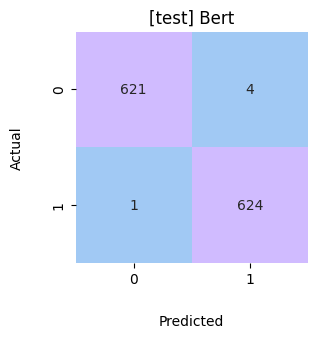

accuracy:	0.996
precision:	0.9960114281033035
recall:		0.996
f1:		0.9959999769598673


In [ ]:
ypred = []
for comment in tqdm(Xtest['question']):
    ypred.append(predict(comment, model, tokenizer, DEVICE))
get_metrics(ytest, ypred, '[test] Bert')

In [ ]:
import json
with open('qa_id.json', 'r', encoding='utf-8') as f:
    qa_dataset = json.load(f)
print(len(qa_dataset))
questions = [item['question'].lower() for item in qa_dataset]
questions[:5]

300


['какие действующие вещества содержатся в мази белогент® и в каких количествах?',
 'как правильно применять мазь белогент® и какова максимальная продолжительность лечения?',
 'какие существуют особые предосторожности при применении мази белогент® для детей и на лице?',
 'какие активные вещества содержит препарат белосалик® и в каких количествах они присутствуют?',
 'как правильно применять мазь белосалик® для лечения кожи у детей?']

In [ ]:
questions = df_wiki['question'][:2000].tolist()
questions[:5]

['Какая птица семейства славковых (лат. Sylvia borin)?',
 'На какой территории савакоты проживали помимо своей коренной территории?',
 'Кто такой Ярмусик Эдмунд Станиславович?',
 'Кто занимался организацией команды?',
 'Какой писатель был народным писателем Грузинской ССР?']

In [ ]:
questions = df_med['question'][:1000].tolist()
questions[:5]

['Ларипронт 20 талеток,через каждые 2-3 часа.Очень понравились,но пока принимала,чувствовала себя хорошо. Закончились-все сиптомы опять проявились. Нигде не найду как долго их можно принимать. Скажите пожалуйста',
 'Принимаю Азофен. У меня экстрасистолы. Назначили рибоксин, аспаркам, и уколы милдронат. Можно ли их принимать вместе с азофеном?',
 'Здравствуйте,моей внучке назначили препарат железа,но она принимает уже 10 лет Эутирокс,врапч сказал вместе принимать и запивать фруктовым соком,а ведь после Эутирокса 30 мин есть нельзя и как быть? Спаси',
 'Здравствуйте,помогите подобрать препараты и схему их приема от высокого АД, мне 61 год,  перенесла 25.07.17г. ишемический инсульт в бассейне ВБА, осложненный гипертонический криз.\n            \n            Назначили -Лизиноприл  10мг утром, но мне от него было плохо, отдышка, скачки АД.\n            \n            До приема у терапевта, сама, на свой страх и риск, стала принимать Физиотенз-0,2 мгх2р в день, мне стало лучше, уменьшилась от

In [ ]:
ypred = []
for comment in tqdm(questions):
    ypred.append(predict(comment))

  0%|          | 0/300 [00:00<?, ?it/s]

In [ ]:
ypred = np.array(ypred)
hits = ypred.sum()
print(f'{hits}/{len(ypred)}')

296/300


In [ ]:
np.array(questions)[ypred.argsort()]

array(['какие витамины входят в состав хепиклим?',
       'что делать, если пена из баллончика не выходит?',
       'как распознать дефицит магния?',
       'что делать при попадании шампуня белосалик® салик в глаза?',
       'какие действующие вещества содержатся в мази белогент® и в каких количествах?',
       'какой из препаратов (эдарби® кло или новиган® леди) противопоказан при беременности?',
       'какой из препаратов (фортелизин® или мексидол®) применяется при остром инфаркте миокарда?',
       'какой из препаратов (эргоферон® или лавомакс® нео) можно применять у детей с 6 месяцев?',
       'какие противопоказания у препарата субетта®?',
       'какие действующие вещества входят в состав ренгалина®?',
       'какие побочные эффекты возможны при приеме колофорта®?',
       'можно ли принимать афалазу® женщинам?',
       'какое действующее вещество в препарате урорек?',
       'через сколько достигается максимальная концентрация бромфенака в водянистой влаге глаза?',
       'ког

In [ ]:
SAVE_DIR = 'roberta/rag_classifier_v4'

In [ ]:
model.save_pretrained(SAVE_DIR)
tokenizer.save_pretrained(SAVE_DIR)

('roberta/rag_classifier_v4\\tokenizer_config.json',
 'roberta/rag_classifier_v4\\special_tokens_map.json',
 'roberta/rag_classifier_v4\\vocab.json',
 'roberta/rag_classifier_v4\\merges.txt',
 'roberta/rag_classifier_v4\\added_tokens.json')

In [ ]:
model = AutoModelForSequenceClassification.from_pretrained(
    SAVE_DIR,
    device_map='auto'
)
tokenizer = RobertaTokenizer.from_pretrained(SAVE_DIR)

# Inference

## imports

In [ ]:
from transformers import (
    AutoModelForSequenceClassification,
    AutoTokenizer,
    AutoModel,
)
from tqdm.auto import tqdm
from llama_cpp import Llama

from langchain_core.documents import Document
from langchain_qdrant import QdrantVectorStore
from langchain_core.prompts import PromptTemplate
from langchain_qdrant import FastEmbedSparse, RetrievalMode
from langchain_huggingface.embeddings import HuggingFaceEmbeddings

from qdrant_client import QdrantClient, models
from qdrant_client.http.models import Distance, SparseVectorParams, VectorParams

from huggingface_hub import snapshot_download, hf_hub_download


import gc
import torch
import numpy as np


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DEVICE, torch.__version__

C:\Users\Дмитрий\AppData\Roaming\Python\Python310\site-packages\scipy\__init__.py:169: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


(device(type='cuda'), '2.7.0+cu126')

## load models

In [ ]:
FILTER_MODEL_DIR = 'roberta/rag_classifier_v4'
filter_model = AutoModelForSequenceClassification.from_pretrained(
    FILTER_MODEL_DIR,
    device_map='auto'
)
filter_tokenizer = AutoTokenizer.from_pretrained(FILTER_MODEL_DIR)
filter_model.eval()
print('filter model loaded')

filter model loaded


In [ ]:
EMBEDS_MODEL_NAME = 'codefuse-ai/F2LLM-v2-0.6B'
EMBEDS_LOCAL_DIR = 'embeddings/F2LLM-v2-0.6B'
# EMBEDS_MODEL_NAME = 'codefuse-ai/F2LLM-v2-330M'
# EMBEDS_LOCAL_DIR = 'embeddings/F2LLM-v2-330M'
_ = snapshot_download(
    repo_id=EMBEDS_MODEL_NAME,
    local_dir=EMBEDS_LOCAL_DIR,
    ignore_patterns=['*.bin', 'onnx/', 'openvino/']
)
query_encode_prefix = 'Instruct: Given a question, retrieve passages that can help answer the question.\nQuery: '
doc_encode_prefix = ''
print(f'doc_encode_prefix: {doc_encode_prefix}')
print(f'query_encode_prefix: {query_encode_prefix}')
embeddings = HuggingFaceEmbeddings(
    model_name=EMBEDS_LOCAL_DIR,
    encode_kwargs={'prompt': doc_encode_prefix},
    query_encode_kwargs={'prompt': query_encode_prefix},
)
sparse_embeddings_name = 'Qdrant/BM25'
sparse_embeddings = FastEmbedSparse(model_name=sparse_embeddings_name)
print('embeddings model loaded')

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

doc_encode_prefix: 
query_encode_prefix: Instruct: Given a question, retrieve passages that can help answer the question.
Query: 
embeddings model loaded


In [ ]:
RERANK_MODEL_NAME = 'jinaai/jina-reranker-v3'
RERANK_LOCAL_DIR = 'models/jina-reranker-v3'
_ = snapshot_download(
    repo_id=RERANK_MODEL_NAME,
    local_dir=RERANK_LOCAL_DIR,
    ignore_patterns=['*.bin', 'onnx/', 'openvino/']
)
rerank_model = AutoModel.from_pretrained(
    RERANK_LOCAL_DIR,
    dtype='auto',
    device_map='auto',
    trust_remote_code=True,
)
rerank_model.eval()
print(rerank_model.device)
print('rerank model loaded')

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

cuda:0
rerank model loaded


In [ ]:
LLM_MODEL_REPO = 'unsloth/Qwen3.5-4B-GGUF'
LLM_MODEL_NAME = 'Qwen3.5-4B-Q4_0.gguf'
LLM_LOCAL_DIR = f'models/{LLM_MODEL_NAME}'
_ = snapshot_download(
    repo_id=LLM_MODEL_REPO,
    local_dir=LLM_LOCAL_DIR,
    allow_patterns=LLM_MODEL_NAME
)

llm_model = Llama(
    model_path=f'{LLM_LOCAL_DIR}/{LLM_MODEL_NAME}',
    n_ctx=2048,
    n_gpu_layers=-1,
    verbose=False
)
print('llm model loaded')

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

llama_context: n_ctx_seq (2048) < n_ctx_train (262144) -- the full capacity of the model will not be utilized


llm model loaded


## pipeline

### filter model

In [ ]:
def filter_model_predict(question, filter_model, filter_tokenizer):
    inputs = filter_tokenizer(question.lower(), return_tensors='pt').to(DEVICE)
    with torch.no_grad():
        logits = filter_model(**inputs).logits
    predicted_class_id = logits.argmax().item()
    return predicted_class_id

In [ ]:
filter_model_predict('как у тебя дела?', filter_model, filter_tokenizer)

0

### retrieval

In [ ]:
if 'client' not in locals():
  client = QdrantClient(path="qdrant")
CHUNK_SIZE = 1280
CHUNK_OVERLAP = 32
collection_name=f'F2LLM-v2-0.6B_{CHUNK_SIZE}_{CHUNK_OVERLAP}'
HYBRID = True
SUFFIX = '_hybrid'
vector_size=len(embeddings.embed_query(''))
if HYBRID and not collection_name.endswith(SUFFIX):
    collection_name += SUFFIX
elif not HYBRID:
    assert not collection_name.endswith(SUFFIX)
collection_info = [collection_name, vector_size, embeddings.model_name]
if HYBRID:
    collection_info.append(sparse_embeddings_name)
collection_info

info = client.get_collection(collection_name)
print(info.points_count, info.config.params.vectors)

5021 {'dense': VectorParams(size=1024, distance=<Distance.COSINE: 'Cosine'>, hnsw_config=None, quantization_config=None, on_disk=True, datatype=None, multivector_config=None)}


In [ ]:
def rerank_documents(question, documents, rerank_model, include_scores=False, batch_size=2):
    content = [doc.page_content for doc in documents]
    results = rerank_model.rerank(question, content)
    indexes, scores = zip(*[(result['index'], result['relevance_score']) for result in results])
    documents = [documents[index] for index in indexes]
    documents = sorted(zip(documents, scores), key=lambda x: x[1], reverse=True)
    if not include_scores:
        documents, _ = zip(*documents)
    return list(documents)


class RerankRetriever:
    def __init__(self, retriever, rerank_model, rerank_factor=2):
        self.retriever = retriever
        self.rerank_model = rerank_model
        self.rerank_factor = rerank_factor


    def invoke(self, question, k=3, k_prefetch=None):
        documents = self.retriever.invoke(question, k * self.rerank_factor)
        documents = rerank_documents(question, documents, self.rerank_model, include_scores=False, batch_size=2)
        documents = documents[:k]
        return documents


class HybridRetriever:
    def __init__(self, client, collection_name, embeddings, sparse_embeddings, retrieval_type='hybrid'):
        self.client = client
        self.collection_name = collection_name
        self.embeddings = embeddings
        self.sparse_embeddings = sparse_embeddings
        assert retrieval_type in ['hybrid', 'dense', 'sparse', 'all']
        self.retrieval_type = retrieval_type


    def invoke(self, question, k=3, k_prefetch=None):
        if k_prefetch is None:
            k_prefetch = k * 10
        query_sparse_embeddings = self.sparse_embeddings.embed_query(question)
        query_sparse_embeddings = models.SparseVector(
            indices=query_sparse_embeddings.indices,
            values=query_sparse_embeddings.values
        )
        query_dense_embeddings = self.embeddings.embed_query(question)
        points = []
        if self.retrieval_type == 'hybrid':
            prefetch = [
                models.Prefetch(
                    query=query_dense_embeddings,
                    using='dense',
                    limit=k * 2,
                ),
                models.Prefetch(
                    query=query_sparse_embeddings,
                    using='sparse',
                    limit=k * 2,
                )
            ]
            query_result = self.client.query_points(
                collection_name=self.collection_name,
                prefetch=prefetch,
                query=models.FusionQuery(fusion=models.Fusion.RRF),
                with_payload=True,
                limit=k
            )
            points += query_result.points
        if self.retrieval_type == 'dense' or self.retrieval_type == 'all':
            query_result = self.client.query_points(
                collection_name=self.collection_name,
                query=query_dense_embeddings,
                using='dense',
                limit=k
            )
            points += query_result.points
        if self.retrieval_type == 'sparse' or self.retrieval_type == 'all':
            query_result = self.client.query_points(
                collection_name=self.collection_name,
                query=query_sparse_embeddings,
                using='sparse',
                limit=k
            )
            points += query_result.points
        query_result = [point.payload for point in points]
        query_result = [Document(**doc) for doc in query_result]
        return query_result


def filter_docs(docs):
    return docs
    docs_filtered = []
    sources = set()
    for doc in docs:
        metadata = f'{doc.metadata["text"]}.{doc.metadata["row"]}'
        if metadata not in sources:
            sources.add(metadata)
            docs_filtered.append(doc)
    return docs_filtered


def retrieve(retriever, question, k=None):
    retrieved_docs = retriever.invoke(question, k=k) if k is not None else retriever.invoke(question)
    retrieved_docs = filter_docs(retrieved_docs)
    return retrieved_docs


def retrieve_batched(retriever, questions, max_concurrency=8, k=None):
    if k is not None:
        docs_batch = retriever.batch(questions, config={'max_concurrency': max_concurrency}, k=k)
    else:
        docs_batch = retriever.batch(questions, config={'max_concurrency': max_concurrency})
    docs_batch = [filter_docs(docs) for docs in docs_batch]
    return docs_batch

In [ ]:
# question = 'Какой из препаратов (Урорек или ТАБАКЕТТЕ®) противопоказан при тяжелой артериальной гипертензии, и почему?'
hybrid_retriver = HybridRetriever(client, collection_name, embeddings, sparse_embeddings, retrieval_type='dense')
# documents=retrieve(hybrid_retriver, question, k=2)
# documents

In [ ]:
rerank_retriever = RerankRetriever(hybrid_retriver, rerank_model, rerank_factor=2)
# documents=retrieve(rerank_retriever, question, k=2)
# documents

In [ ]:
torch.cuda.empty_cache()
gc.collect()

2325

### llm

In [ ]:
template = """Ответь на вопрос чистым текстом кратко используя контекст ниже:
{context}

Вопрос: {question}

Ответ:"""
prompt = PromptTemplate.from_template(template)


def generate_llm_answer(question, retriever, llm_model, prompt, max_tokens=128):
    def format_docs(docs):
        return '\n'.join([f'{doc.metadata["searchname"]}: {doc.page_content}' for doc in docs])

    def format_newlines(text):
        return text.replace('\n', ' ').strip()


    docs_retrieved = retrieve(retriever, question)
    ctx = format_docs(docs_retrieved)
    user_content = prompt.format(context=ctx, question=question)
    output = llm_model.create_chat_completion(
        messages=[{'role': 'user', 'content': user_content}],
        temperature=0.7,
        top_p=0.8,
        top_k=20,
        min_p=0.0,
        presence_penalty=1.5,
        max_tokens=max_tokens
    )
    answer = output['choices'][0]['message']['content']

    return answer

In [ ]:
torch.cuda.empty_cache()
gc.collect()

0

## demo

In [ ]:
def generate_rag_answer(question):
    label = filter_model_predict(question, filter_model, filter_tokenizer)
    if label:
        answer = generate_llm_answer(question, rerank_retriever, llm_model, prompt, max_tokens=256)
        if 'нет информации' in answer:
            answer = 'К сожалению, пока не обладаю информацией по данному вопросу, попробуйте задать другой.'
    else:
        answer = 'К сожалению, ничем не могу помочь, моя специализация - вопросы по лекарственным препаратам.'
    return answer

gc.collect()
torch.cuda.empty_cache()
question = 'можно ли мне применять препарат блогир если у меня неперносимость лекарств из греции?'
generate_rag_answer(question)

In [ ]:
!python --version

Python 3.10.17
